# Make Stats And Figs

A dedicated notebook for generating statistics and figures from sorting data.

Run after executing core modules. Will pull information from cached sorting and recording files in `sortings/`

In [2]:
!jupyter nbconvert --to script marshmakestatsandfigs-class.ipynb --TagRemovePreprocessor.remove_cell_tags='{"note"}' --output-dir /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms --output figures

[NbConvertApp] Converting notebook marshmakestatsandfigs-class.ipynb to script
[NbConvertApp] Writing 35702 bytes to /mnt/isilon/marsh_single_unit/MarshMountainSort/pys-class/mms/figures.py


In [3]:
import os
import sys

# sys.path.append(os.path.abspath(".."))
sys.path.insert(0, os.path.abspath('..'))

# os.path.abspath("../")


In [4]:
# Python standard library
import csv
import datetime
import glob
import gzip
import os
import re
import shutil
import tempfile
from abc import ABC, abstractmethod
from concurrent.futures import ThreadPoolExecutor
from functools import reduce
from multiprocessing import Pool
from pathlib import Path
from textwrap import wrap
from typing import Literal
from warnings import warn, catch_warnings, simplefilter, filterwarnings
from tqdm.auto import tqdm as tqdmauto
from tqdm.dask import TqdmCallback

# Third party packages
import dateutil.parser as dparser
import matplotlib.pyplot as plt
import mountainsort5 as ms5
import numpy as np
import pandas as pd
import scipy.cluster.hierarchy as shc
import seaborn as sns
import spikeinterface.core as si
import spikeinterface.extractors as se
import spikeinterface.postprocessing as spost
import spikeinterface.qualitymetrics as sqm
import spikeinterface.widgets as sw
from mountainsort5.util import create_cached_recording
from scipy.optimize import curve_fit
from scipy.signal import convolve, savgol_coeffs, savgol_filter, windows
from scipy.stats import norm, skewnorm, zscore
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances
from sklearn.preprocessing import StandardScaler
# from statannotations.Annotator import Annotator
from pandarallel import pandarallel
import dask
from dask import delayed
from dask.distributed import Client
from dask.diagnostics import ProgressBar

# Local imports
from mms import constants, core
from mms.parser import FolderPathParser

In [5]:
core.set_tempdir('/scr1/users/dongjp')


In [6]:
class DepthSheetReader():
    
    df_depths:pd.DataFrame = None
    df_optdepth:pd.DataFrame = None

    def __init__(self, base_folder: str, sortdir_name: str = 'sortings', truncate: bool = False, verbose: bool = True, omit: list[str] = []) -> None:
        self.base_folder = Path(base_folder)
        self.sortdir_name = sortdir_name
        self.sort_folder = self.base_folder / sortdir_name
        self.truncate = truncate
        self.verbose = verbose
        self.omit = omit

        self.sort_folders = self._glob_all_folders(self.sortdir_name)
        self.sort_all_ids = self._get_all_ids()

    # Theres some overlap in function implementation with core.IAnimalAnalyer,
    # but functionality > maintainability
    def _glob_all_folders(self, base_subdir_name:str):
        searchstring = self.base_folder / base_subdir_name / '*'
        subfolders = glob.glob(str(searchstring))
        subfolders = list(set(subfolders))
        subfolders = [x for x in subfolders if os.path.isdir(x)]
        subfolders = [x for x in subfolders if not any(substring in x for substring in self.omit)]
        subfolders.sort()
        return subfolders

    def make_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        # self.sort_folders = self._glob_all_folders(self.sortdir_name)
        names = [FolderPathParser.parse_name(f) for f in self.sort_folders]
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        genotypes = [FolderPathParser.parse_genotype(f) for f in self.sort_folders]
        dates = [FolderPathParser.parse_date(f) for f in self.sort_folders]
        df = pd.DataFrame({'folder' : self.sort_folders,
                           'name' : names,
                           'id' : ids,
                           'genotype' : genotypes,
                           'date' : dates,
                           'depth' : np.nan * len(self.sort_folders)})
        # df['id'] = df['id'].astype(str)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['depth']).tolist() # Without dropping depth this would just be concat
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)
            # Pull last value updated in the spreadsheet for each recording
            mapping = {'depth':'depth', 'depth_y':'depth'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index('name').T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out
            
        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    
    def read_filenametodepth_xlsx(self, xlsx_name:str='filename-to-depth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
        DepthSheetReader.df_depths = df
        return df
    
    @staticmethod
    def get_row_from_depth_df(identifier:int, region:str, depth:float=None, name:str=None):
        if depth is None and name is None:
            raise TypeError("Cannot have both depth and name as None")
        mask = DepthSheetReader.df_depths['id'] == identifier
        if depth is not None and depth == depth:
            mask = mask & (DepthSheetReader.df_depths['depth'] == depth)
        if name is not None and name == name:
            mask = mask & (DepthSheetReader.df_depths['name'] == name)

        df_mask = DepthSheetReader.df_depths[mask]
        if len(df_mask.index) == 0:
            warn("No match found for criteria")
            return None
        elif len(df_mask.index) >= 2:
            raise ValueError("Too many matches found for criteria")

        return df_mask.iloc[0]

    @staticmethod
    def __validate_and_get_dfdepth() -> pd.DataFrame:
        if DepthSheetReader.df_depths is None:
            raise TypeError('df_depths was not generated yet')
        return DepthSheetReader.df_depths

    @staticmethod
    def parse_depth(path:str):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        name = FolderPathParser.parse_name(path)
        value = df.loc[df['name'] == name, 'depth']
        if len(value.index) == 0:
            raise IndexError('Path not found: {path}')
        elif len(value.index) >= 2:
            raise ValueError('Too many depths found for path: {path}')
        return value.iloc[0]

    def plot_all_depths_regions(self, identifier:int, output_subdir:str, sort_by_depth=True, save_figs=True, 
                                location_method: Literal['monopolar_triangulation', 'center_of_mass'] = 'monopolar_triangulation', **kwargs):
        df = DepthSheetReader.__validate_and_get_dfdepth()
        df = df[df['id'] == identifier]
        if sort_by_depth:
            if len(df.index) == 0:
                raise KeyError(f'ID {identifier} not found in depth short spreadsheet. sort_by_depth=True')
            df = df.sort_values(['depth', 'date', 'name'], ascending=[True, True, True])
            order = df['name'].tolist()
        else:
            order = None
        
        asl = core.AnimalSortLoader(self.base_folder, identifier=identifier, sortdir_name=self.sortdir_name)    
        
        for region in constants.REGIONS:
            asl.load_sortings_df()
            asl.extract_analyzers_df()

            asl.compute_extension_df(extension='random_spikes', region=region, max_spikes_per_unit=1000, **kwargs)
            asl.compute_extension_df(extension='waveforms', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='templates', region=region, ms_before=1.0, ms_after=2.0, **kwargs)
            asl.compute_extension_df(extension='spike_locations', region=region, ms_before=1.0, ms_after=2.0, method=location_method, **kwargs)
            # asl.compute_extension_df(extension='spike_locations', region=region, ms_before=0.5, ms_after=0.5, method='center_of_mass')

            tempsavepath = asl.base_folder / Path(output_subdir) / str(asl.identifier) / region
            if sort_by_depth:
                titles = df.apply(self.__get_title_from_row, axis=1, region=region).tolist()
            else:
                titles = None
            plot_params = {'region' : region,
                           'max_cols' : 10,
                           'order' : order,
                           'titles' : titles}
            asl.plot_units_oneregion(xybound_location=(-30, 30), plot_type='location', save_path=tempsavepath / 'location' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_heatmap=(-200, 100), plot_type='heatmap', save_path=tempsavepath / 'heatmap' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='waveform', save_path=tempsavepath / 'waveform' if save_figs else None, **plot_params)
            asl.plot_units_oneregion(ybound_wavetemp=(-40, 40), plot_type='template', save_path=tempsavepath / 'template' if save_figs else None, **plot_params)

            
    def __get_title_from_row(self, x:pd.Series, region:str):
        name = x['name']
        name = '\n'.join(wrap(name, 40))
        return f"{name}\n{x.id} | {x.genotype} | {x.depth} turns | {x.date.strftime(r'%m/%d/%Y')} | {region}"

    def _get_all_ids(self):
        ids = [FolderPathParser.parse_id(f, as_int=True) for f in self.sort_folders]
        ids = list(set(ids))
        ids.sort()
        return ids

    def make_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', read_old:bool=True):
        
        sort_regs = sorted(constants.REGIONS)
        df = pd.DataFrame(
            {'id' : self.sort_all_ids,
            'region' : [sort_regs] * len(self.sort_all_ids),
            'best_depth' : [None] * len(self.sort_all_ids),
            'name' : [None] * len(self.sort_all_ids)}
        )
        df = df.explode(column='region')
        df = df.reset_index(drop=True)
        today = datetime.date.today().strftime(r'%m-%d-%Y')
        out_path = self.base_folder / xlsx_dir_name / xlsx_name

        if read_old:
            # Merge all old spreadsheets
            cols = df.columns.drop(['best_depth', 'name']).tolist()
            dfs_old = pd.read_excel(out_path, sheet_name=None, index_col=0)
            dfs_old = list(dfs_old.values())
            dfs = [df] + dfs_old
            df_merge = reduce(lambda left,right: pd.merge(left, right, on=cols, how='outer', suffixes=('', '_y')), 
                              dfs)

            # Pull last value updated in the spreadsheet for each recording
            mapping = {'best_depth':'best_depth', 'best_depth_y':'best_depth',
                       'name':'name', 'name_y':'name'}
            mapping.update({k:v for k,v in zip(cols, cols)})
            df_last:pd.DataFrame = df_merge.set_index(['id', 'region']).T.groupby(mapping).last()
            df_last = df_last.T.reset_index().fillna(value=np.NaN)
            df_out = df_last[df.columns]
            
            df = df_out

        with pd.ExcelWriter(out_path, engine='openpyxl', mode='a', if_sheet_exists='new') as writer:
            df.to_excel(writer, sheet_name=today)
    

    def read_animaltobestdepth_xlsx(self, xlsx_name:str='animal-to-bestdepth.xlsx', xlsx_dir_name:str='xlsxs', sheet_name=-1, drop_na:bool=True):
        sheet_path = self.base_folder / xlsx_dir_name / xlsx_name
        if sheet_name is None:
            df = pd.read_excel(sheet_path, sheet_name=-1, index_col=0)
        else:
            df = pd.read_excel(sheet_path, sheet_name=sheet_name, index_col=0)
            
        if drop_na:
            df = df.dropna(how='all', subset=['best_depth', 'name'])
            df = df.reset_index(drop=True)
        
        DepthSheetReader.df_optdepth = df
        return df
    

In [7]:
%%script true
dsr = DepthSheetReader('/mnt/isilon/marsh_single_unit/MarshMountainSort')
dsr.read_filenametodepth_xlsx()
# new_recs_ids = [x for x in dsr.sort_all_ids if 525 <= x < 600]
new_recs_ids = [537]
# print(new_recs_ids)
for identifier in new_recs_ids:
    dsr.plot_all_depths_regions(identifier, output_subdir='output-depthsort/New Anims 12-2-24', sort_by_depth=True, save_figs=False,
                                location_method='center_of_mass', **constants.FAST_JOB_KWARGS)



In [8]:
class IExperimentAnalyzer(ABC):
    EXTENSION_PARAMS = {
        'random_spikes' : {'max_spikes_per_unit':1000},
        # 'waveforms' : dict({'ms_before':1.0, 'ms_after':2.0}, **constants.FAST_JOB_KWARGS),
        'waveforms' : {'ms_before':1.0, 'ms_after':2.0},
        'templates' : {'ms_before':1.0, 'ms_after':2.0},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'center_of_mass'},
        # 'spike_locations' : {'ms_before':1.0, 'ms_after':2.0, 'method':'monopolar_triangulation'},
        # 'principal_components' : {'mode':'concatenated'},
        'principal_components' : {'mode':'by_channel_local'},
        # 'spike_amplitudes' : constants.FAST_JOB_KWARGS,
        'spike_amplitudes' : {},
        'noise_levels' : {},
    }
    # QUALITY_METRIC_FEATURES = sqm.get_quality_metric_list() + sqm.get_quality_pca_metric_list()
    # TEMPLATE_METRIC_FEATURES = spost.get_template_metric_names()
    QUALITY_METRIC_FEATURES = ['num_spikes', 'firing_rate', 'presence_ratio', 'snr',
       'isi_violations_ratio', 'isi_violations_count', 'rp_contamination',
       'rp_violations', 'sliding_rp_violation', 'amplitude_cutoff',
       'amplitude_median', 'amplitude_cv_median', 'amplitude_cv_range',
       'sync_spike_2', 'sync_spike_4', 'sync_spike_8', 'firing_range',
       'sd_ratio', 'isolation_distance', 'l_ratio', 'd_prime', 'silhouette',
       'nn_hit_rate', 'nn_miss_rate']
    TEMPLATE_METRIC_FEATURES = ['peak_to_valley', 'peak_trough_ratio',
       'half_width', 'repolarization_slope', 'recovery_slope',
       'num_positive_peaks', 'num_negative_peaks', 'velocity_above',
       'velocity_below', 'exp_decay', 'spread']
    DO_NOT_EXPLODE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'sa_savedir', 'rec_duration', 'n_units', 'waveform']
    UNIT_UNIQUE_FEATURES = ['id', 'region', 'best_depth', 'name', 'sa', 'sa_savedir', 'rec_duration', 'n_units', 'unit', 'waveform']
    BAD_FEATURES = ['sliding_rp_violation', 'velocity_above', 'velocity_below',
                    'amplitude_cutoff', 'amplitude_cv_median', 'amplitude_cv_range',
                    'exp_decay']
    
    @abstractmethod
    def __init__(self):
        super().__init__()
        self.df_all_units: pd.DataFrame = None
    
    def get_df(self, 
               drop_nan_rows=False, 
               drop_nan_ignorecols:list[str]=[], 
               drop_bad_cols=True, 
               drop_unit_unique_cols=False, 
               drop_extra_cols:list[str]=None, 
               drop_extra_cols_substr:list[str]=None,
               only_get_cols:list[str]=None,
               only_get_cols_substr:list[str]=None):
        df = self.df_all_units.copy()
        
        if only_get_cols is not None or only_get_cols_substr is not None:
            all_columns = []

            if only_get_cols is not None:
                all_columns.extend(only_get_cols)

            # Get list of cols using substrings
            if only_get_cols_substr is not None:
                for f in only_get_cols_substr:
                    all_columns.extend([x for x in df.columns if f in x])

            # Union with only_get_cols
            all_columns = list(set(all_columns))
            df = df.loc[:, all_columns]
            
        else:
            dropcols = []
            if drop_bad_cols:
                dropcols.extend(self.BAD_FEATURES)
            if drop_unit_unique_cols:
                dropcols.extend(self.UNIT_UNIQUE_FEATURES)
            if drop_extra_cols is not None:
                dropcols.extend(drop_extra_cols)
            if drop_extra_cols_substr is not None:
                matches = [[x for x in df.columns if substr in x] for substr in drop_extra_cols_substr]
                matches = [x for xs in matches for x in xs]
                # matches = np.array(matches)
                # matches = matches.flatten('C')
                dropcols.extend(matches)

            df = df.drop(dropcols, axis=1, errors='ignore')

        if drop_nan_rows:
            df = df.dropna(axis=0, subset=df.columns.difference(self.UNIT_UNIQUE_FEATURES + drop_nan_ignorecols))

        return df


In [9]:
class ExperimentFeatureExtractor(core.IAnimalAnalyzer, IExperimentAnalyzer):

    def __init__(self, base_folder: str, dsr:DepthSheetReader, sortdir_name: str = 'sortings', 
                 truncate: bool | int = False, verbose: bool = True, omit: list[str] = ...,
                 multiprocess: bool = True, ignore_warnings:bool=True, **kwargs):
        super().__init__(base_folder, '', '', sortdir_name, bool(truncate), verbose, omit)
        self._dsr = dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()
        self.ignore_warnings = ignore_warnings
        self.df_all_units: pd.DataFrame = self.__animal_to_best_depth_df.copy()
        if truncate:
            if type(truncate) is int:
                self.df_all_units = self.df_all_units.sample(truncate, random_state=43)
            else:
                self.df_all_units = self.df_all_units.sample(3, random_state=42)

        # Process rows in parallel using multiprocessing
        if multiprocess:
            # row_data = self.df_all_units.to_dict('records')
            # with Pool(processes=n_workers) as pool:
            #     # tqdm.__init__ = partialmethod(tqdm.__init__, leave=False) # REVIEW testing
            #     results = list(tqdmauto(
            #         pool.imap_unordered(self._init_process_row_no_sa, row_data, chunksize=chunksize),
            #         total=len(row_data),
            #         desc="Processing rows"
            #     ))

            # pandarallel.initialize(progress_bar=True)
            # results = self.df_all_units.parallel_apply(self._init_process_row_no_sa, axis=1)

            delayed_tasks = [delayed(self._init_process_row_no_sa)(row) for row in self.df_all_units.to_dict('records')]
            with TqdmCallback(desc='Processing rows'):
                results = dask.compute(*delayed_tasks)

        else:
            results = self.df_all_units.apply(self._init_process_row_no_sa, axis=1).to_dict('records')

        results = [x for x in results if x is not None] # remove rows with None sorting analyzers
        self.df_all_units = pd.DataFrame(results)

        # Load sorting analyzers from file
        self.df_all_units['sa'] = self.df_all_units['sa_savedir'].apply(lambda x: si.load_sorting_analyzer(x / 'result.zarr', format='zarr'))

    def _init_process_row_no_sa(self, row:dict):
        row: pd.Series = pd.Series(row)
        if self.verbose:
            print(f"Loading recording: {row['id']} {row['region']} {row['best_depth']} {row['name']}\n")
        folderpath = DepthSheetReader.get_row_from_depth_df(identifier=row['id'],
                                                            region=row['region'],
                                                            depth=row['best_depth'],
                                                            name=row['name']).folder
        sa = core.AnimalSortLoader.load_sortinganalyzer(folderpath, region=row['region'])
        if sa is None:
            return None

        temp_dir = Path(tempfile.gettempdir()) / os.urandom(24).hex()
        os.makedirs(temp_dir)
        row['sa'] = sa
        row['sa_savedir'] = temp_dir
        row['n_units'] = row['sa'].get_num_units()
        row['unit'] = list(range(1, row['sa'].get_num_units() + 1))
        row['rec_duration'] = row['sa'].get_total_duration()
        
        with catch_warnings():
            if self.ignore_warnings:
                filterwarnings('ignore')
            else:
                filterwarnings('ignore', message='With less than 10 channels, multi-channel metrics might not be reliable.')
                filterwarnings('ignore', message='`n_jobs` is not set so parallel processing is disabled!')
            
            for k, ext_kwargs in ExperimentFeatureExtractor.EXTENSION_PARAMS.items():
                sa.compute_one_extension(k, **(ext_kwargs))

            row = self.__compute_qm_row(row)
            row = self.__compute_tm_row(row)
            
        row = row.apply(lambda x: x.tolist() if isinstance(x, pd.Series) else x)
        sa.save_as(format='zarr', folder=row['sa_savedir'] / 'result.zarr')
        row.drop('sa', inplace=True)

        return row

    def __compute_qm_row(self, row: pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        # qm_ext = sa.compute('quality_metrics', skip_pc_metrics=False, **constants.FAST_JOB_KWARGS)
        qm_ext = sa.compute('quality_metrics', skip_pc_metrics=False)
        metrics = qm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def __compute_tm_row(self, row:pd.Series):
        sa:si.SortingAnalyzer = row['sa']
        # tm_ext = sa.compute('template_metrics', include_multi_channel_metrics=True, **constants.FAST_JOB_KWARGS)
        tm_ext = sa.compute('template_metrics', include_multi_channel_metrics=True)
        metrics = tm_ext.get_data()
        for col in metrics.columns:
            row[col] = metrics[col]
        return row
    
    def compute_mds_wave_features(self, n_components=4, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        df = df.apply(self.__compute_waveform_row, axis=1)
        
        # Apply MDS
        X_waves = df['waveform']
        X_waves = np.array(X_waves.tolist())
        dist_waves = euclidean_distances(X_waves) # Get L2 norm between waveforms
        mds = MDS(n_components=n_components, dissimilarity='precomputed')
        X_transform = mds.fit_transform(dist_waves)

        X_dict = {f'mds_wave_{i}' : X_transform[:, i] for i in range(X_transform.shape[1])}
        df = df.assign(**X_dict)
        
        if in_place:
            self.df_all_units = df
        return df
    
    def __compute_waveform_row(self, row: pd.Series):
        sa: si.SortingAnalyzer = row['sa']
        if sa is None:
            row['waveform'] = None
        else:
            unit = row['unit'] # NOTE this is still a list
            ext_tmp: si.AnalyzerExtension = sa.get_extension('templates')
            # Workaround since SortingAnalyzer lacks a direct get_template method
            data = ext_tmp.get_data()
            extremum_ch = si.get_template_extremum_channel(sa, outputs='index')[unit]
            wave = data[unit - 1, :, extremum_ch]
            wave = (wave - wave.mean()) / wave.std() # NOTE standardizing the waveform
            row['waveform'] = wave
        return row

    def explode_dataframe(self, in_place=True, df=None):
        """
        Run this after quality or template metrics.
        """
        df = self.df_all_units if df is None else df
        explodecols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        explodecols = [x for x in explodecols if x in df.columns]
        df = df.explode(explodecols)
        if in_place:
            self.df_all_units = df
        return df

    def convert_datatypes(self, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES, sort=False)
        replace_dict = {'<NA>':np.nan, 'NA':np.nan, pd.NA:np.nan, None:np.nan}
        replace_dict = {x : replace_dict for x in datacols}
        df = df.replace(replace_dict)
        df = df.convert_dtypes()
        if in_place:
            self.df_all_units = df
        return df
    
    def find_outliers(self, mode: Literal['iqr', 'std'] = 'iqr', iqr_mult:float = 1.5, std_mult:float = 3, 
                        ignore_cols: list[str]=['num_spikes', 'isi_violations_count', 'rp_violations'], 
                        ignore_cols_substr: list[str]=['num_'], 
                        only_get_cols: list[str]=None,
                        only_get_cols_substr: list[str]=None,
                        plot_rejects:bool = True,
                        y_bound:list[int] = [-200, 100],
                        in_place=True, df: pd.DataFrame=None):
        
        df = self.df_all_units if df is None else df
        
        ignore_cols = [] if ignore_cols is None else ignore_cols
        # datacols = df.columns.difference(self.DO_NOT_EXPLODE_FEATURES + self.BAD_FEATURES + ignore_cols, sort=False)
        # print(datacols)
        datacols = self.get_df(drop_unit_unique_cols=True, 
                               drop_extra_cols=ignore_cols, 
                               drop_extra_cols_substr=ignore_cols_substr, 
                               only_get_cols=only_get_cols,
                               only_get_cols_substr=only_get_cols_substr).columns

        match mode:
            case 'iqr':
                dfiqr = df[datacols].quantile([0.25, 0.75])
                dfiqr.loc['iqr'] = dfiqr.iloc[1] - dfiqr.iloc[0]
                dfiqr.loc['min_bound'] = dfiqr.iloc[0] - iqr_mult * dfiqr.loc['iqr']
                dfiqr.loc['max_bound'] = dfiqr.iloc[1] + iqr_mult * dfiqr.loc['iqr']
                dfrange = dfiqr
            case 'std':
                std = df[datacols].std()
                mean = df[datacols].mean()
                dfrange = pd.concat([std, mean], axis=1)
                dfrange.loc['min_bound'] = dfrange['mean'] - std_mult * dfrange['std']
                dfrange.loc['max_bound'] = dfrange['mean'] + std_mult * dfrange['std']
            case _:
                raise ValueError(f'Invalid mode {mode}')
            
        df['reject'] = False
        for col in datacols:
            min_val = dfrange.loc['min_bound'][col]
            max_val = dfrange.loc['max_bound'][col]
            
            prev_reject = df['reject']
            df['reject'] = df['reject'] | (df[col] < min_val) | (df[col] > max_val)
            n_new_reject = df['reject'].sum() - prev_reject.sum()
            print(f'{col}: {n_new_reject} outliers')

            if plot_rejects and n_new_reject > 0:
                sas = df.loc[df['reject'] != prev_reject]
                fig, ax = plt.subplots(1, n_new_reject, figsize=(n_new_reject * 1.5, 1.5), squeeze=False, sharey=True)
                for i, (index, row) in enumerate(sas.iterrows()):
                    sw.plot_unit_waveforms_density_map(row['sa'], use_max_channel=True, unit_ids=[row['unit']], ax=ax[0, i])
                    ax[0, i].set_facecolor('black')
                    ax[0, i].set_ylabel('')
                    ax[0, i].set_title(f"{row['id']} {row['region']} #{row['unit']}")
                    ax[0, i].text(0.05, 0.05, f"n={row['num_spikes']} / {round(row['num_spikes']/row['rec_duration'], 2)} Hz", 
                            transform=ax[0, i].transAxes, 
                            ha='left', va='bottom', c='xkcd:orange', fontsize='small', fontweight='bold')
                    ax[0, i].set_ybound(y_bound)
                fig.suptitle(col, y=1.25)
            
        if in_place:
            self.df_all_units = df
        return df

    def compute_clusters(self, only_get_cols:list[str]=None, only_get_cols_substr: list[str] = None, threshold=0.7, reject_outliers=True, plot_tree=True, in_place=True, df=None):
        df = self.df_all_units if df is None else df
        
        features = self.get_df(drop_bad_cols=True).columns

        if only_get_cols_substr is not None:
            allfeats = self.get_df(only_get_cols=only_get_cols, only_get_cols_substr=only_get_cols_substr).columns
            allfeats = sorted(allfeats.tolist())
            print(f"Features used for clustering: {allfeats}")
            
            features = allfeats + self.UNIT_UNIQUE_FEATURES + ['reject']

        df2 = df.drop(df.columns.difference(features), axis=1, errors='ignore')
        df2 = df2.dropna(axis=0, subset=df2.columns.difference(self.DO_NOT_EXPLODE_FEATURES))
        if reject_outliers:
            if 'reject' in df2.columns:
                df2 = df2[~df2['reject']]
            else:
                warn("Dataframe missing 'reject' column. Skipping outlier rejection..")

        df3 = df2.drop(self.UNIT_UNIQUE_FEATURES, axis=1, errors='ignore')
        df3_std = StandardScaler().fit_transform(df3)

        clusters = shc.linkage(df3_std, method='ward', metric='euclidean', optimal_ordering=True)
        self.Z_linkage = clusters
        threshold = threshold * max(clusters[:,2])
        cluster_labels = shc.fcluster(Z=clusters, t=threshold, criterion='distance')

        df2 = df2.assign(cluster=cluster_labels)
        df2['cluster'] = pd.to_numeric(df2['cluster'])
        df2 = df2.drop(df2.columns.difference(list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])) + ['cluster']), axis=1)
        df = df.merge(df2, how='left', on=list(set(self.UNIT_UNIQUE_FEATURES) - set(['waveform'])))
        
        if plot_tree:
            fig, ax = plt.subplots(1, 1, figsize=(10, 6))
            shc.dendrogram(Z=clusters, ax=ax, color_threshold=threshold)
            ax.axhline(threshold, c='black', ls='--')
            plt.show()

        if in_place:
            self.df_all_units = df
        return df



In [10]:
class ExperimentPlotter(core.IAnimalAnalyzer, IExperimentAnalyzer):

    def __init__(self, base_folder:str, efe:ExperimentFeatureExtractor = None,
                 dsr:DepthSheetReader = None, sortdir_name:str = 'sortings', 
                 truncate: bool = False, verbose: bool = True):
        super().__init__(base_folder, '', '', sortdir_name, truncate, verbose, omit=None)
        self.df_all_units = efe.get_df(drop_bad_cols=False)
        self._dsr = dsr if dsr is not None else efe._dsr
        self.__filename_to_depth_df = self._dsr.read_filenametodepth_xlsx()
        self.__animal_to_best_depth_df = self._dsr.read_animaltobestdepth_xlsx()
        if truncate:
            self.df_all_units = self.df_all_units.sample(10)

    def __get_clusterdf_clusterids_colorvec(self, features:list[str]=None, random_state:int=None):
        df = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True, drop_extra_cols=['cluster'])
        if features is not None:
            df = df.drop(df.columns.difference(features), axis=1)
        if 'reject' in df.columns:
            df = df[~df['reject']]
            
        df_clusters = self.get_df(drop_nan_rows=True)
        cluster_ids = df_clusters["cluster"].to_numpy(int)
        colorvec = [f'C{int(x)}' for x in df_clusters['cluster']]
        return df, cluster_ids, colorvec

    def __aggregate_and_show_legend(self, ax):
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(), bbox_to_anchor=[1.05, 0.5], loc='center left')

    def plot_pca(self, features:list[str]=None):
        df_pca, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_pca = StandardScaler().fit_transform(df_pca)
        pca = PCA(n_components=2)
        X_transform = pca.fit_transform(df_pca)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('PCA Plot')
        plt.show()

    def plot_mds(self, features:list[str]=None, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.scatter(X_transform[i, 0], X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')

        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot')
        plt.show()

    def plot_mds_waveforms(self, features:list[str]=None, width=2, height_mult=0.1, random_state:int=None):
        df_mds, cluster_ids, colorvec = self.__get_clusterdf_clusterids_colorvec()

        waveforms = np.array(self.get_df(drop_nan_rows=True)['waveform'].tolist())
        waveforms *= height_mult
        xvals = np.linspace(-width/2, width/2, waveforms.shape[1])

        df_mds = StandardScaler().fit_transform(df_mds)
        mds = MDS(n_components=2, random_state=random_state)
        X_transform = mds.fit_transform(df_mds)

        fig, ax = plt.subplots(1, 1)
        for i in range(X_transform.shape[0]):
            ax.plot(xvals + X_transform[i, 0], waveforms[i, :] + X_transform[i, 1], c=colorvec[i], label=f'Cluster {cluster_ids[i]}')
            
        self.__aggregate_and_show_legend(ax)

        plt.title('MDS Plot with Waveforms')
        plt.show()

    def plot_cluster_waveforms(self):
        df_waves = self.get_df(drop_nan_rows=True, drop_nan_ignorecols=['cluster'], )
        # display(df_waves[df_waves['reject'] == True])
        df_waves.groupby('cluster', dropna=False).apply(self.__df_cluster_groupby_func)

    def __df_cluster_groupby_func(self, df: pd.DataFrame):
        n = df.index.size
        n_col = 10
        n_row = n // n_col + 1
        fig, axes = plt.subplots(n_row, n_col, figsize=(n_col*2, n_row*2), sharex=True, sharey=True, squeeze=False)
        axes[0, 0].set_aspect('equal')
        axes[0, 0].set_ylim(-20, 20)
        for i, (index, row) in enumerate(df.iterrows()):
            ax = axes[i // n_col, i % n_col]
            sw.plot_unit_waveforms(row['sa'],
                                    unit_ids=[row['unit']],
                                    templates_percentile_shading=None,
                                    alpha_waveforms=0.1,
                                    set_title=False,
                                    scale=1e16,
                                    same_axis=True,
                                    plot_legend=False,
                                    ax=ax)
            if row['reject']:
                ax.set_facecolor('xkcd:red orange')
            ax.set_title(f"{row['id']} {row['region']} #{row['unit']}")
            ax.text(0.05, 0.05, f"n={row['num_spikes']} / {round(row['num_spikes']/row['rec_duration'], 2)} Hz", 
                    transform=ax.transAxes, 
                    ha='left', va='bottom', c='black', fontsize='small', fontweight='bold')
        fig.suptitle(f"Cluster {df.name} waveforms", y=1.05, fontsize='xx-large')
        plt.show()


    def plot_feature_boxplots(self, by: Literal['cluster', 'region']='cluster', features:list[str]=None):
        
        df_box = self.get_df(drop_nan_rows=True, drop_unit_unique_cols=True)
        if features is not None:
            df_box = df_box.drop(df_box.columns.difference(features), axis=1)

        df_box.boxplot(by=by, **{'sharey':False, 'figsize':(20, 20)})
        plt.show()



    # def plot_region_boxplots(self):
    #     # Group by region, plot the values of each column
    #     pass
    

In [11]:
dsr = DepthSheetReader('/mnt/isilon/marsh_single_unit/MarshMountainSort')
# efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
#                                  truncate=True)


In [ ]:
truncate = False
efe = ExperimentFeatureExtractor('/mnt/isilon/marsh_single_unit/MarshMountainSort', dsr=dsr,
                                 truncate=truncate, multiprocess=True)


Processing rows:   0%|          | 0/63 [00:00<?, ?it/s]

Loading recording: 529 ca3o 7.0 nan

Loading recording: 1203 ca1o 2.5 1203_WT Bl6_don't know which turn + 5 half turn_after turning_02-22-17

Loading recording: 1227 ca1o 3.0 1227_Bl6 WT_6 half turns_after recovery_Day 2 morning_04-12-17

Loading recording: 579 ca1s 10.0 579-WT-GCG-M-20htL-20htR tetrodes 1-22-25_250122_164354

Loading recording: 1269 ca3 3.0 1269_EXP_Final Protocol 6th half turn Morning_recorded after recovery_8-2-2017

Loading recording: 1225 ca3 3.25 1225_Bl6 WT_6 half turns + 1-4th of a full turn_after turning_04-05-17

Loading recording: 1269 ca1o 3.25 1269_EXP_Final Protocol 6th half + 1_4th quarter turn Morning_recorded after recovery_8-3-2017

Loading recording: 619 ca3 9.0 619-WT-GCG-M-18htL-18htR tetrodes after handling 1-28-25_250128_113333



compute_waveforms:   0%|          | 0/1200 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/1802 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/1821 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/1999 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/981 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/653 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/1888 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/1311 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/981 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/6 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/6 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/653 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1888 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/5 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/5 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1200 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/5 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/7 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/5 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1999 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/7 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1311 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/5 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/5 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1821 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1802 [00:00<?, ?it/s]

Loading recording: 1234 ca1s 3.0 1234_Bl6 WT_6 half turns_after recovery_Day 2 morning_04-19-17



compute_waveforms:   0%|          | 0/1817 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/6 [00:00<?, ?it/s]

Loading recording: 613 ca1o 10.0 613-WT-GCG-M-20htL-20htR tetrodes 1-29-25_250129_092654



compute_waveforms:   0%|          | 0/13462 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/core/job_tools.py:103: UserWarning: `n_jobs` is not set so parallel processing is disabled! To speed up computations, it is recommended to set n_jobs either globally (with the `spikeinterface.set_global_job_kwargs()` function) or locally (with the `n_jobs` argument). Use `spikeinterface.set_global_job_kwargs?` for more information about job_kwargs.
  warnings.warn(
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/core/job_tools.py:103: UserWarning: `n_jobs` is not set so parallel processing is disabled! To speed up computations, it is recommended to set n_jobs either globally (with the `spikeinterface.set_global_job_kwargs()` function) or locally (with the `n_jobs` argument). Use `spikeinterface.set_global_job_kwargs?` for more information about job_kwargs.
  warnings.warn(
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10

calculate pc_metrics:   0%|          | 0/5 [00:00<?, ?it/s]

Loading recording: 537 ca3o 8.5 nan



compute_waveforms:   0%|          | 0/603 [00:00<?, ?it/s]

Loading recording: 1133 ca3 3.0 nan



compute_waveforms:   0%|          | 0/616 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/7 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1817 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/5 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/5 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/13462 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/603 [00:00<?, ?it/s]

Loading recording: 579 ca3o 10.0 579-WT-GCG-M-20htL-20htR tetrodes after 2nd handling 1-23-25_250123_113219



compute_waveforms:   0%|          | 0/363 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/8 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/5 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/363 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/8 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/616 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/5 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

Loading recording: 1234 ca1o 3.25 1234_Bl6 WT_6 half turns + 1-4ths of a full turn_after recovery_Day 1 night_04-19-17



compute_waveforms:   0%|          | 0/2036 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/core/job_tools.py:103: UserWarning: `n_jobs` is not set so parallel processing is disabled! To speed up computations, it is recommended to set n_jobs either globally (with the `spikeinterface.set_global_job_kwargs()` function) or locally (with the `n_jobs` argument). Use `spikeinterface.set_global_job_kwargs?` for more information about job_kwargs.
  warnings.warn(
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/postprocessing/template_metrics.py:292: UserWarning: With less than 10 channels, multi-channel metrics might not be reliable.
  warnings.warn(
/mnt/isilon/marsh_single_unit/MarshMountainSort/.venv/lib/python3.10/site-packages/spikeinterface/postprocessing/template_metrics.py:292: UserWarning: With less than 10 channels, multi-channel metrics might not be reliable.
  warnings.warn(
/mnt/isilon/marsh_single_unit/MarshMountainSort/.ven

Loading recording: 1233 ca3 3.0 1233_Bl6 WT_6 half turns_after turning_Day 1 morning_04-18-17



compute_waveforms:   0%|          | 0/1805 [00:00<?, ?it/s]

Loading recording: 556 ca1s 9.5 nan



compute_waveforms:   0%|          | 0/695 [00:00<?, ?it/s]

Loading recording: 537 ca3 7.5 nan



compute_waveforms:   0%|          | 0/923 [00:00<?, ?it/s]

Loading recording: 1227 ca1s 3.25 1227_Bl6 WT_6 half turns + 1-4th of a full turn_after recovery_Day 1 night_04-12-17



compute_waveforms:   0%|          | 0/1801 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/8 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/695 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/923 [00:00<?, ?it/s]

Loading recording: 502 ca1s 7.5 nan



compute_waveforms:   0%|          | 0/87733 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

Loading recording: 579 ca3 10.0 579-WT-GCG-M-20htL-20htR tetrodes 1-22-25_250122_164354



compute_waveforms:   0%|          | 0/1888 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1805 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/8 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/8 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/2036 [00:00<?, ?it/s]

Loading recording: 766 ca3 3.25 766_WT_Final Protocol Morning 6th half turn +1_4 _recorded_ after turning_7-28-2017



compute_waveforms:   0%|          | 0/1824 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/3 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/3 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1888 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/7 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/7 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1801 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/4 [00:00<?, ?it/s]

Loading recording: 529 ca3 7.0 nan



compute_waveforms:   0%|          | 0/653 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/6 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/6 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/653 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/4 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/4 [00:00<?, ?it/s]

spike_amplitudes:   0%|          | 0/1824 [00:00<?, ?it/s]

calculate pc_metrics:   0%|          | 0/3 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/3 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/3 [00:00<?, ?it/s]

Loading recording: 513 ca1s 7.5 nan



spike_amplitudes:   0%|          | 0/87733 [00:00<?, ?it/s]

compute_waveforms:   0%|          | 0/56655 [00:00<?, ?it/s]

mds_wave_3: 0 outliers
half_width: 2 outliers
amplitude_median: 1 outliers
mds_wave_2: 0 outliers
firing_rate: 1 outliers
mds_wave_1: 0 outliers
mds_wave_0: 0 outliers
peak_trough_ratio: 0 outliers
Features used for clustering: ['amplitude_median', 'firing_rate', 'half_width', 'mds_wave_0', 'mds_wave_1', 'mds_wave_2', 'mds_wave_3', 'peak_trough_ratio']


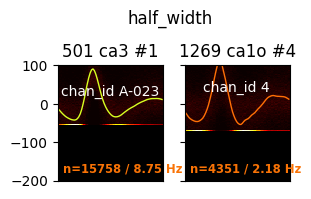

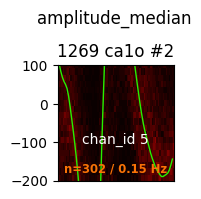

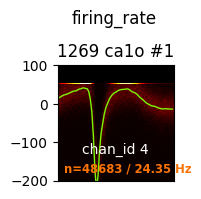

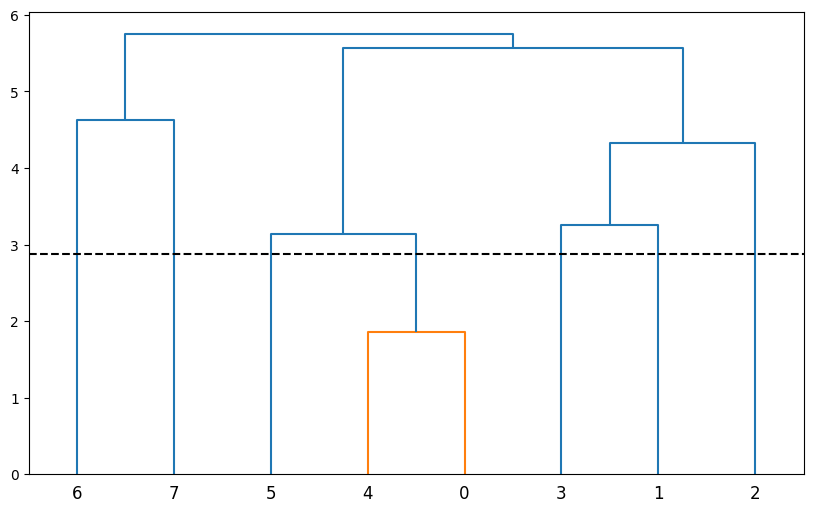

In [ ]:
# efe.remove_no_sa_rows()
efe.explode_dataframe()
efe.compute_mds_wave_features()
efe.convert_datatypes()
efe.find_outliers(iqr_mult=3, only_get_cols=['amplitude_median', 'peak_trough_ratio', 'firing_rate', 'half_width'], only_get_cols_substr=['mds_wave_'])
efe.compute_clusters(threshold=0.5, only_get_cols_substr=['amplitude_median', 'peak_trough_ratio', 'firing_rate', 'half_width', 'mds_wave_'])
efe2_df = efe.df_all_units.copy()

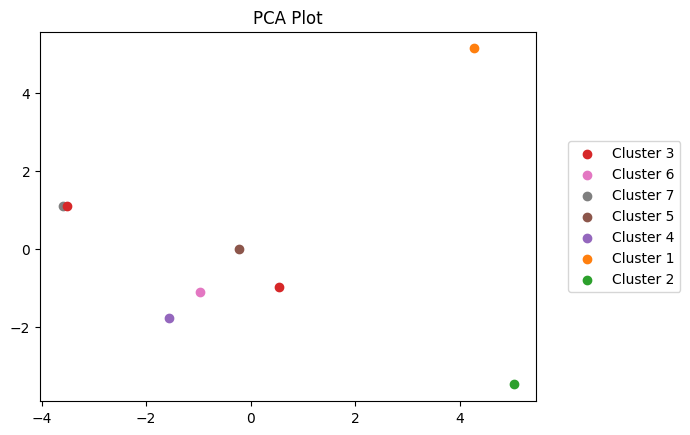

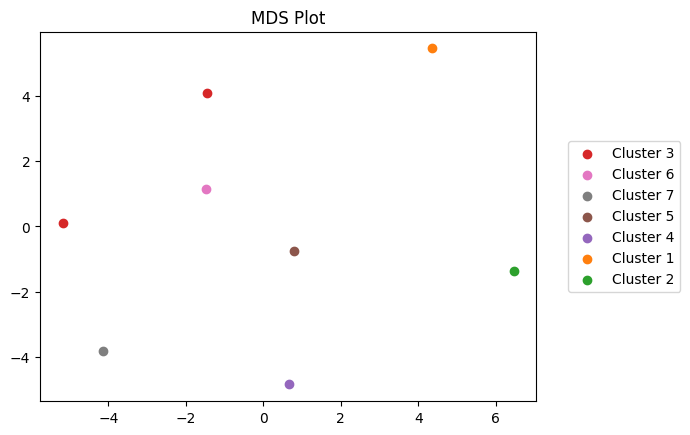

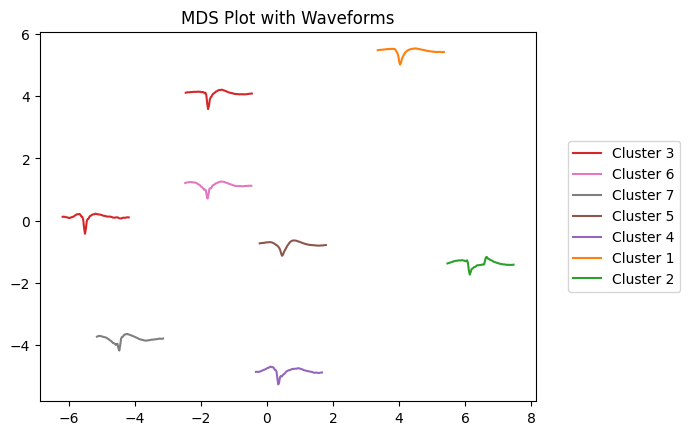

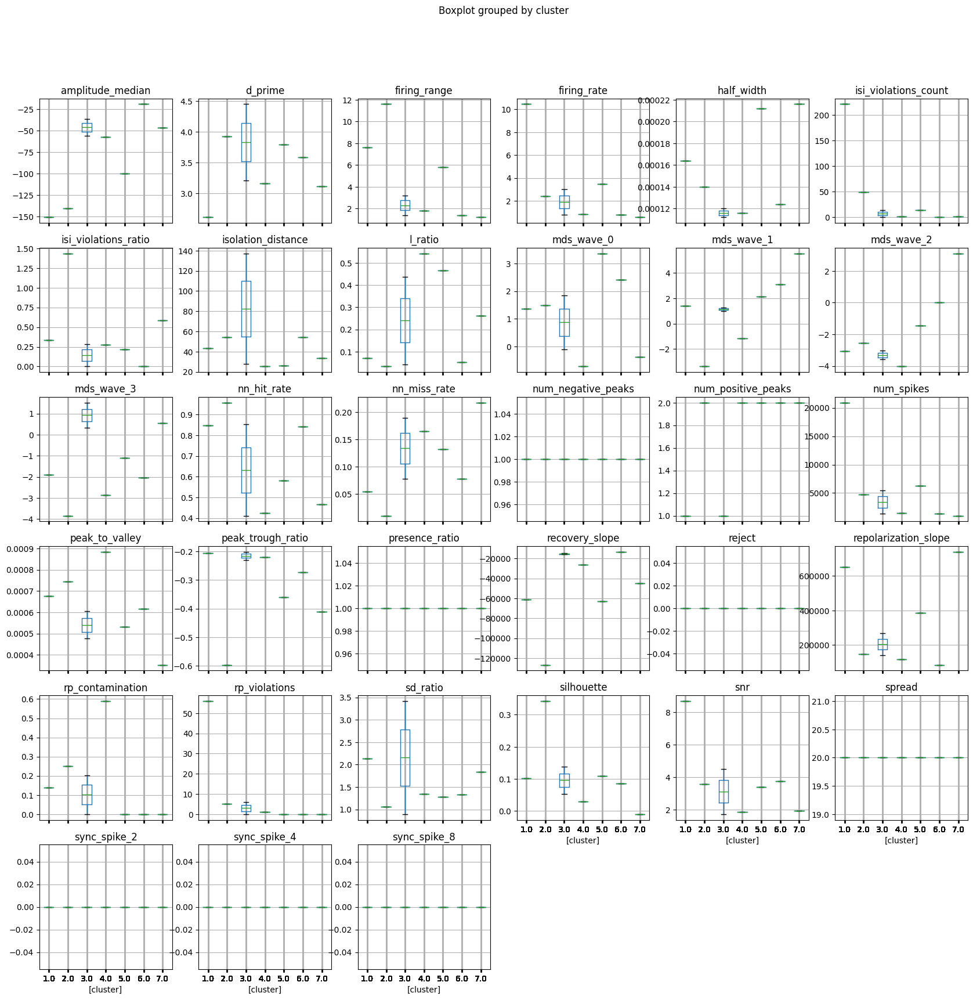

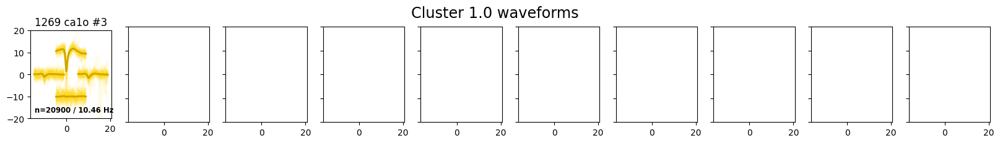

...

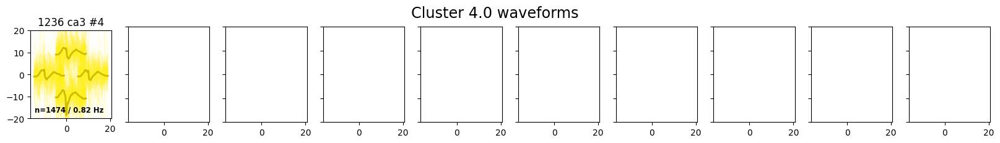

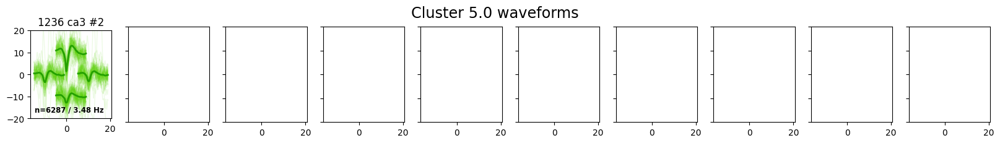

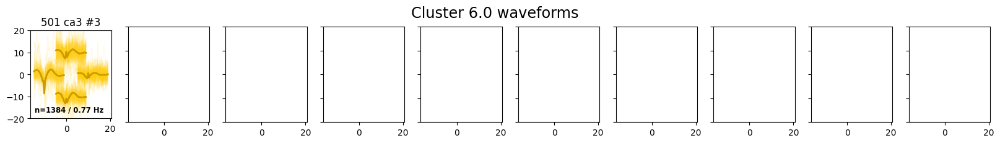

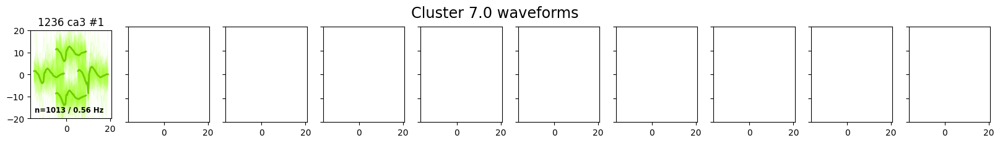

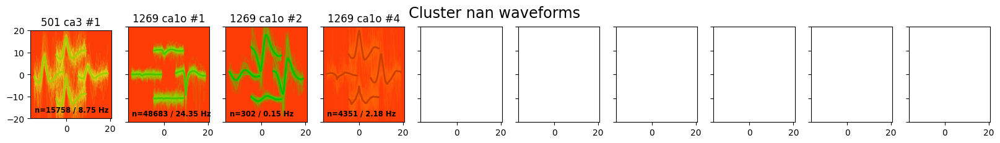

In [ ]:
ep = ExperimentPlotter('/mnt/isilon/marsh_single_unit/MarshMountainSort', efe=efe, dsr=dsr)
# display(ep.df_all_units)
# display(efe.df_all_units)

# df_waves = ep.get_df(drop_nan_rows=True, drop_nan_ignorecols=['cluster'], )
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(df_waves[df_waves['reject']])

# df_waves = ep.get_df(drop_nan_ignorecols=['cluster'], )
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(df_waves[df_waves['reject']])

rs = np.random.default_rng().integers(np.iinfo(np.uint32).max)
ep.plot_pca()
ep.plot_mds(random_state=rs)
ep.plot_mds_waveforms(random_state=rs)
ep.plot_feature_boxplots()
ep.plot_cluster_waveforms()

(188, 4)


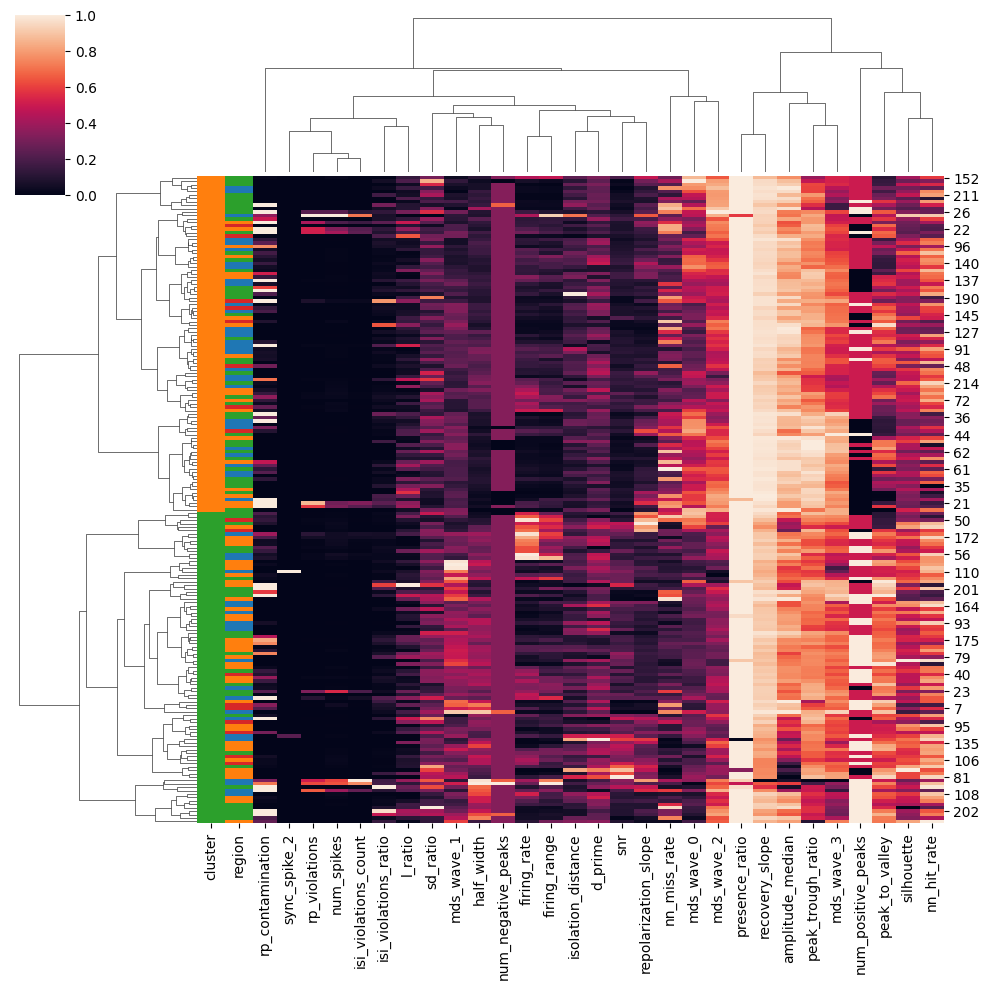

In [ ]:
df = efe.get_df(drop_nan_rows=True, drop_unit_unique_cols=True)
# NOTE Necessary to  drop all zero variance columns, otherwise standard_scale breaks
keepcols = df.std() > 0.0
df = df.loc[:, keepcols.reindex(df.columns, axis=1, fill_value=False)]

# df = efe.get_df(drop_nan_rows=True, drop_unit_unique_cols=True, drop_extra_cols=['cluster'])
# df = df.loc[:, ['num_spikes', 'snr']]
# df = df.apply(pd, errors='coerce')
df = df.astype('float')
# display(df)
row_colors_1 = df['cluster'].apply(lambda x: f'C{int(x)}')
region_to_color = {'ca1s':'C0', 'ca1o':'C1', 'ca3':'C2', 'ca3o':'C3'}

row_colors_2 = efe.get_df(drop_nan_rows=True)['region'].apply(lambda x: region_to_color[x])

row_colors = pd.concat([row_colors_1, row_colors_2], axis=1)
# row_colors = [f'C{int(x)}' for x in df['cluster']]
# row_colors = pd.Series(row_colors, name='cluster')
print(efe.Z_linkage.shape)
# sns.clustermap(df, metric='euclidean', z_score=1)
# sns.clustermap(df, metric='euclidean', row_linkage=efe.Z_linkage)
# sns.clustermap(df, metric='euclidean', z_score=1, row_linkage=efe.Z_linkage, cmap='vlag', center=0)
# sns.clustermap(df, metric='euclidean', standard_scale=1, row_linkage=efe.Z_linkage)
sns.clustermap(df.drop('cluster', axis=1), standard_scale=1, row_linkage=efe.Z_linkage, row_colors=row_colors) # REVIEW this might be the final version?
# sns.clustermap(df.drop('cluster', axis=1), z_score=1, row_linkage=efe.Z_linkage, row_colors=row_colors, cmap='vlag', center=0, vmin=-3, vmax=3) # REVIEW this might be the final version?


# df_no_out = df[(np.abs(zscore(df)) < 3).all(axis=1)]
# keepcols = df_no_out.std() > 0.0
# df_no_out = df_no_out.loc[:, keepcols.reindex(df_no_out.columns, axis=1, fill_value=False)]
# print(df.index.size, df_no_out.index.size)
# sns.clustermap(df_no_out, metric='euclidean', z_score=1, cmap='vlag', center=0)


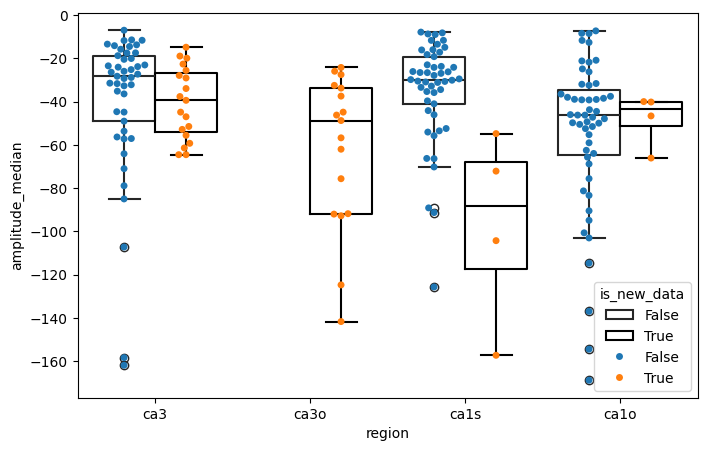

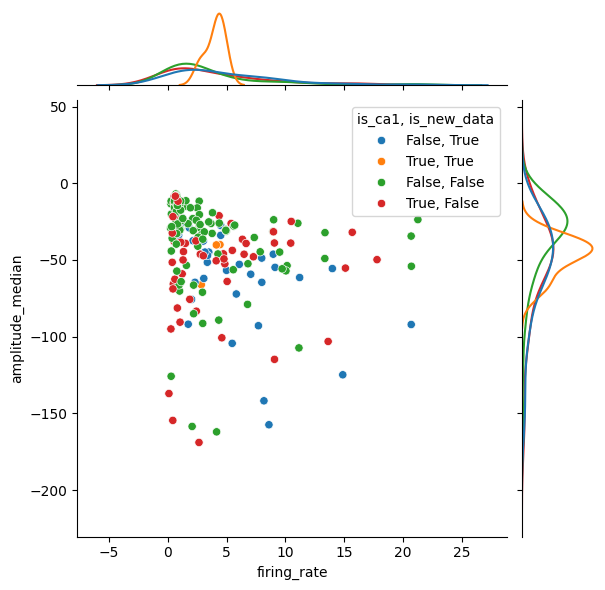

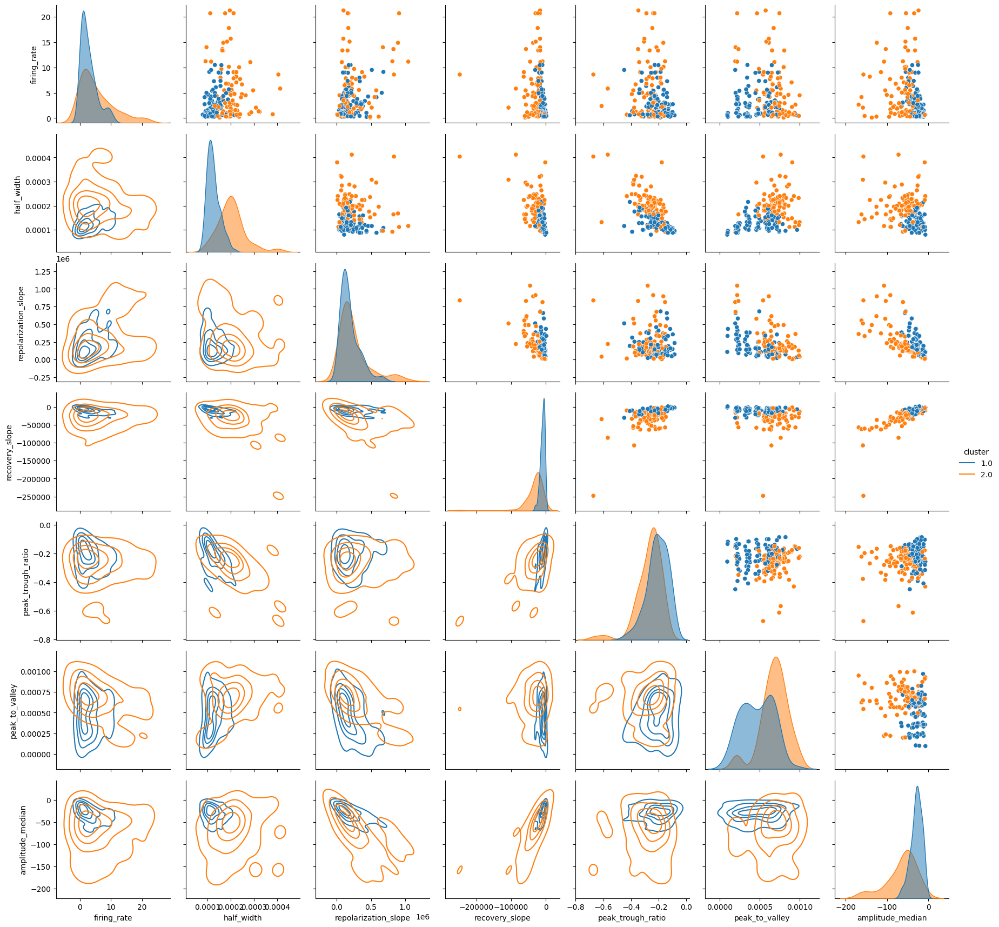

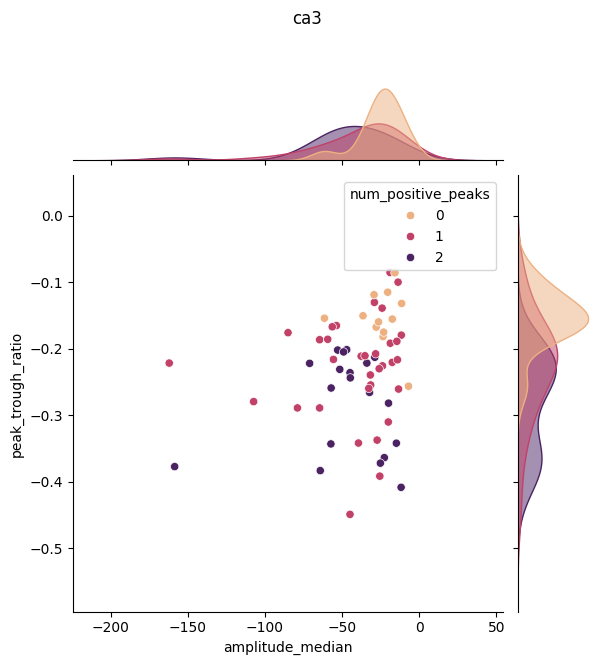

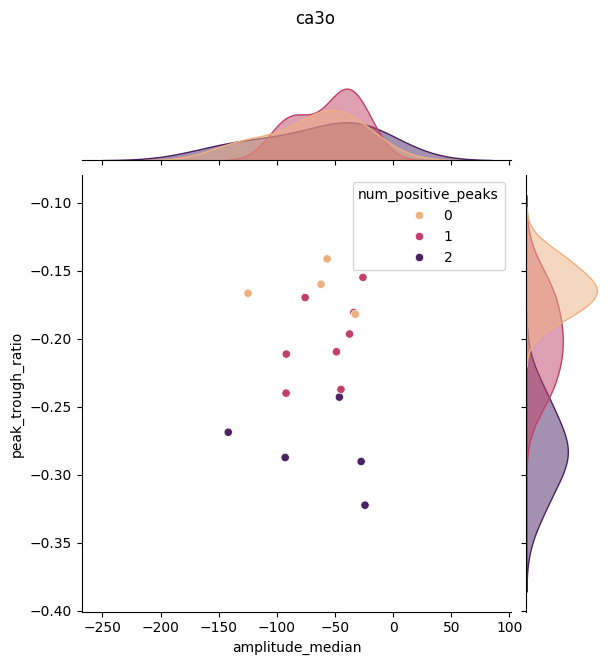

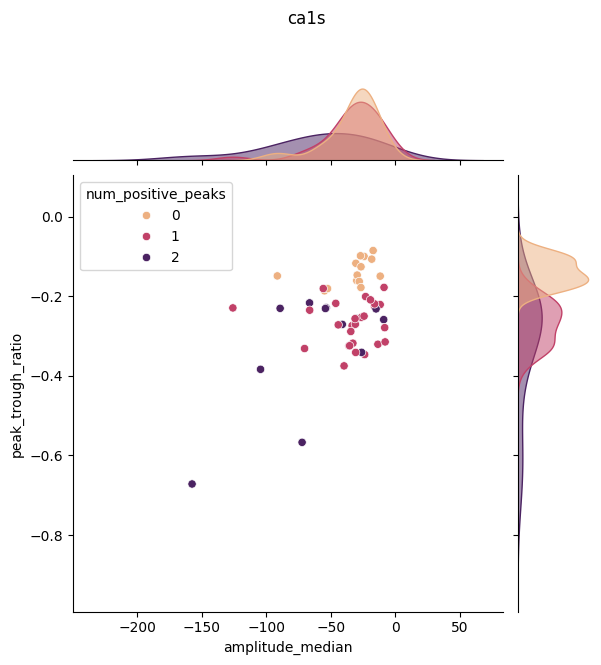

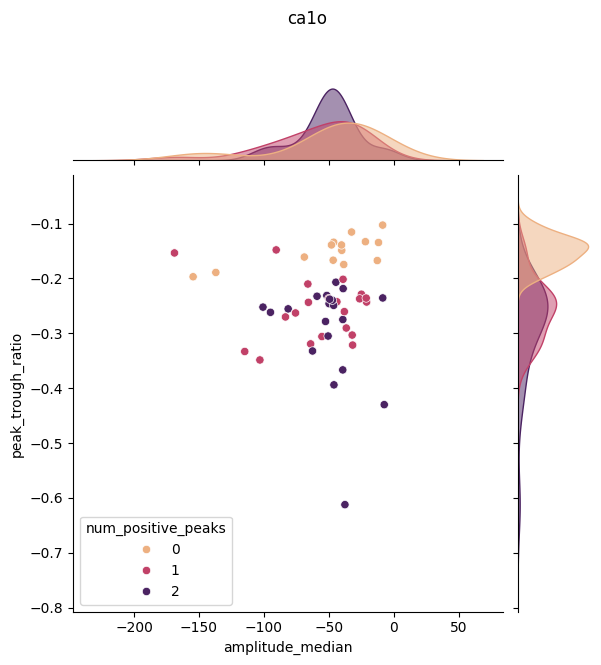

In [35]:
df = efe.get_df(drop_nan_rows=True)

df = df.assign(log_firing_rate=np.log10(df['firing_rate'], dtype=np.float32))


# aggregate from small n into big N and do the same plots
# df = df.drop(['name', 'sa'], axis=1)
# df = df.groupby(['id', 'region']).mean().reset_index() # NOTE this converts from small n to big N

df = df.assign(is_new_data=(df['id'] < 600))
df = df.assign(is_gcg=(df['id'].isin([1185, 1236, 1238, 1269]))) # NOTE really hacky but works for now
df = df.assign(is_ca1=(df['region'].isin(['ca1', 'ca1o']))) # NOTE really hacky but works for now
# df = df.loc[df['is_new_data']]


# SECTION plot boxplot
fig, ax = plt.subplots(figsize=(8, 5))
# firing_rate, log_firing_rate, half_width, repolarization_slope, recovery_slope, peak_to_valley, region, n_units, is_gcg, is_new_data
tempfeat = 'amplitude_median'
sns.boxplot(data=df, x='region', hue='is_new_data', y=tempfeat, ax=ax, fill=False, saturation=0, palette='dark:black')
sns.swarmplot(data=df, x='region', hue='is_new_data', y=tempfeat, ax=ax, dodge=True)
plt.show()

# SECTION plot one jointgrid
jointgrid_hue = df[['is_ca1', 'is_new_data']].apply(lambda x: f"{x.iloc[0]}, {x.iloc[1]}", axis=1)
jointgrid_hue.name = 'is_ca1, is_new_data'
g = sns.JointGrid(data=df, x='firing_rate', y=tempfeat, hue=jointgrid_hue)
g.plot_joint(sns.scatterplot)
g.plot_marginals(sns.kdeplot, common_norm=False)

# SECTION plot big pairgrid (compare all possible 2-feature scatterplots)
pairgrid_hue = 'cluster'
pairgrid_feats = ['firing_rate', 'half_width', 'repolarization_slope', 'recovery_slope', 'peak_trough_ratio', 'peak_to_valley', 'amplitude_median', pairgrid_hue]
df_pairgrid = df[pairgrid_feats]
# df_pairgrid = df[['firing_rate', 'half_width', 'repolarization_slope', 'recovery_slope', 'peak_trough_ratio']]
# palette = Spectral, crest, flare, tab10
p = sns.PairGrid(data=df_pairgrid, hue=pairgrid_hue, diag_sharey=False, palette='tab10')
p.map_diag(sns.kdeplot, common_norm=False, fill=True, alpha=0.5)
p.map_upper(sns.scatterplot)
p.map_lower(sns.kdeplot, common_norm=False, levels=5)
# p.map(sns.kdeplot)
p.add_legend()


# SECTION plot many jointgrids
for region in constants.REGIONS:
    df_plot = df.loc[df['region'] == region]
    # g = sns.JointGrid(data=df_plot, x='repolarization_slope', y='recovery_slope', hue='n_units')
    # g = sns.JointGrid(data=df_plot, x='amplitude_median', y='peak_trough_ratio', hue='is_gcg')
    g = sns.JointGrid(data=df_plot, x='amplitude_median', y='peak_trough_ratio', hue='num_positive_peaks', palette='flare')
    # g = sns.JointGrid(data=df_plot, x='firing_rate', y=tempfeat, hue='n_units')
    # g = sns.JointGrid(data=df, x='mds_wave_1', y='mds_wave_2', hue='n_units')

    # g.ax_joint.set_xscale('symlog', linthresh=0.1)
    # g.ax_joint.set_xlim(left=-10000, right=-1)
    # g.ax_marg_x.set_xscale('symlog', linthresh=0.1)
    # g.ax_marg_x.set_xlim(left=-10000, right=-1)
    

    g.plot_joint(sns.scatterplot)
    # g.plot_joint(sns.kdeplot)

    # g.plot_marginals(sns.kdeplot)
    # g.plot_marginals(sns.kdeplot, cumulative=True, common_norm=False, palette='crest')
    g.plot_marginals(sns.kdeplot, fill=True, common_norm=False, alpha=0.5)
    # g.plot_marginals(sns.histplot, multiple='stack')
    # g.plot_marginals(sns.histplot, element='step')
    # g.plot_marginals(sns.histplot, element='poly')
    # g.plot_marginals(sns.histplot, element='poly', stat='density', common_norm=False)
    # g.plot_marginals(sns.histplot, element='step', fill=False, cumulative=True, stat='density', common_norm=False)
    
    
    g.figure.suptitle(region, y=1.1)

In [ ]:
raise Exception("Firewall")

Exception: Firewall

In [75]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(dftemp_clusts.groupby(['cluster']).mean())

/tmp/ipykernel_3600435/3762106656.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  display(dftemp_clusts.groupby(['cluster']).mean())


,id,best_depth,n_units,unit,num_spikes,firing_rate,presence_ratio,snr,isi_violations_ratio,isi_violations_count,rp_contamination,rp_violations,amplitude_median,sync_spike_2,sync_spike_4,sync_spike_8,firing_range,sd_ratio,isolation_distance,l_ratio,d_prime,silhouette,nn_hit_rate,nn_miss_rate,mds_wave_0,mds_wave_1,mds_wave_2,mds_wave_3
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,657.0,6.35,3.8,1.8,48066.6,7.171515,0.961137,11.994633,5.789715,5597.8,0.72999,1333.2,-128.287445,0.001546,0.0,0.0,35.236,5.133608,28.239658,0.919929,3.911219,0.100964,0.833842,0.023312,3.728903,-6.027599,6.590631,5.401661
2,1023.285714,4.35,4.828571,3.0,20255.628571,13.536118,1.0,5.69101,1.282393,583.628571,0.335669,129.4,-52.438122,0.000017,0.0,0.0,16.676857,1.489954,44.258715,0.338778,3.430384,0.104503,0.694364,0.088919,-0.5327,0.861086,-0.941519,-0.771666


Index(['amplitude_median', 'cluster', 'd_prime', 'firing_range', 'firing_rate',
       'isi_violations_count', 'isi_violations_ratio', 'isolation_distance',
       'l_ratio', 'mds_wave_0', 'mds_wave_1', 'mds_wave_2', 'mds_wave_3',
       'nn_hit_rate', 'nn_miss_rate', 'num_spikes', 'presence_ratio',
       'rp_contamination', 'rp_violations', 'sd_ratio', 'silhouette', 'snr',
       'sync_spike_2', 'sync_spike_4', 'sync_spike_8'],
      dtype='object')

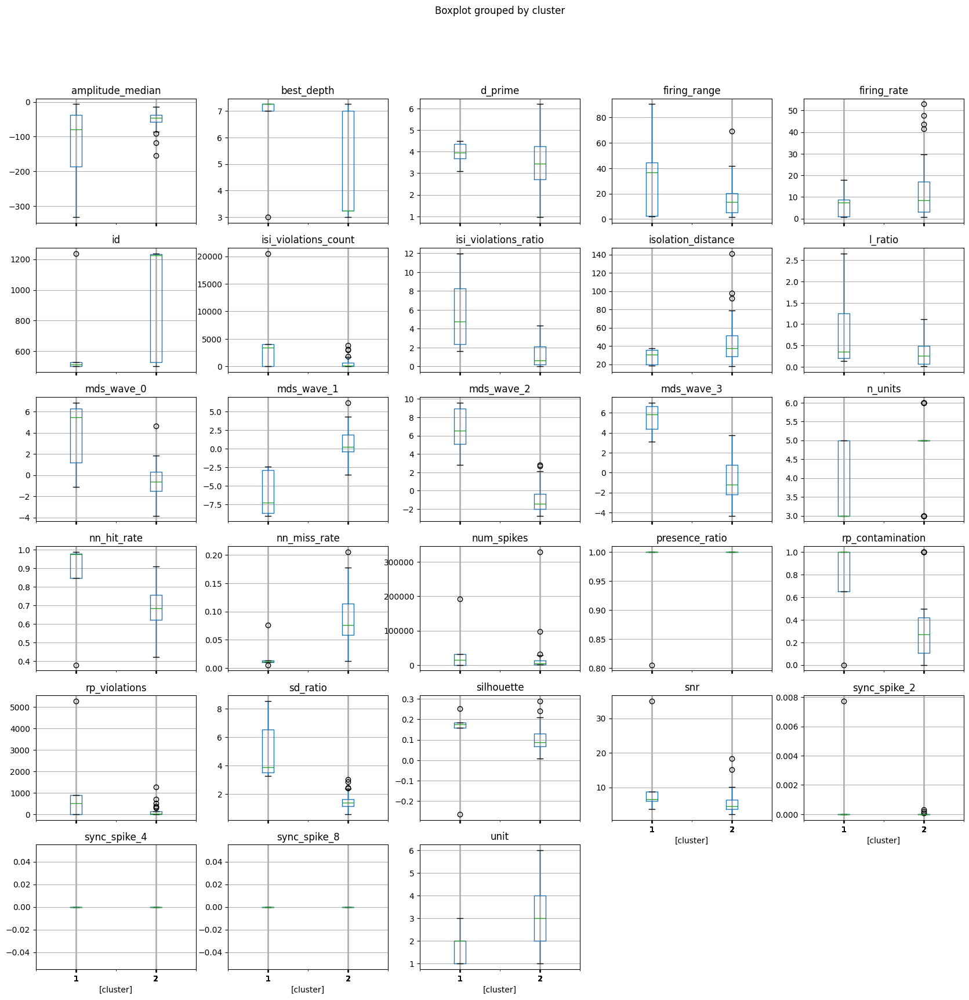

In [76]:
# dftemp_clust_mean = dftemp_clusts.groupby(['cluster'])
# display(dftemp_clust_mean)
# dftemp_clusts.groupby(['cluster']).plot(kind='box', x='cluster', logy=True, rot=90)
tempcols = display(dftemp_clusts.columns.difference(ExperimentFeatureExtractor.DO_NOT_EXPLODE_FEATURES + ['unit']))
dftemp_clusts.boxplot(column=tempcols, by='cluster', **{'sharey':False, 'figsize':(20, 20)})
plt.show()

In [77]:
%%script true
for col in dftemp2.columns:
    if col not in efe.DO_NOT_EXPLODE_FEATURES:
        series = dftemp2[col]
        series = series.replace(['<NA>'], np.nan)
        
        fig, ax = plt.subplots(1, 1, figsize=(3, 1))
        series.dropna().hist(ax=ax)
        ax.set_title(col)
        plt.show()
        # print(series)

## Calculate Spike Statistics

extract amplitudes: 100%|#########################| 1840/1840 [00:01<00:00, 1489.27it/s]


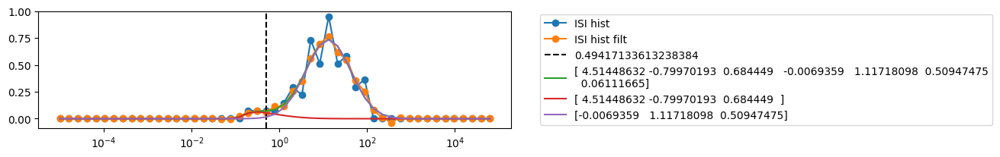

extract amplitudes: 100%|########################| 1840/1840 [00:00<00:00, 13971.65it/s]


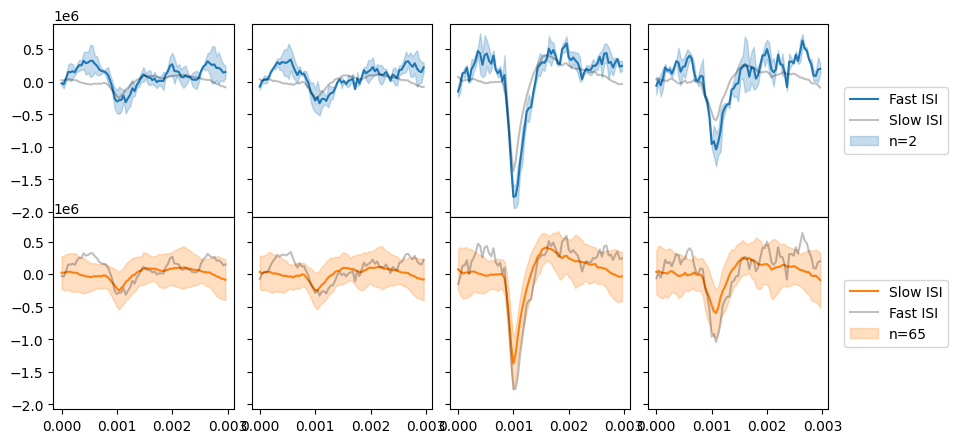

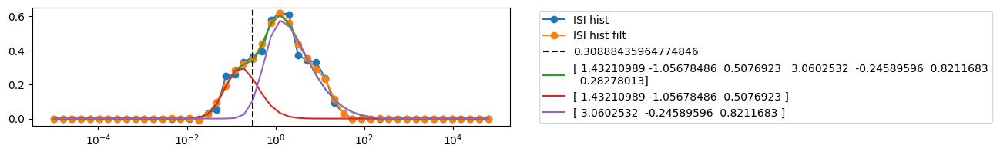

extract amplitudes: 100%|########################| 1840/1840 [00:00<00:00, 14133.33it/s]


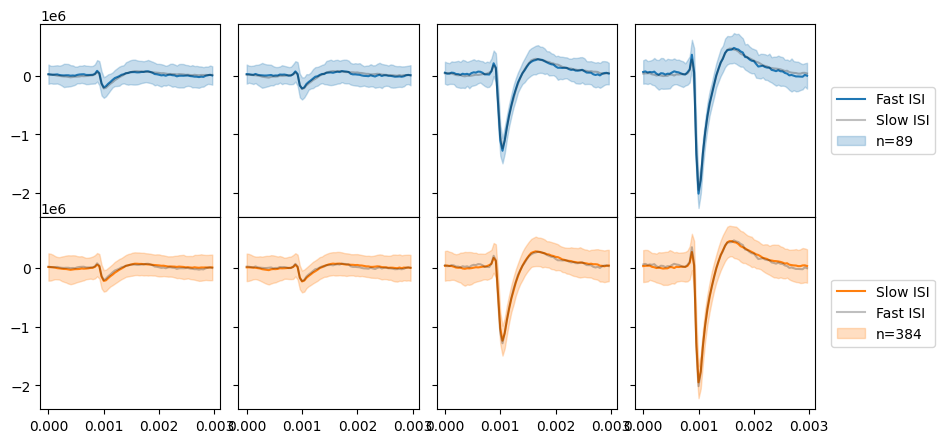

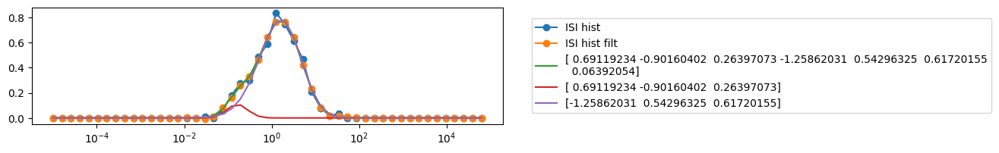

extract amplitudes: 100%|###########################| 568/568 [00:00<00:00, 1307.80it/s]


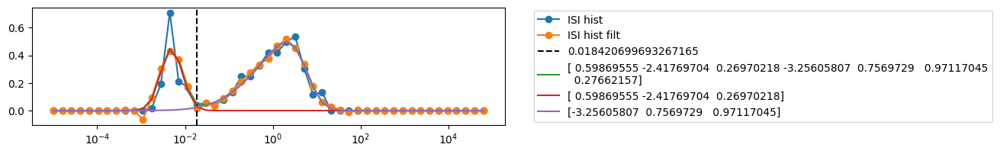

extract amplitudes: 100%|###########################| 568/568 [00:00<00:00, 8285.62it/s]


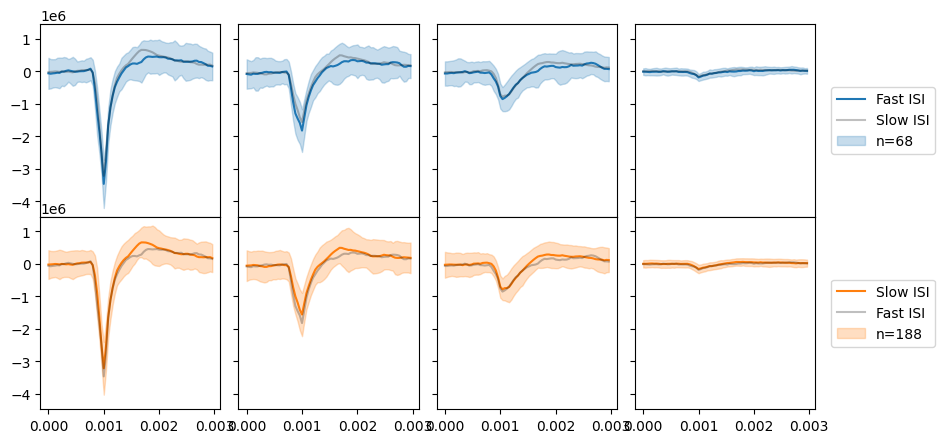

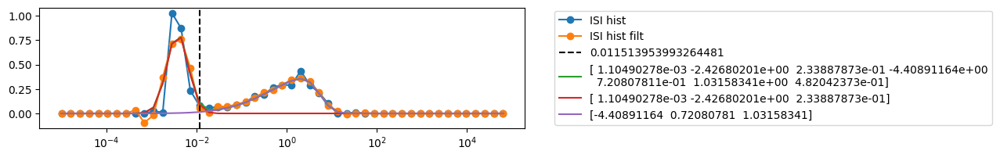

extract amplitudes: 100%|##########################| 568/568 [00:00<00:00, 10305.99it/s]


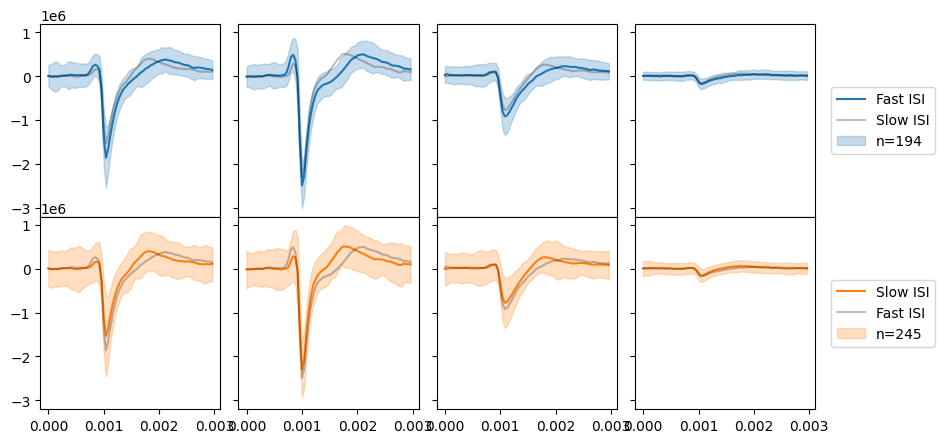

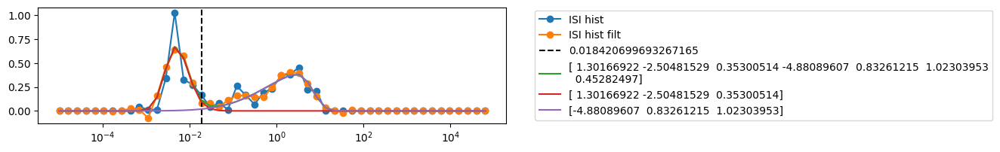

extract amplitudes: 100%|############################| 364/364 [00:00<00:00, 559.23it/s]


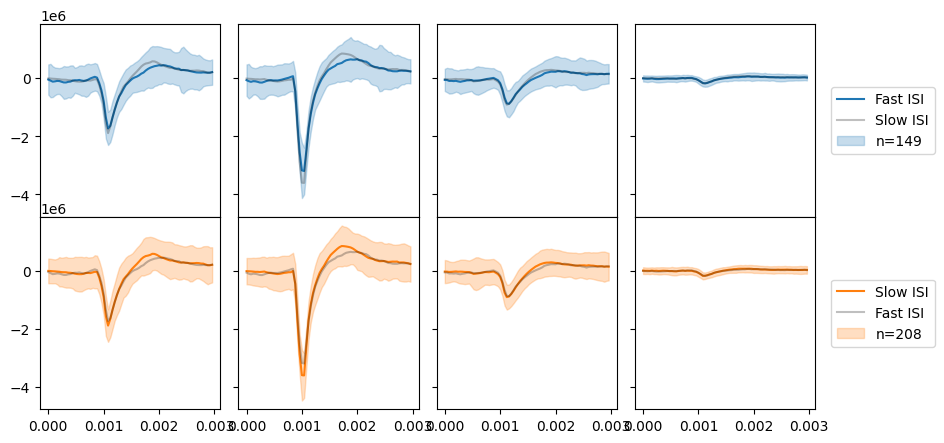

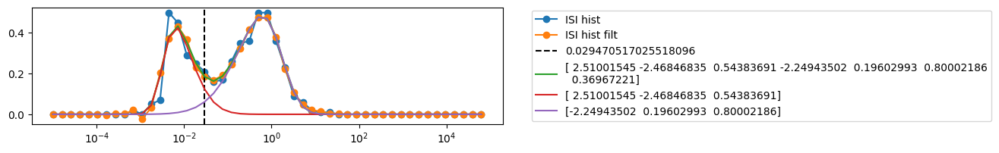

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2688.66it/s]


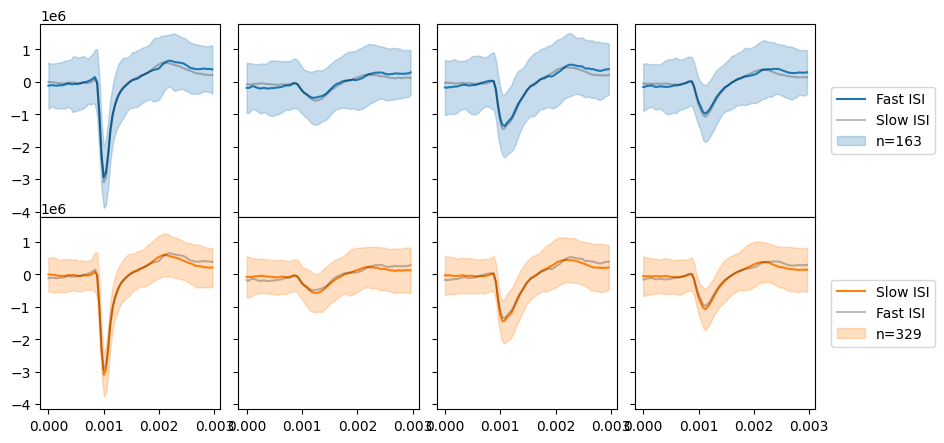

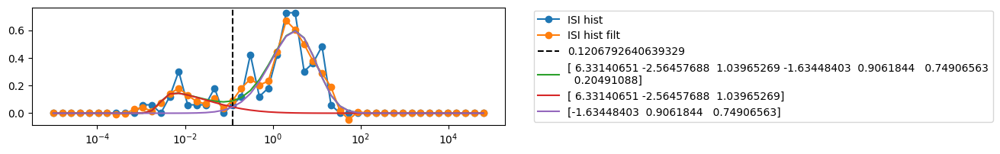

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2768.30it/s]


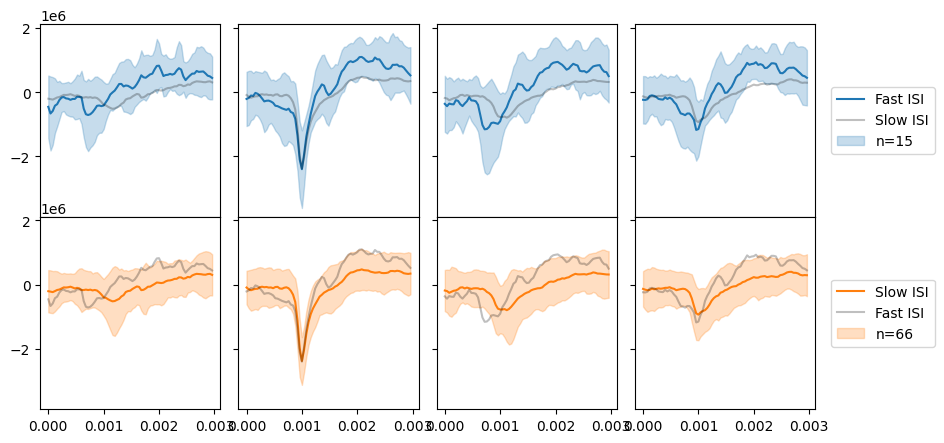

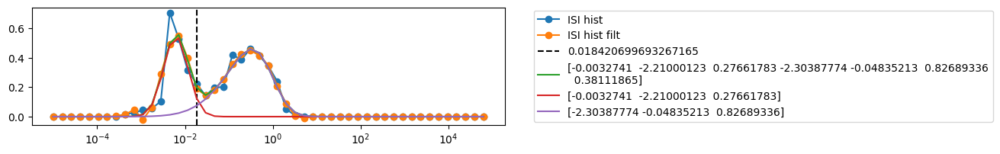

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2715.53it/s]


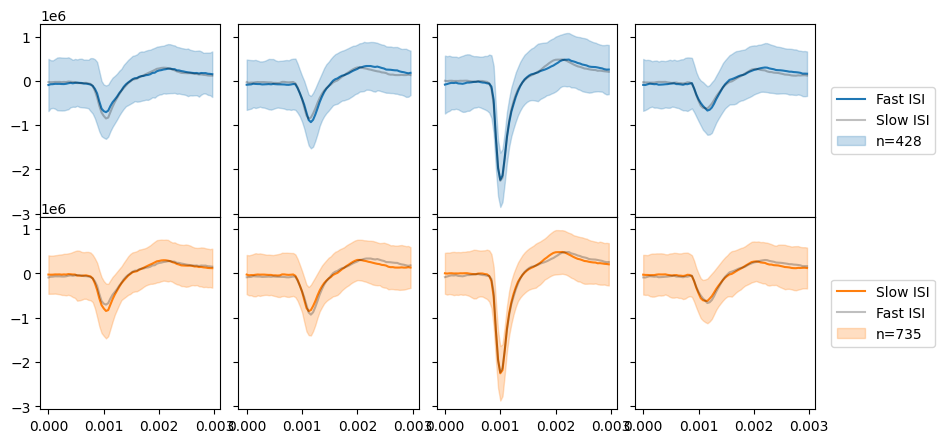

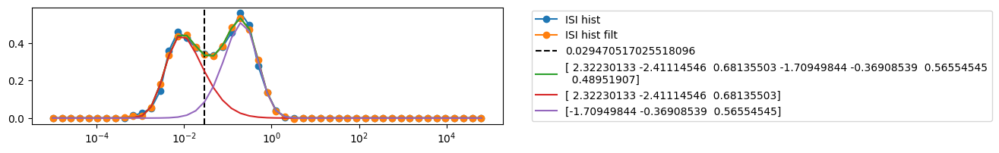

extract amplitudes: 100%|###########################| 364/364 [00:00<00:00, 2843.80it/s]


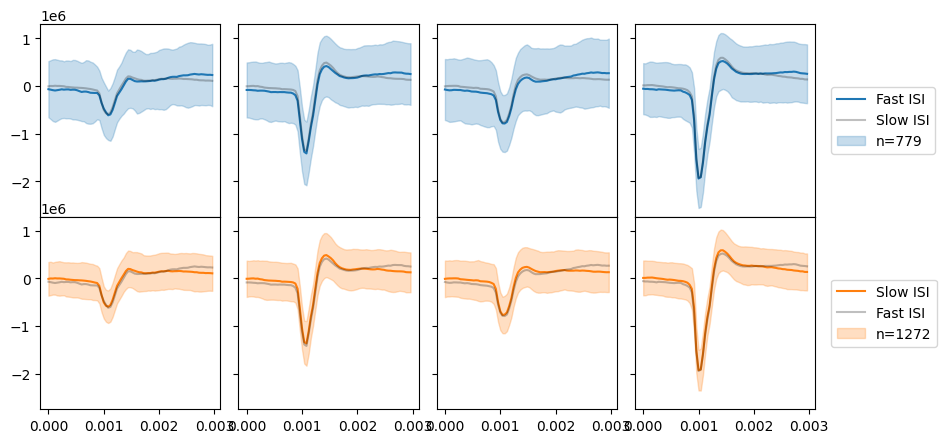

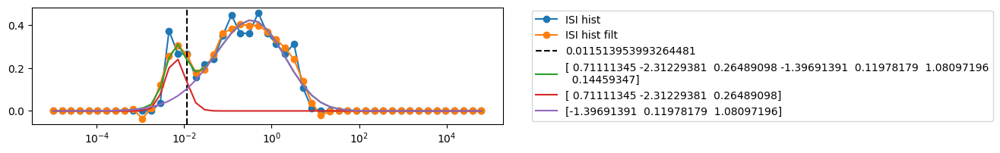

extract amplitudes: 100%|#########################| 1513/1513 [00:00<00:00, 2380.74it/s]


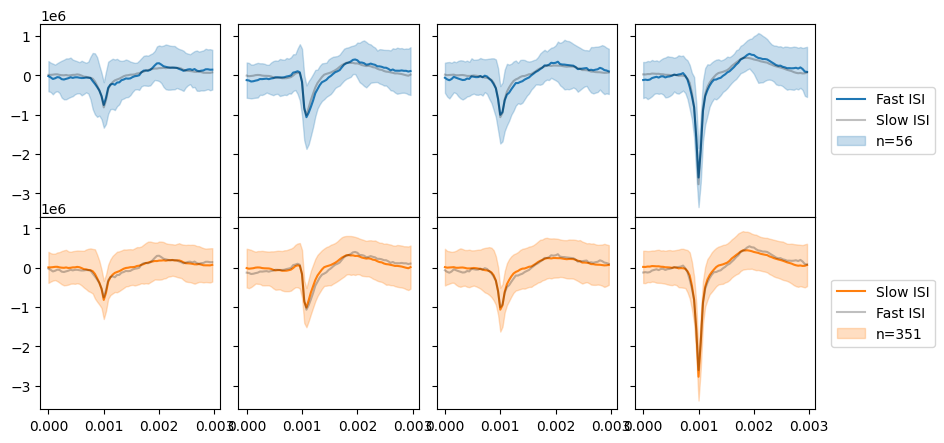

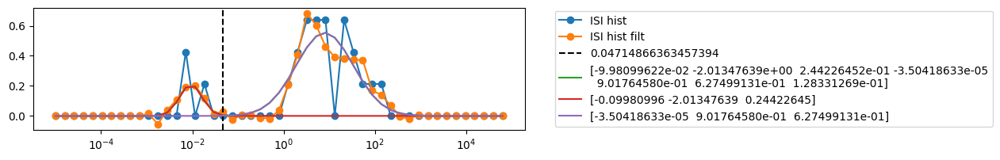

extract amplitudes: 100%|########################| 1513/1513 [00:00<00:00, 20509.88it/s]


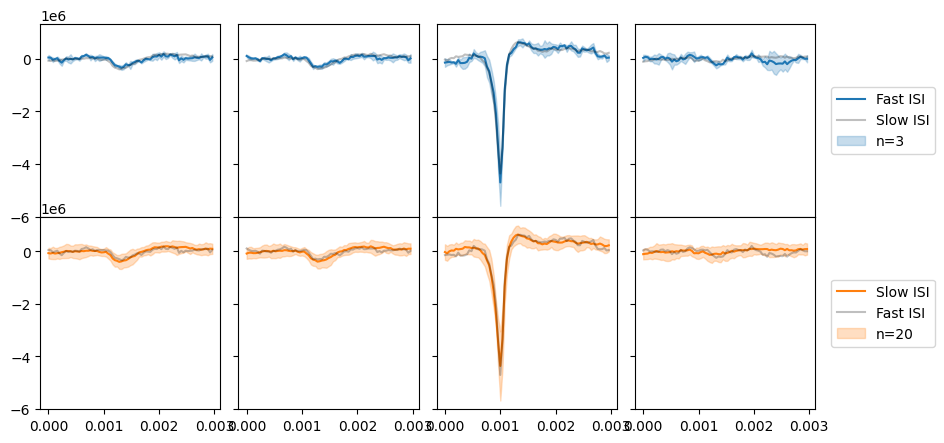

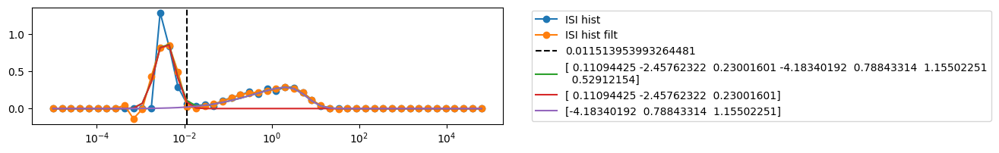

extract amplitudes: 100%|##########################| 1408/1408 [00:01<00:00, 768.21it/s]


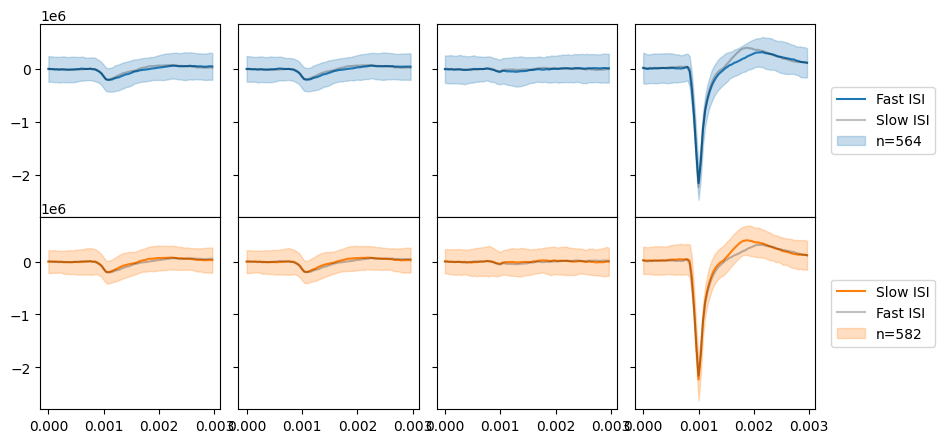

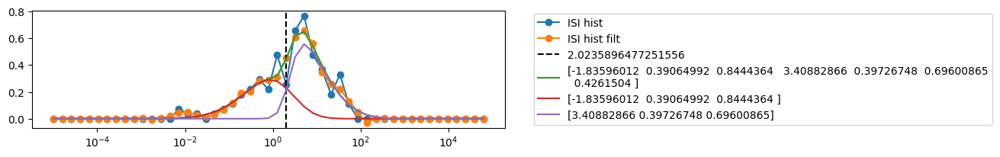

extract amplitudes: 100%|#########################| 1408/1408 [00:00<00:00, 4746.63it/s]


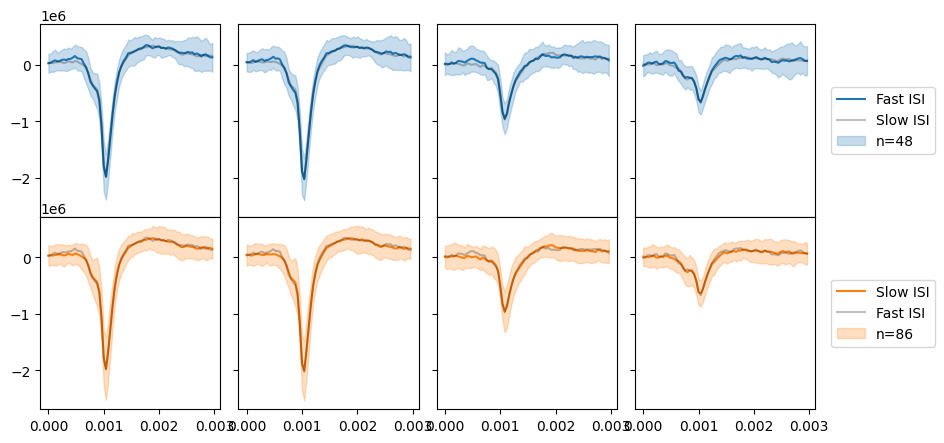

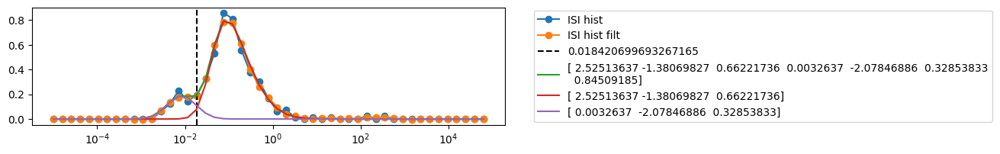

extract amplitudes: 100%|#########################| 1408/1408 [00:00<00:00, 4883.92it/s]


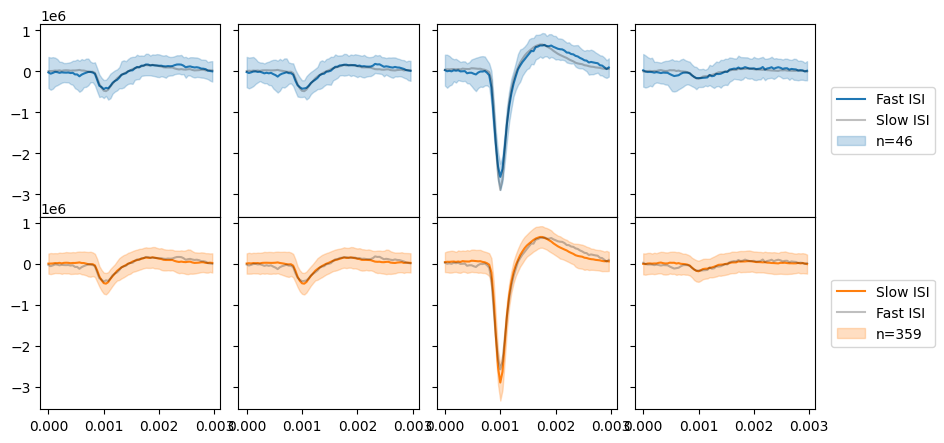

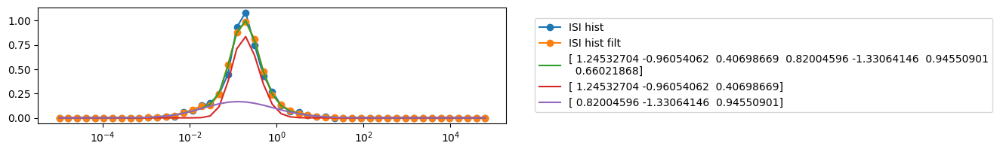

extract amplitudes: 100%|#########################| 1311/1311 [00:00<00:00, 4263.34it/s]


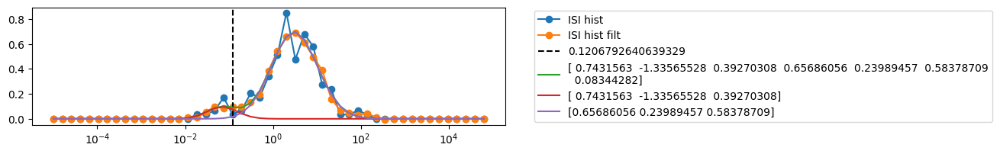

extract amplitudes: 100%|########################| 1311/1311 [00:00<00:00, 28929.28it/s]


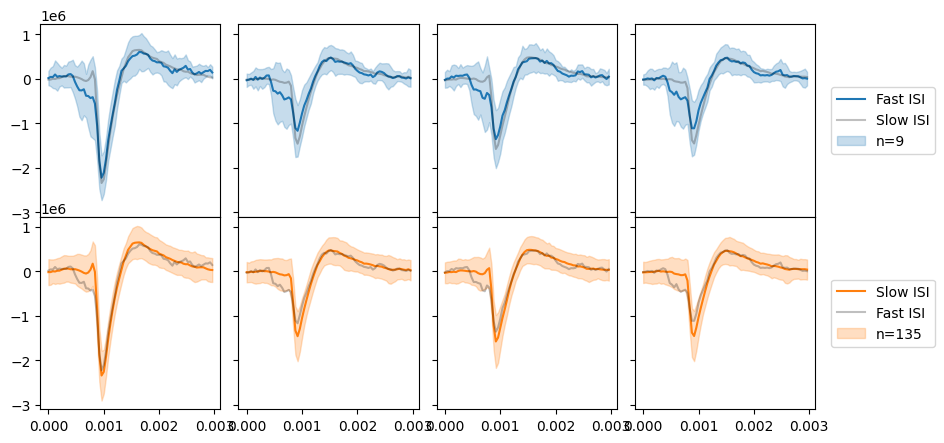

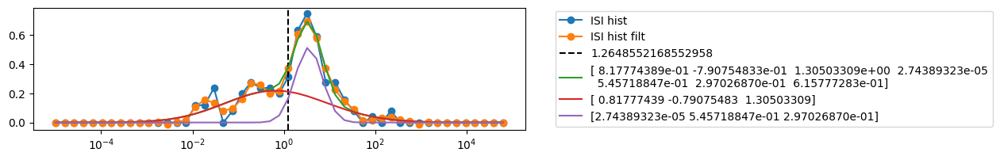

extract amplitudes: 100%|##########################| 1835/1835 [00:03<00:00, 468.12it/s]


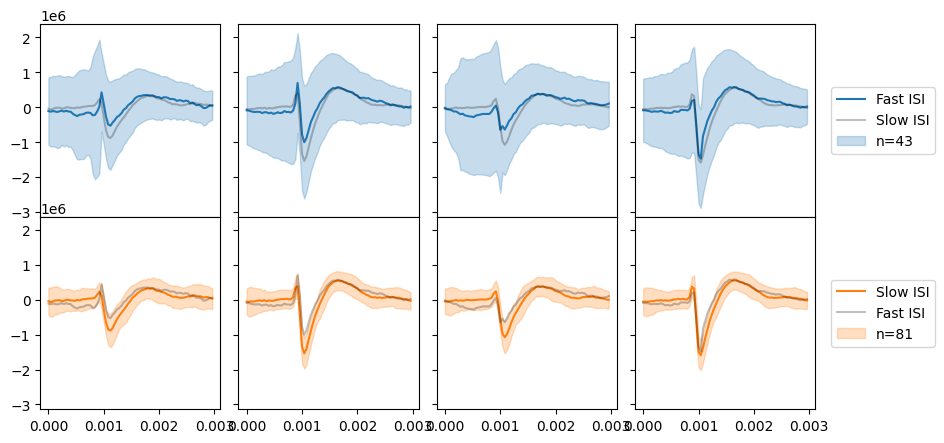

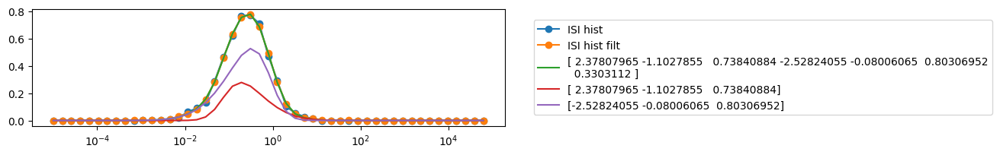

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1846.12it/s]


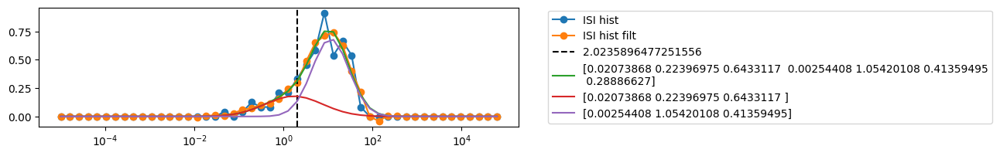

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1896.89it/s]


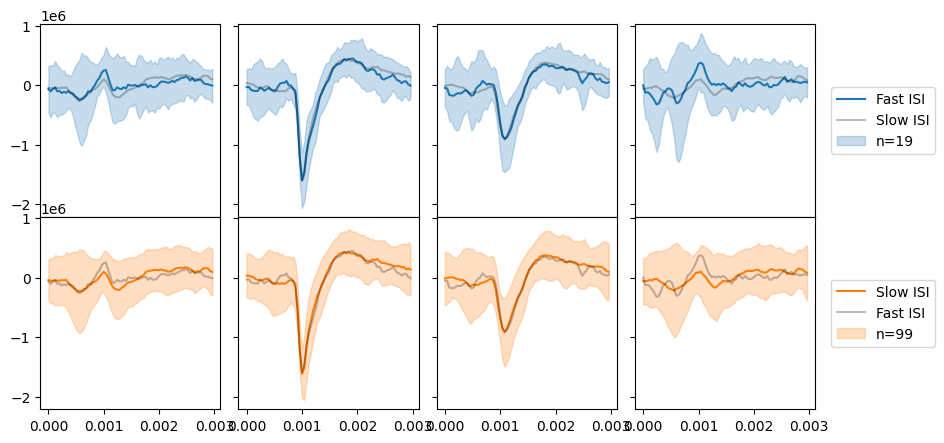

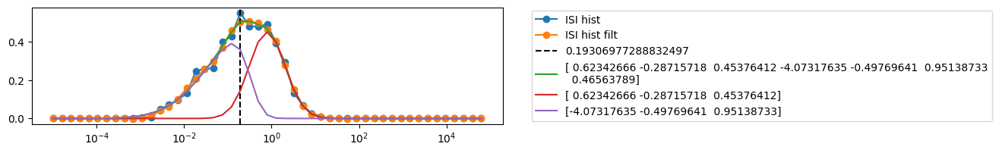

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1971.84it/s]


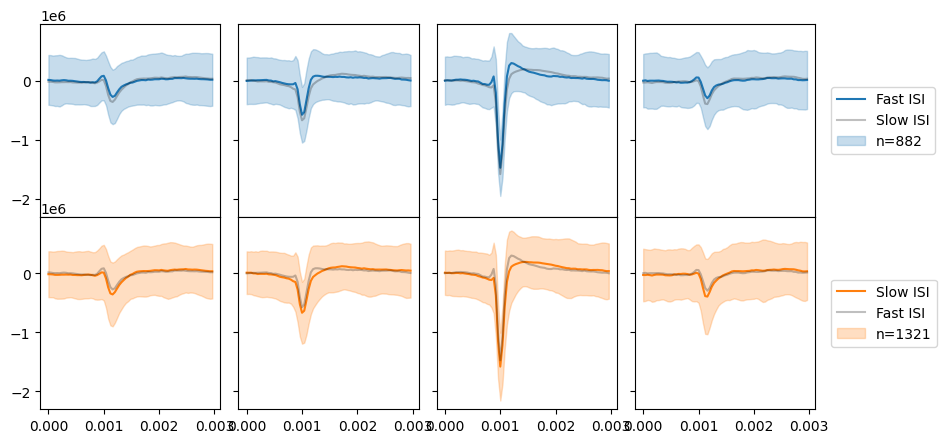

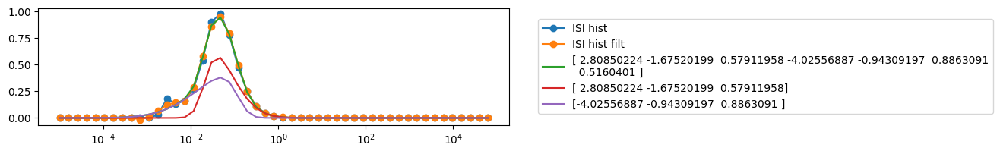

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1971.21it/s]


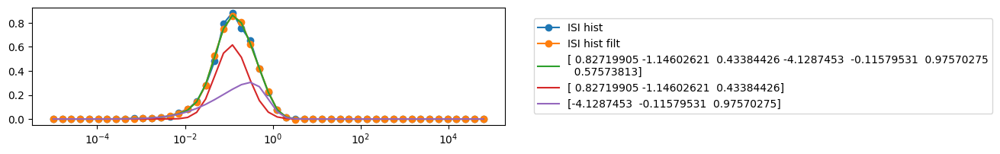

extract amplitudes: 100%|#########################| 1835/1835 [00:00<00:00, 1919.64it/s]


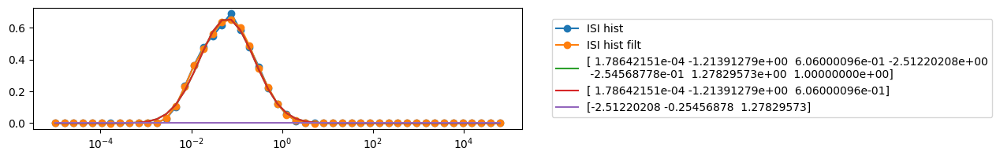

extract amplitudes: 100%|##########################| 1874/1874 [00:05<00:00, 330.27it/s]


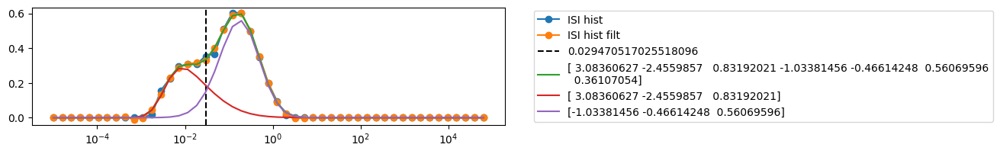

extract amplitudes: 100%|#########################| 1874/1874 [00:00<00:00, 3420.36it/s]


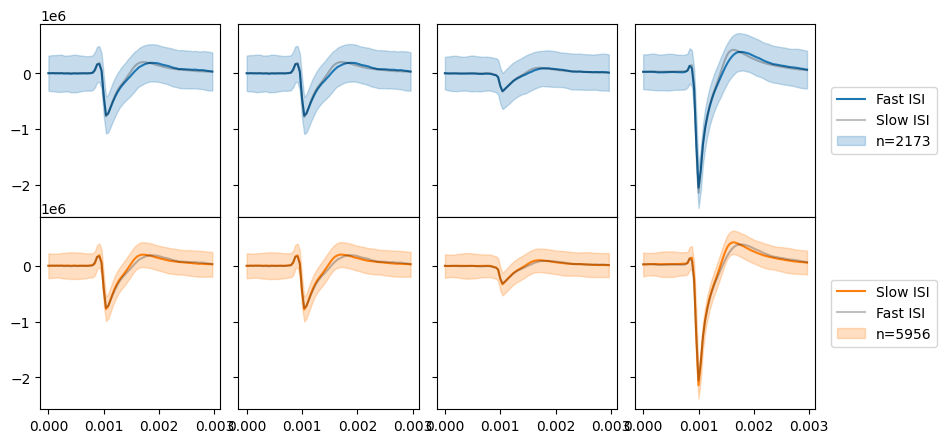

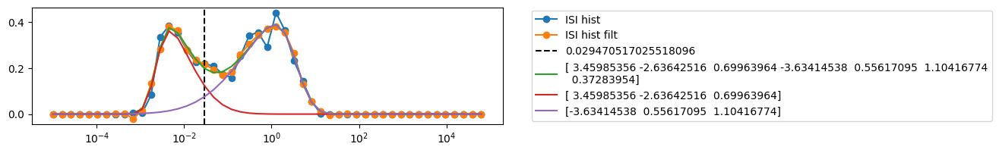

extract amplitudes: 100%|##########################| 1835/1835 [00:03<00:00, 495.17it/s]


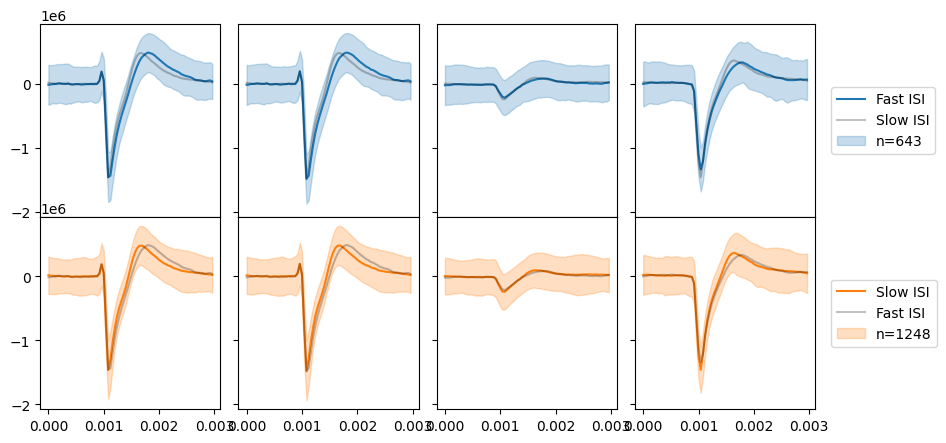

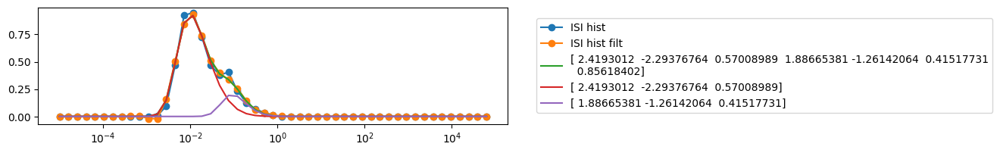

extract amplitudes: 100%|##########################| 1200/1200 [00:02<00:00, 464.23it/s]


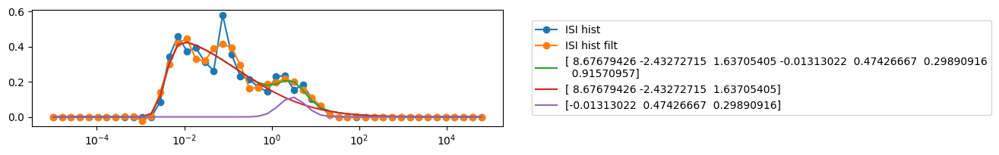

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2429.52it/s]


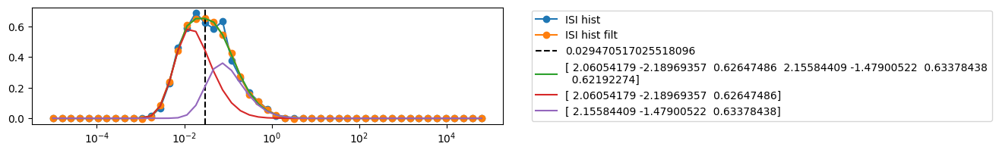

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2087.79it/s]


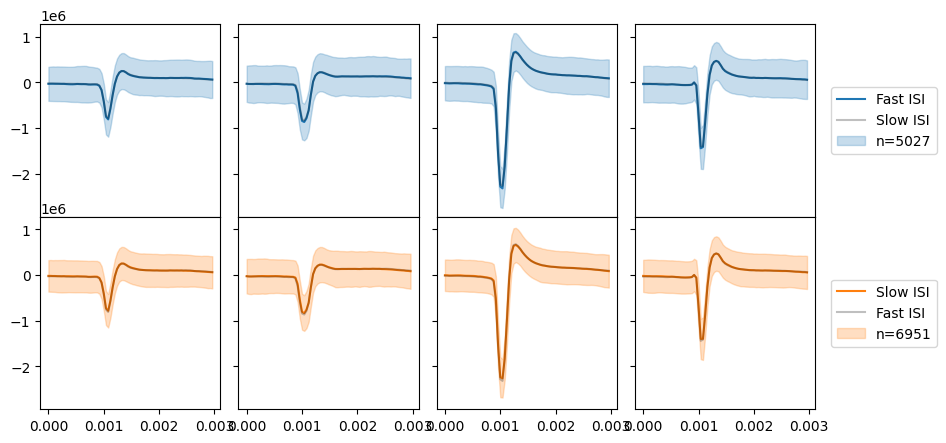

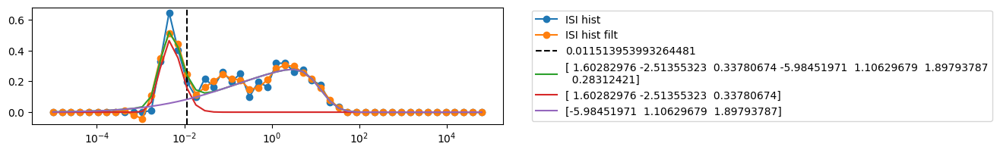

extract amplitudes: 100%|#########################| 1200/1200 [00:00<00:00, 2344.59it/s]


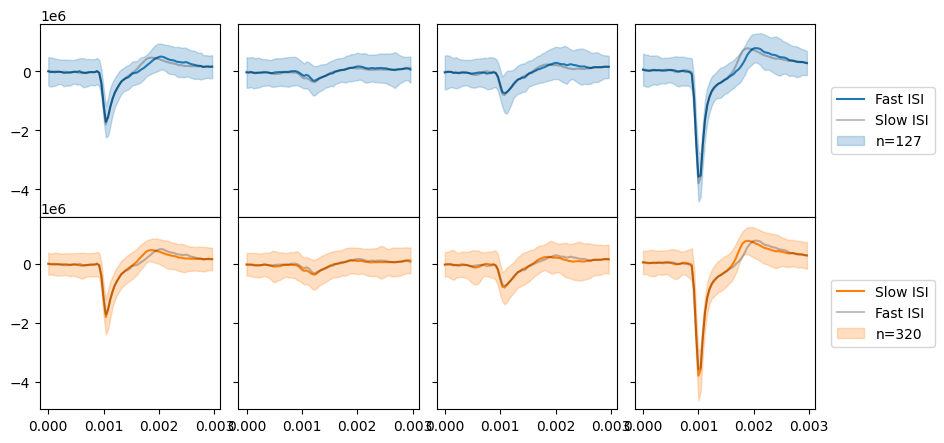

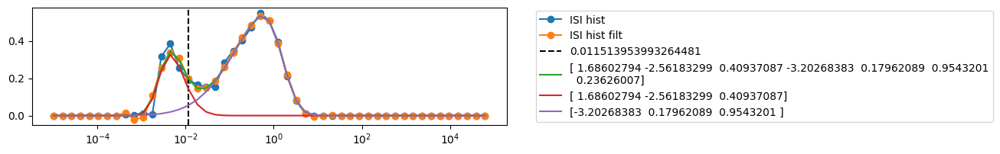

extract amplitudes: 100%|#########################| 1407/1407 [00:00<00:00, 1458.94it/s]


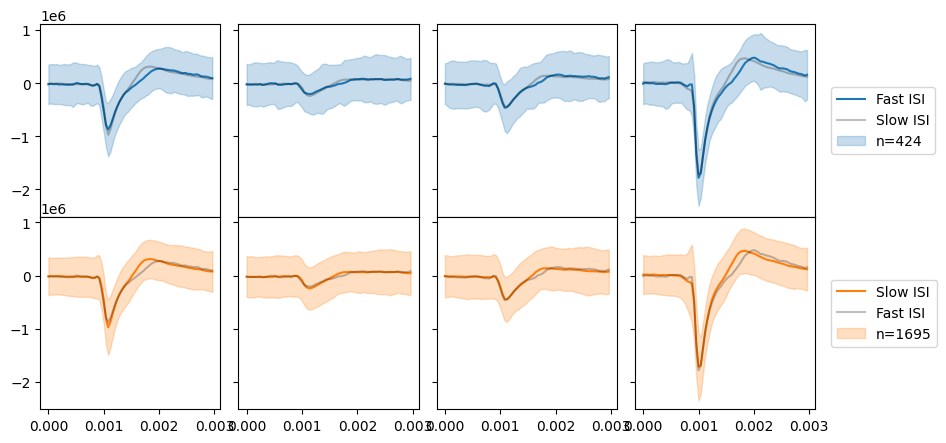

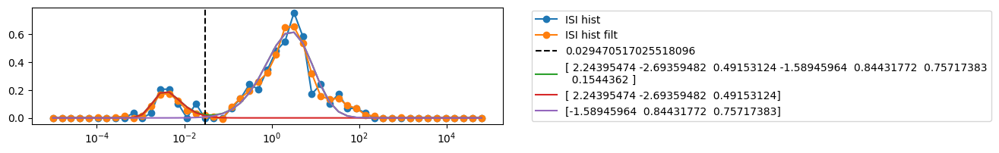

extract amplitudes: 100%|########################| 1407/1407 [00:00<00:00, 10861.91it/s]


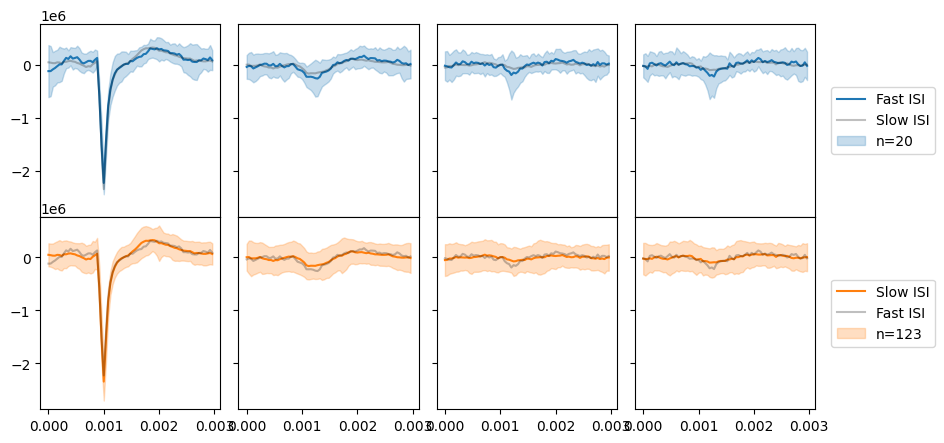

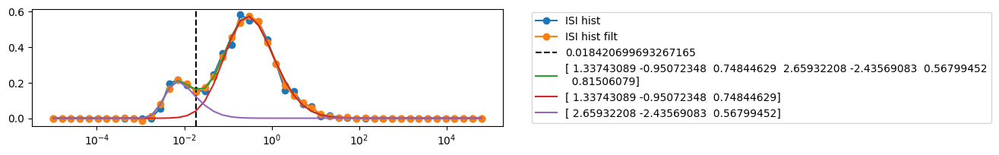

extract amplitudes: 100%|#########################| 1200/1200 [00:01<00:00, 1093.85it/s]


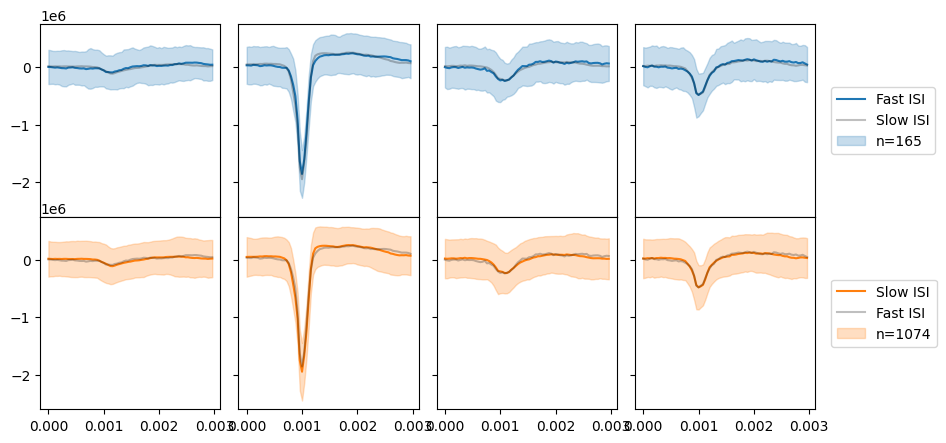

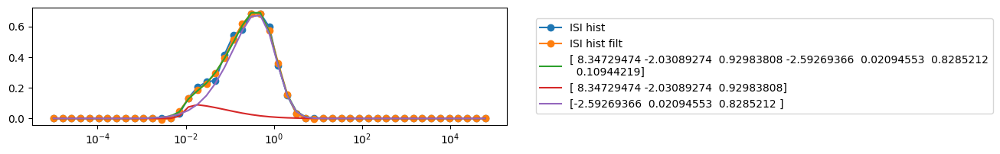

extract amplitudes: 100%|#########################| 1800/1800 [00:00<00:00, 7576.19it/s]


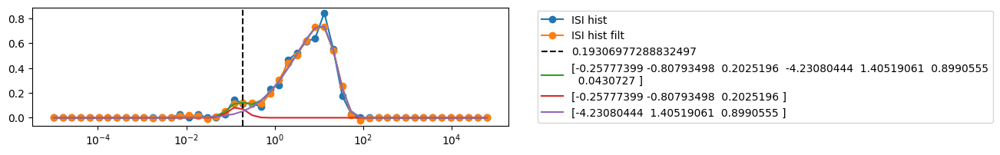

extract amplitudes: 100%|##########################| 1801/1801 [00:02<00:00, 680.32it/s]


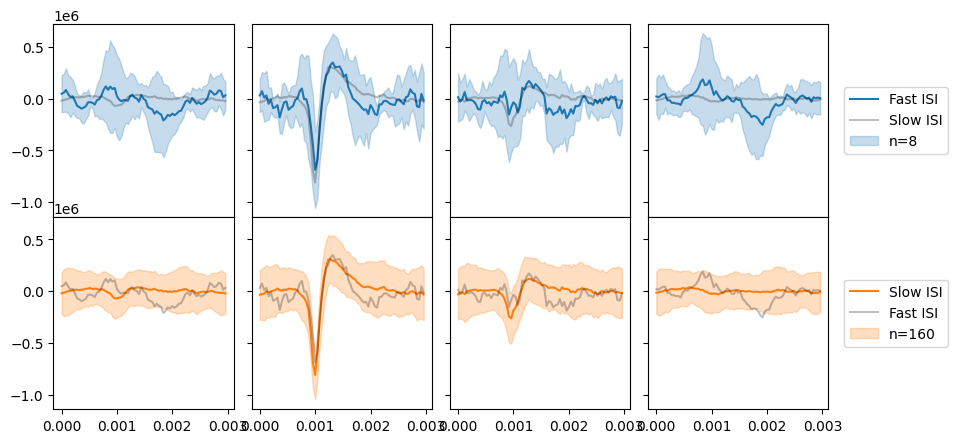

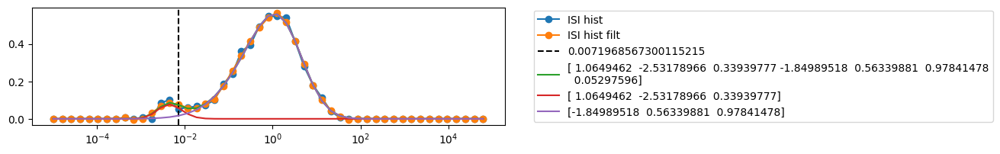

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 4288.46it/s]


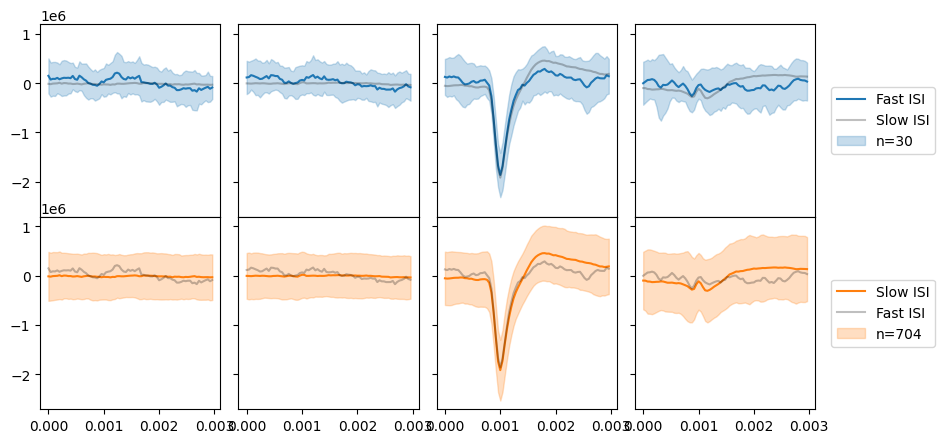

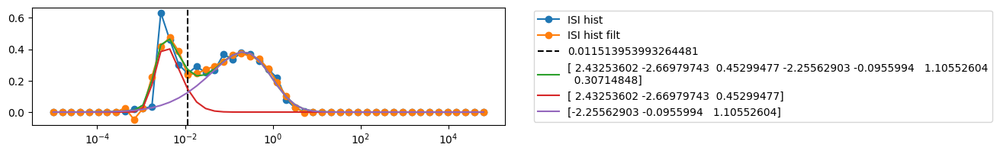

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 4522.98it/s]


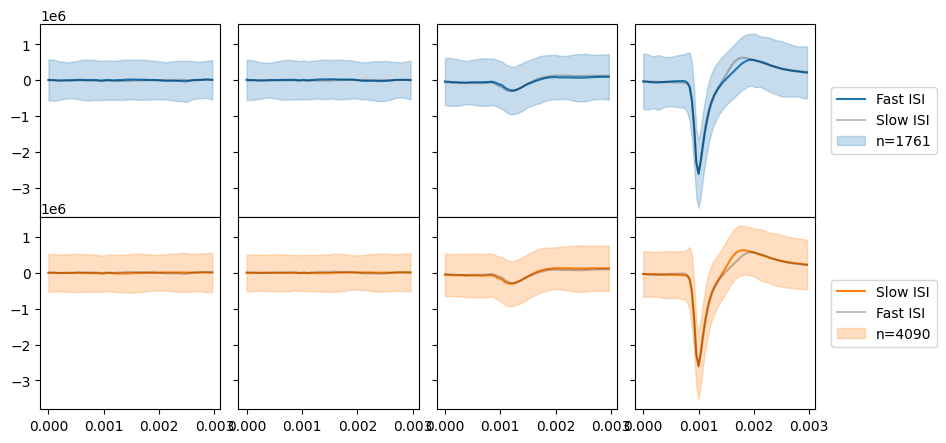

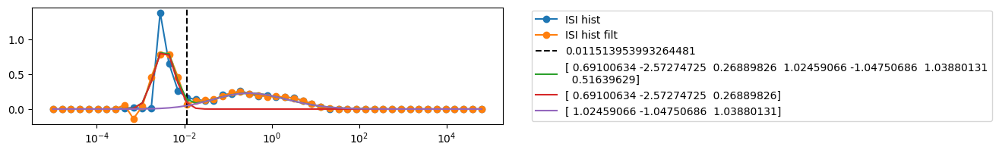

extract amplitudes: 100%|##########################| 1815/1815 [00:03<00:00, 586.08it/s]


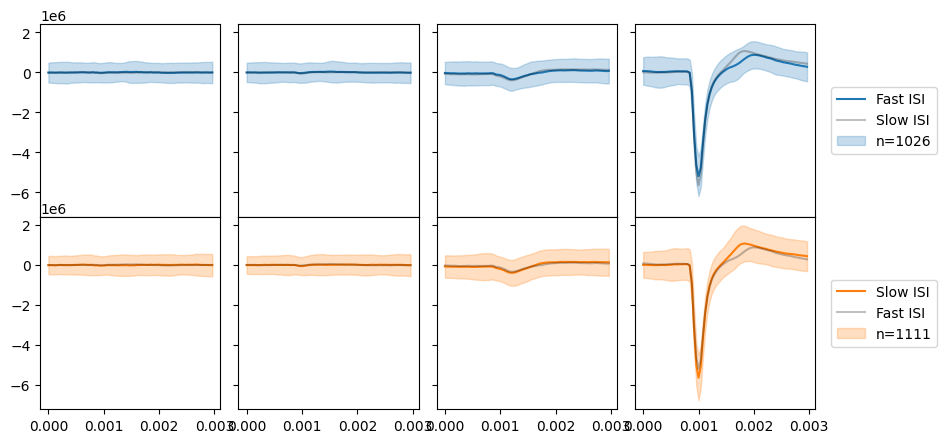

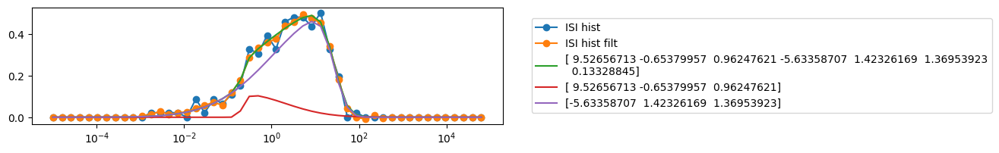

extract amplitudes: 100%|#########################| 1815/1815 [00:00<00:00, 2982.75it/s]


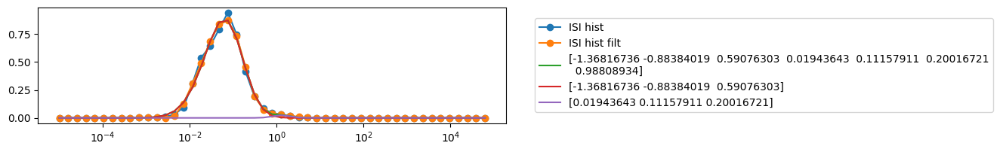

extract amplitudes: 100%|##########################| 1801/1801 [00:03<00:00, 528.43it/s]


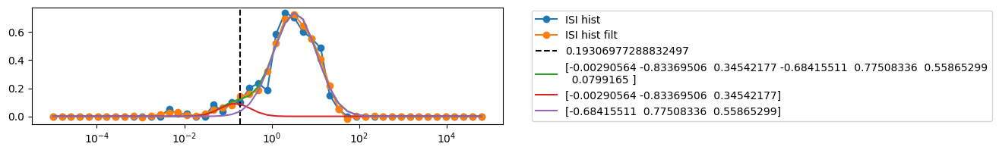

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 2454.62it/s]


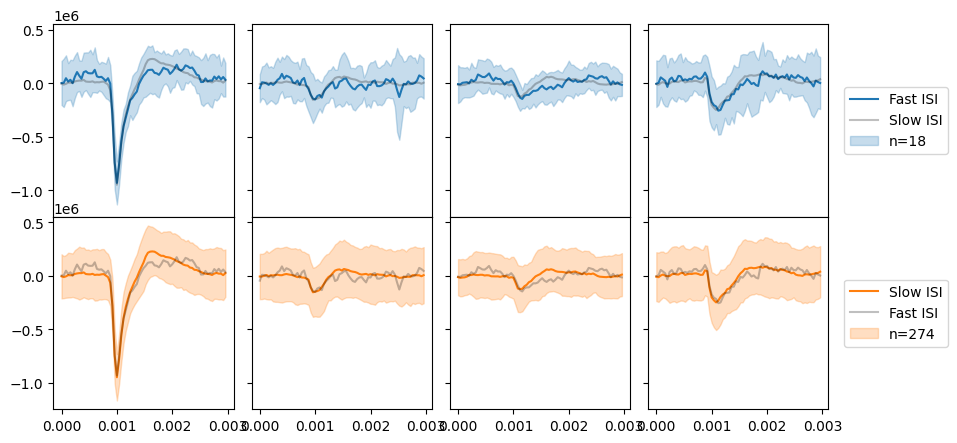

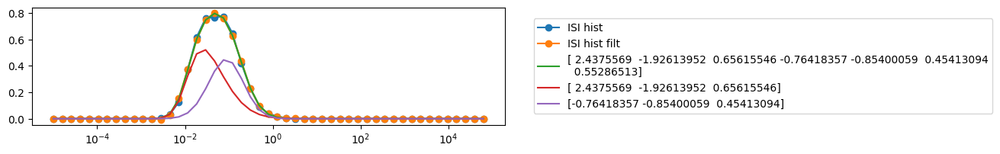

extract amplitudes: 100%|#########################| 1801/1801 [00:00<00:00, 2643.77it/s]


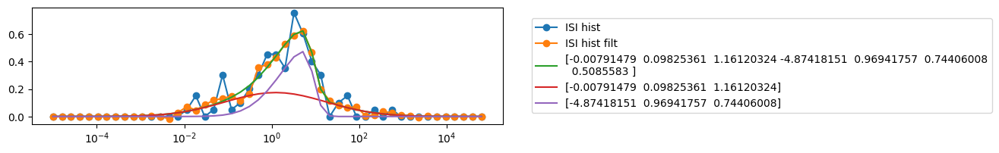

extract amplitudes: 100%|#########################| 1801/1801 [00:01<00:00, 1575.52it/s]


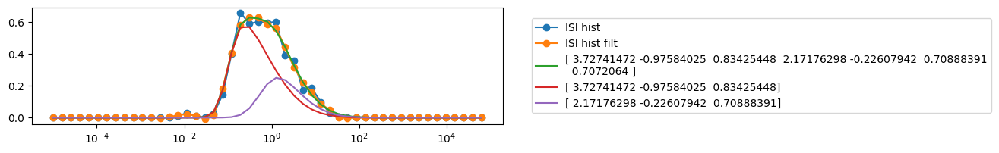

extract amplitudes: 100%|########################| 1801/1801 [00:00<00:00, 12552.10it/s]


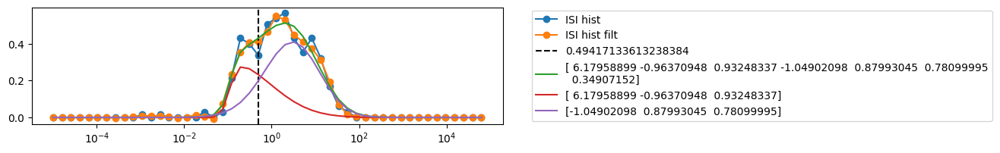

extract amplitudes: 100%|########################| 1801/1801 [00:00<00:00, 13544.33it/s]


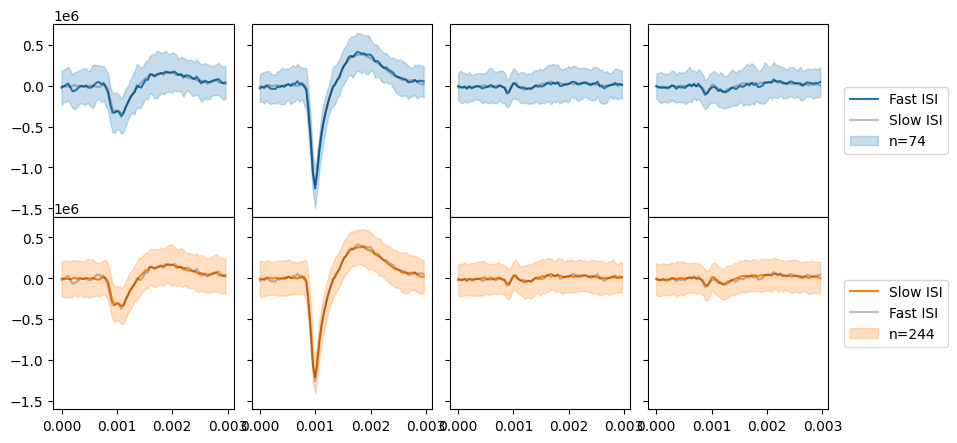

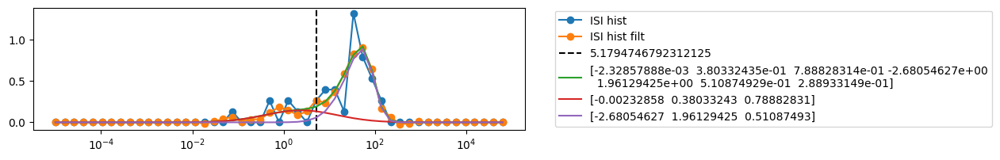

extract amplitudes: 100%|########################| 1890/1890 [00:00<00:00, 37545.63it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


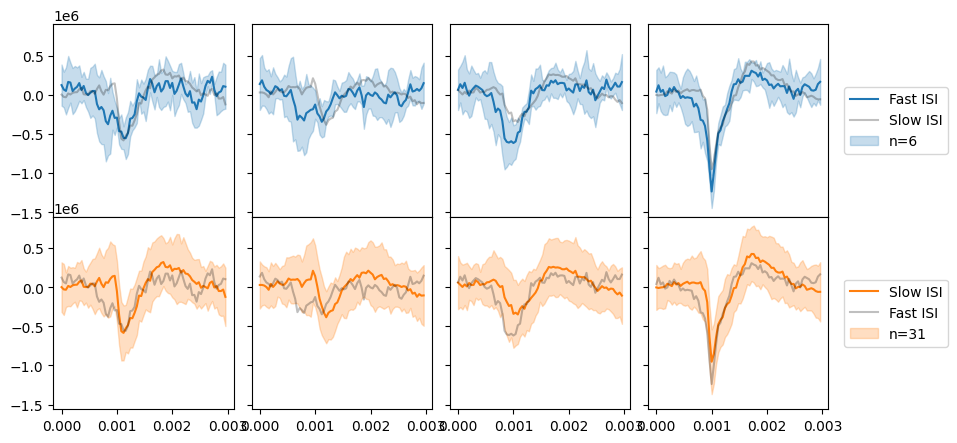

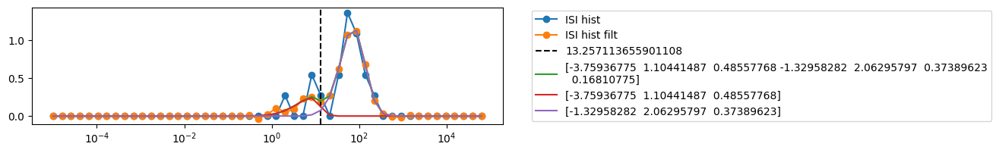

extract amplitudes: 100%|########################| 1890/1890 [00:00<00:00, 11884.50it/s]


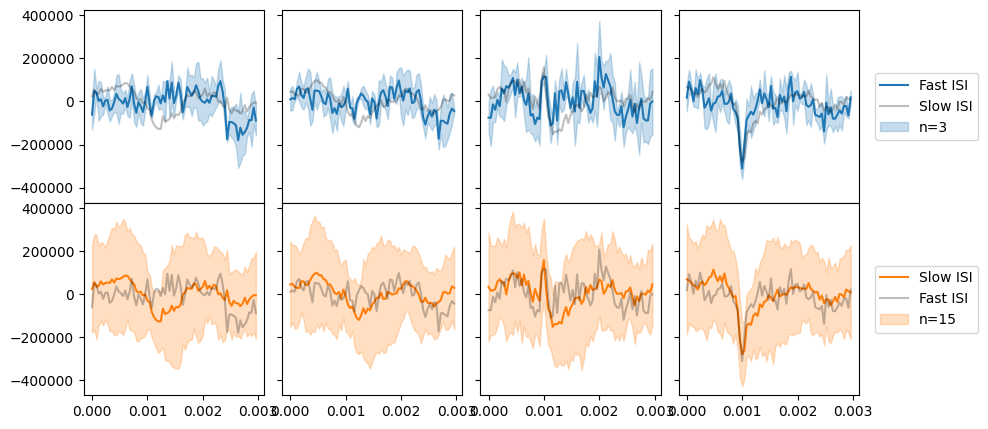

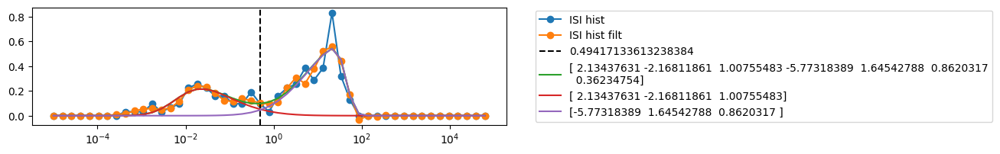

extract amplitudes: 100%|########################| 1805/1805 [00:00<00:00, 20933.19it/s]


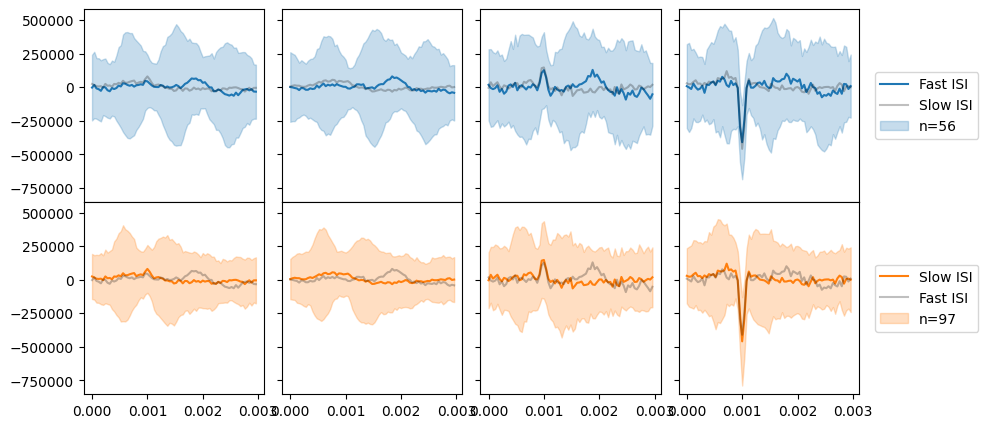

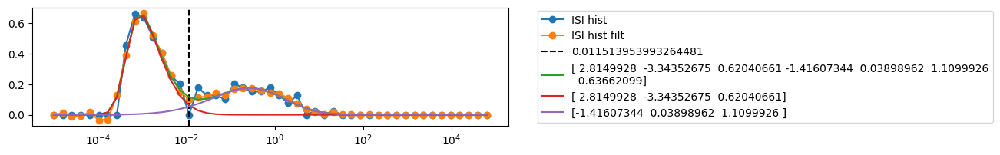

extract amplitudes: 100%|#########################| 1805/1805 [00:00<00:00, 3965.96it/s]


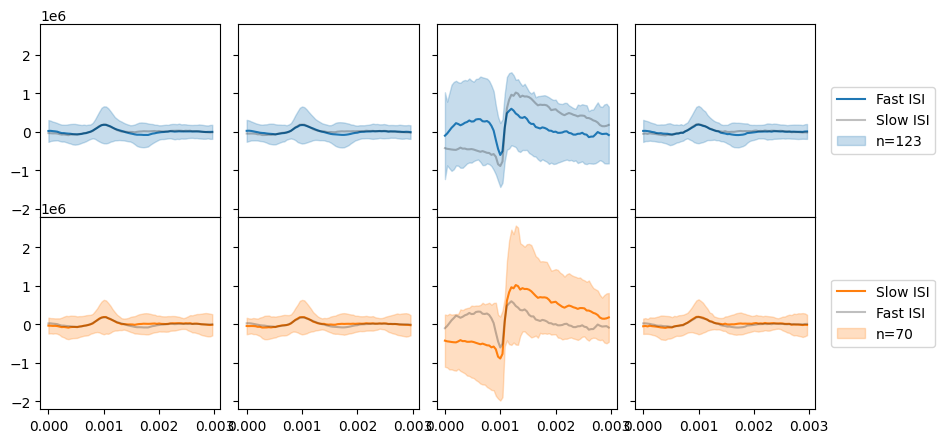

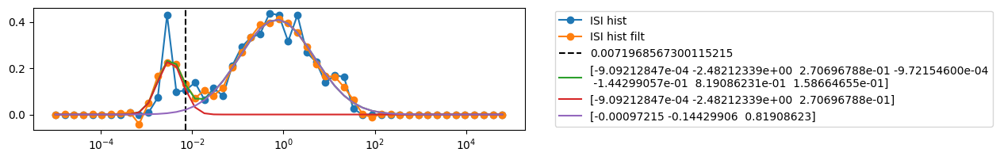

extract amplitudes: 100%|##########################| 1806/1806 [00:04<00:00, 430.18it/s]


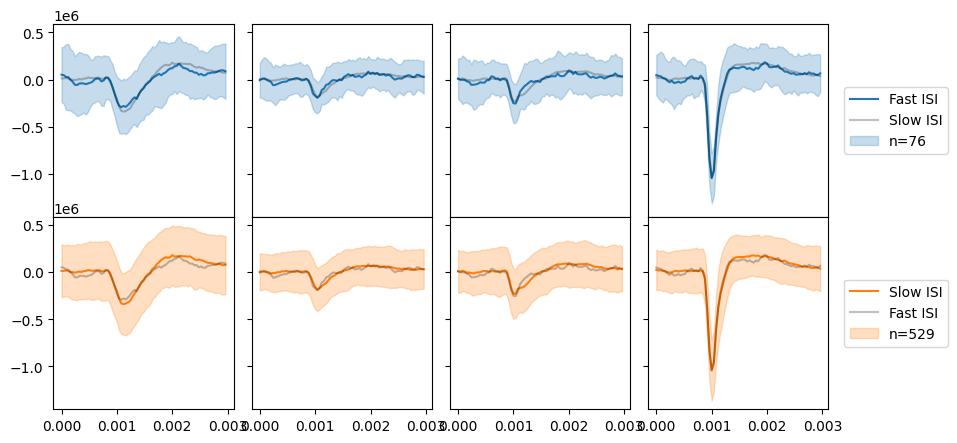

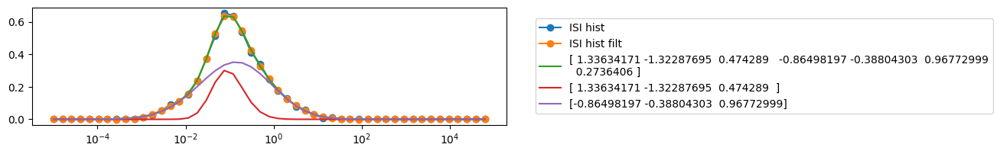

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1889.08it/s]


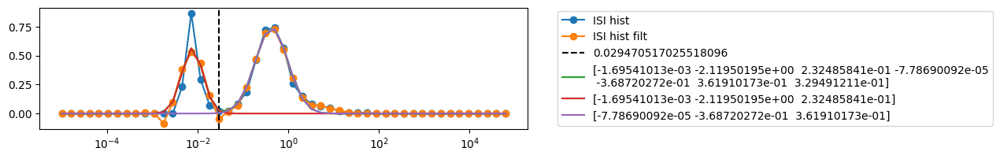

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1896.25it/s]


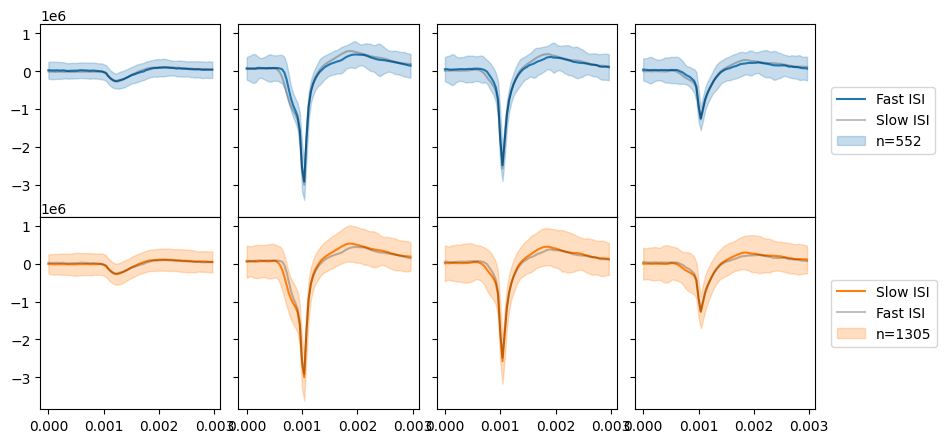

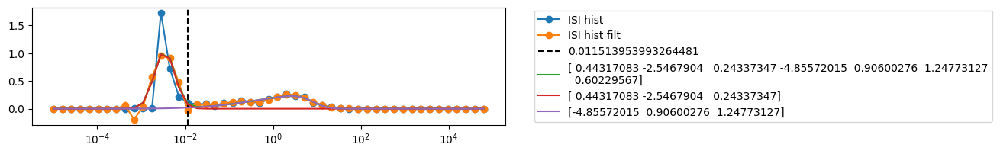

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1741.24it/s]


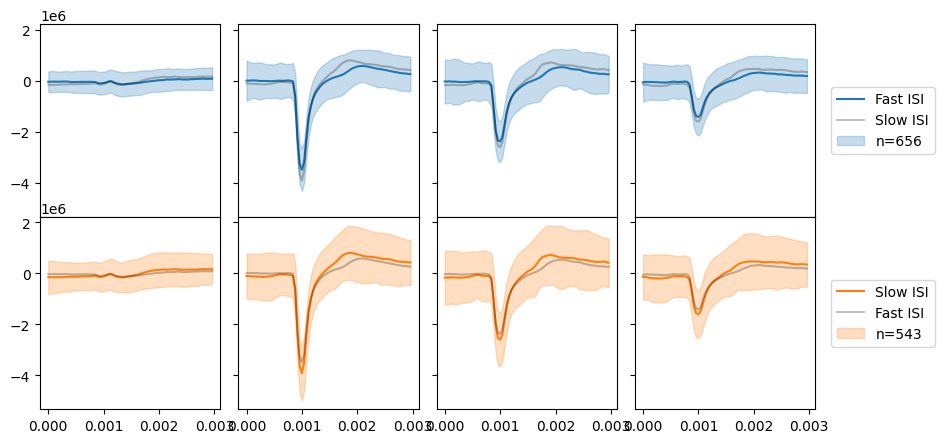

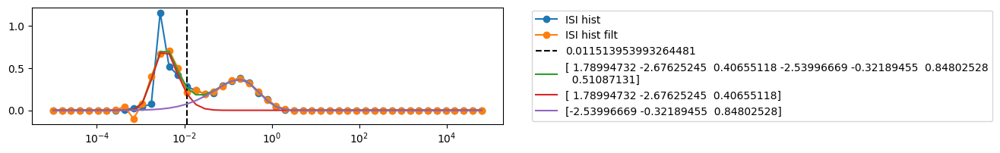

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1827.83it/s]


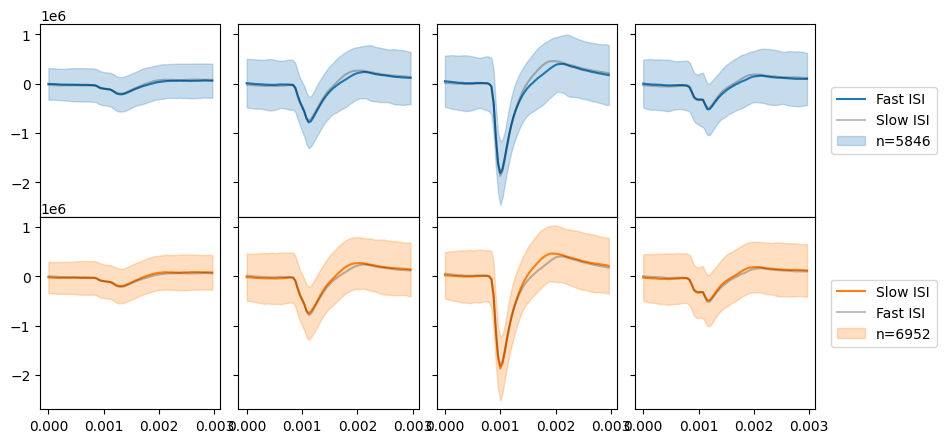

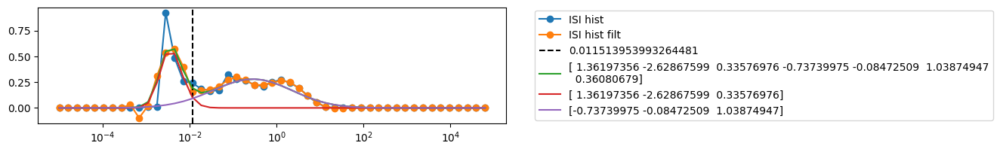

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1862.05it/s]


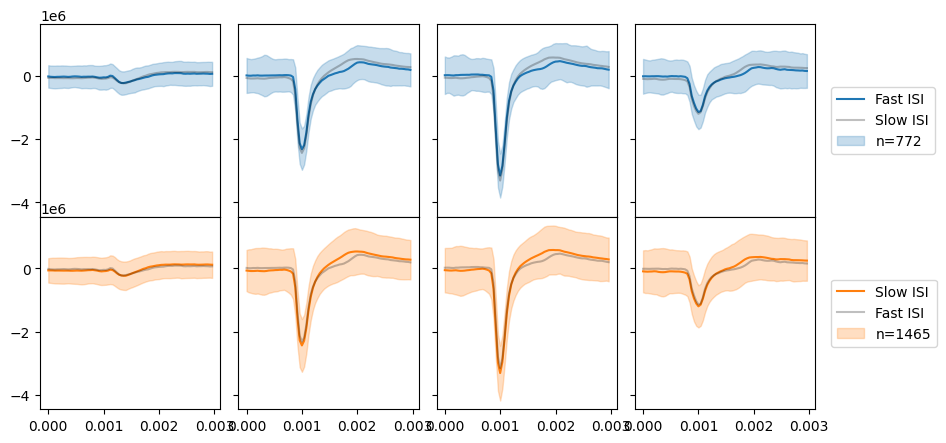

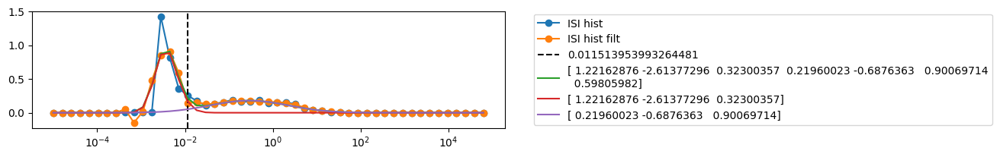

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1861.89it/s]


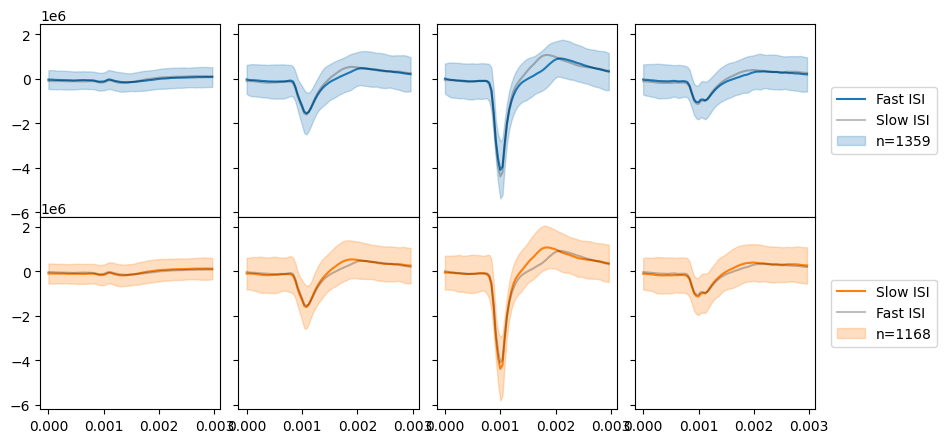

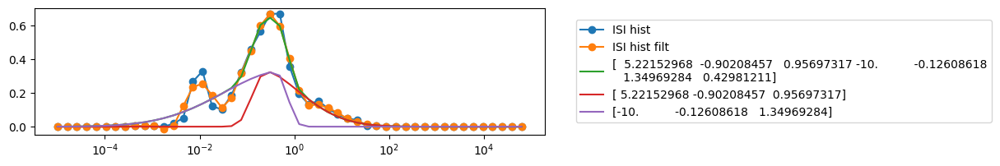

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 2001.95it/s]


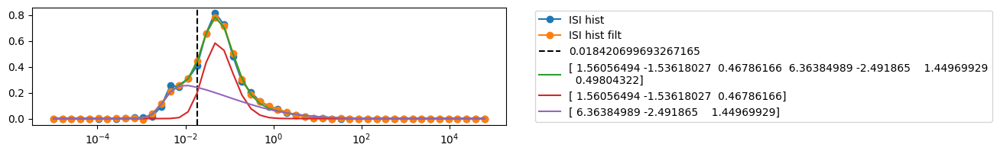

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 1826.47it/s]


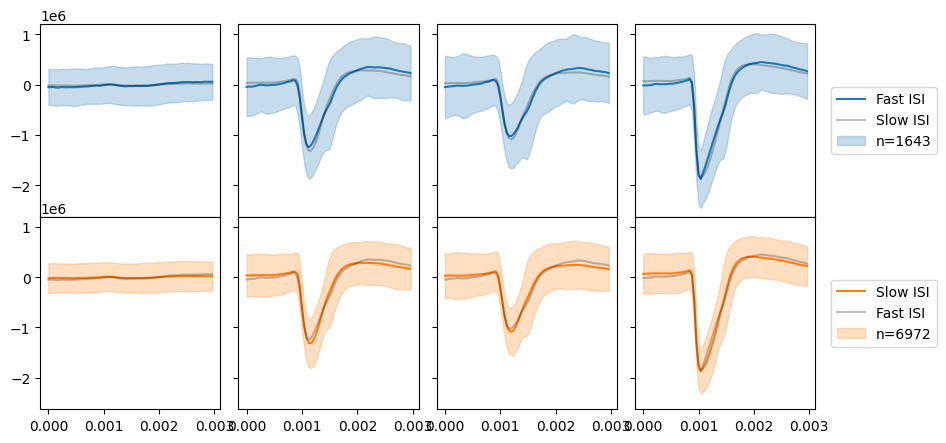

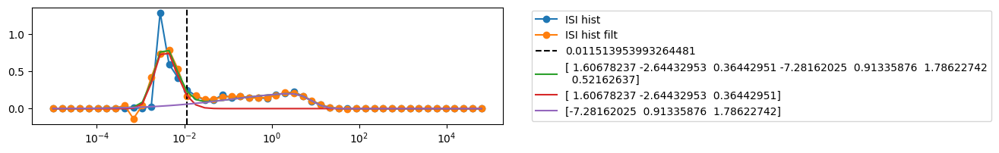

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1666.84it/s]


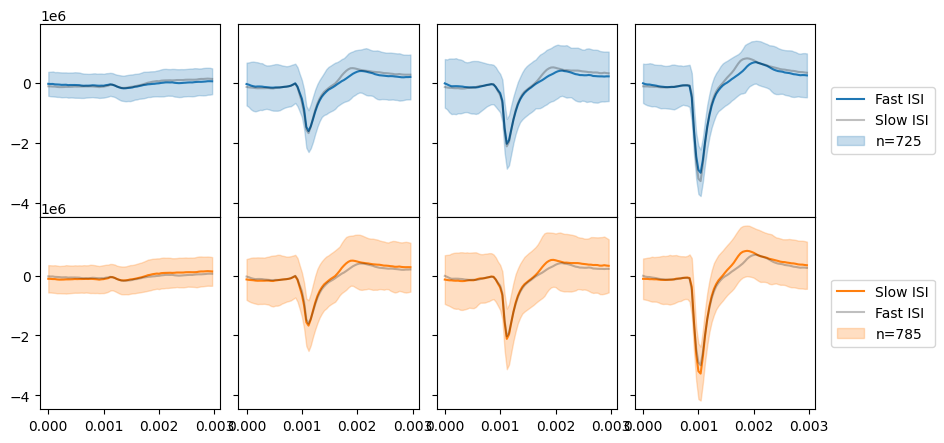

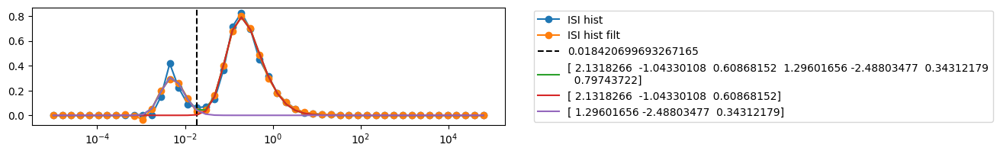

extract amplitudes: 100%|#########################| 1806/1806 [00:01<00:00, 1363.99it/s]


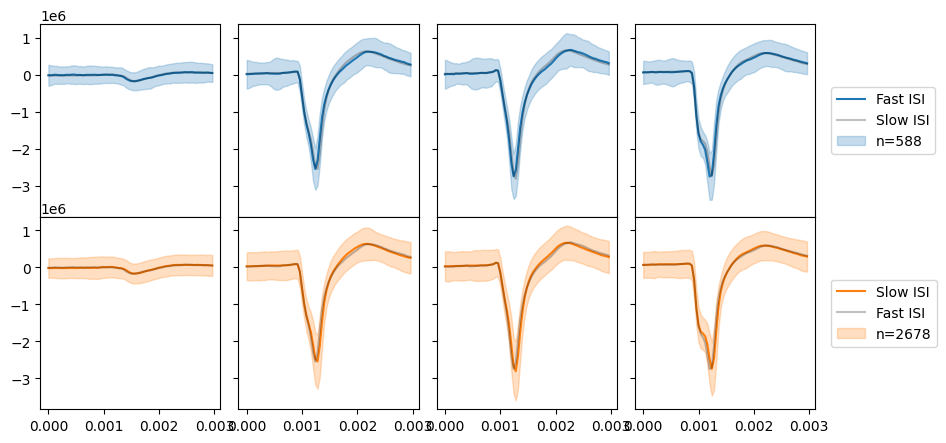

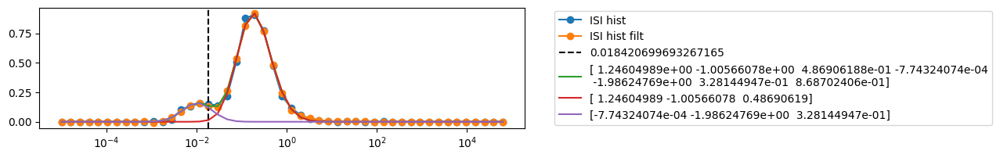

extract amplitudes: 100%|#########################| 1802/1802 [00:00<00:00, 2048.87it/s]


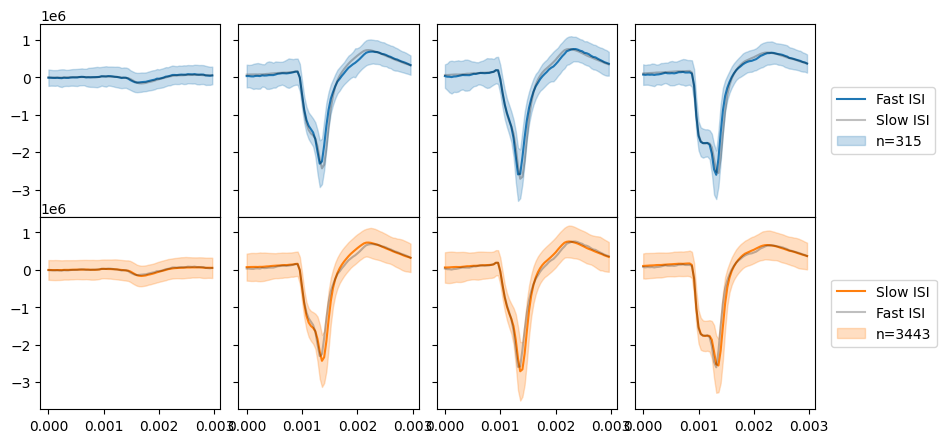

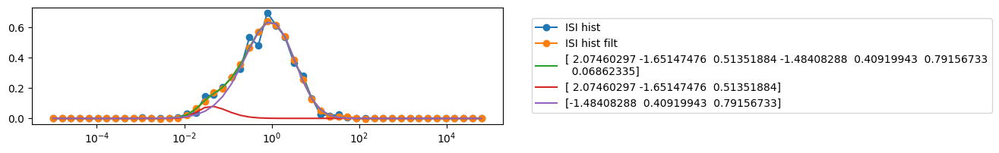

extract amplitudes: 100%|#########################| 1802/1802 [00:01<00:00, 1727.45it/s]


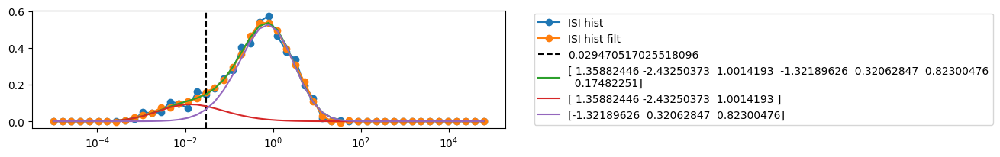

extract amplitudes: 100%|########################| 1806/1806 [00:00<00:00, 13324.57it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


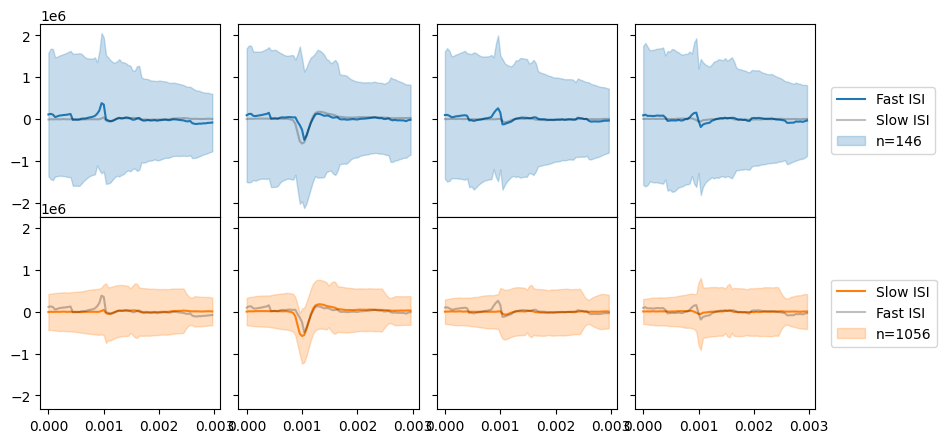

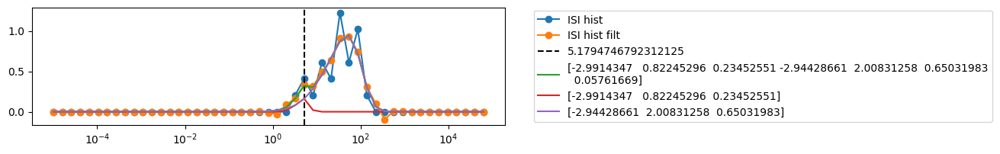

extract amplitudes: 100%|########################| 1806/1806 [00:00<00:00, 50199.56it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


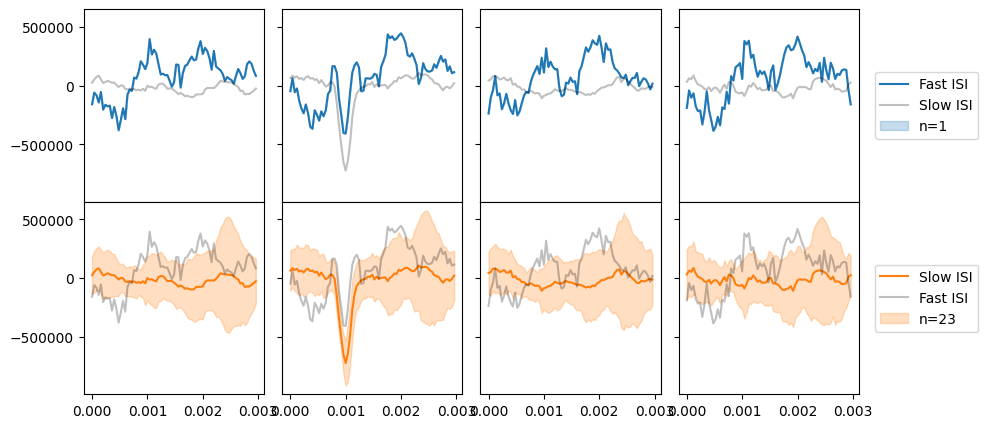

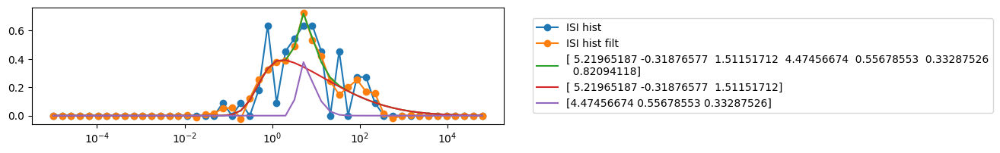

extract amplitudes: 100%|##########################| 1806/1806 [00:03<00:00, 587.06it/s]


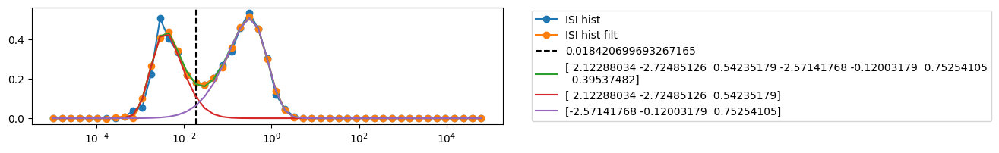

extract amplitudes: 100%|#########################| 1806/1806 [00:00<00:00, 3517.43it/s]


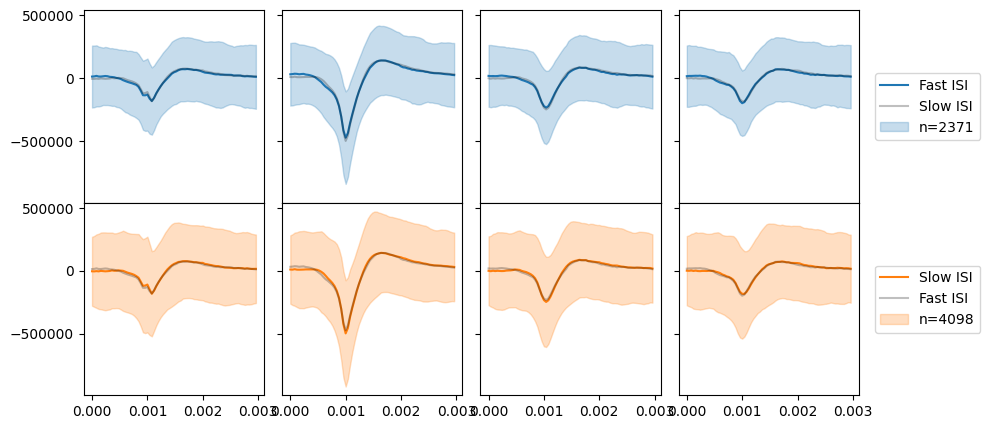

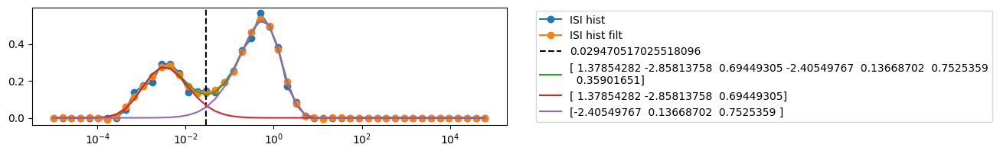

extract amplitudes: 100%|#########################| 1808/1808 [00:00<00:00, 8104.53it/s]


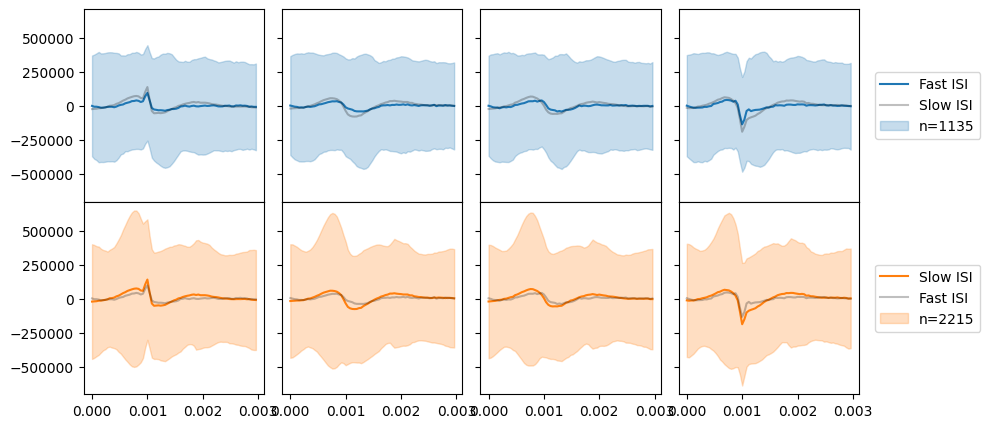

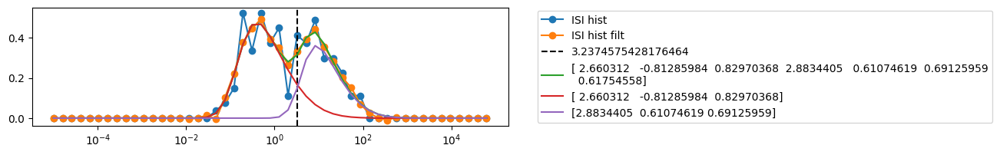

extract amplitudes: 100%|########################| 1808/1808 [00:00<00:00, 40137.94it/s]


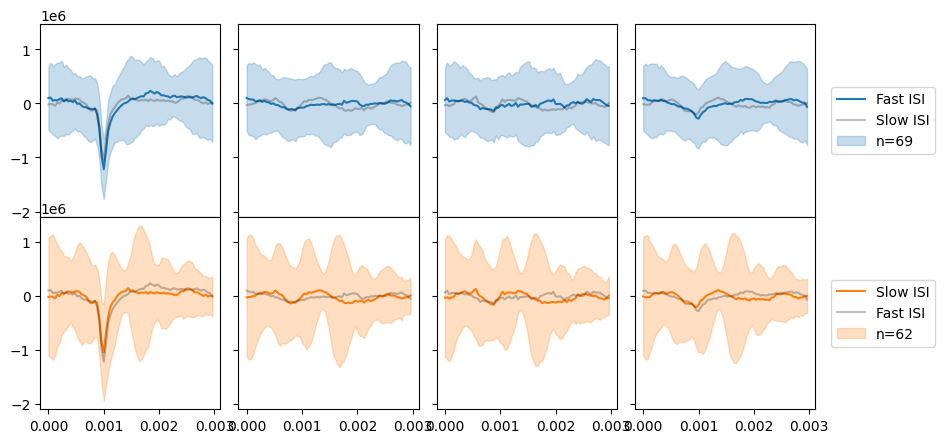

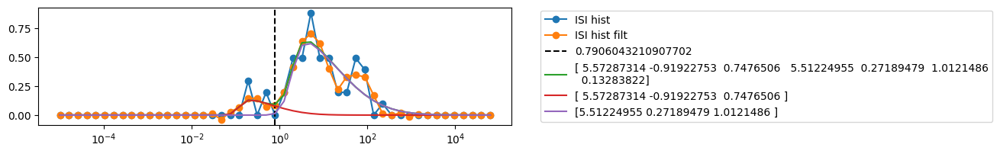

extract amplitudes: 100%|##########################| 1804/1804 [00:03<00:00, 600.33it/s]


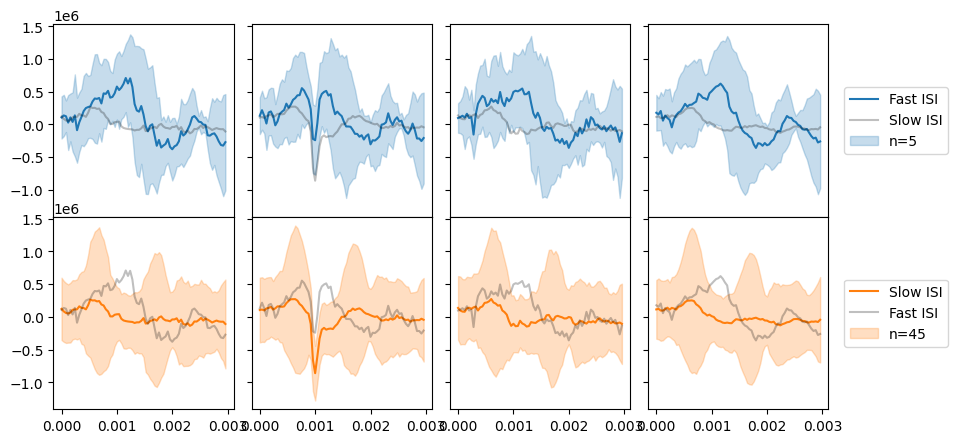

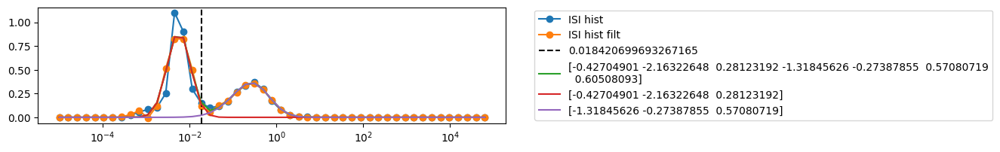

extract amplitudes: 100%|#########################| 1804/1804 [00:00<00:00, 3542.61it/s]


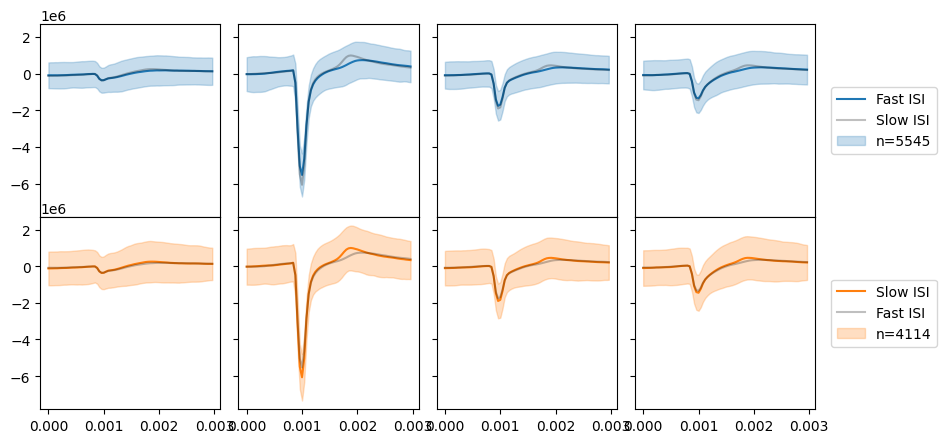

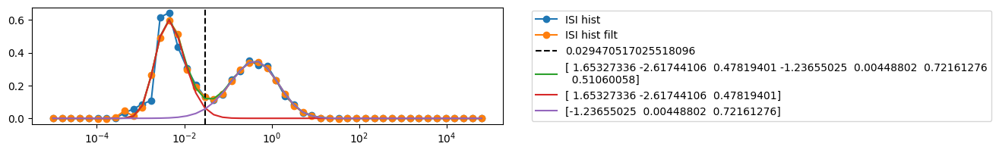

extract amplitudes: 100%|#########################| 1804/1804 [00:00<00:00, 3833.89it/s]


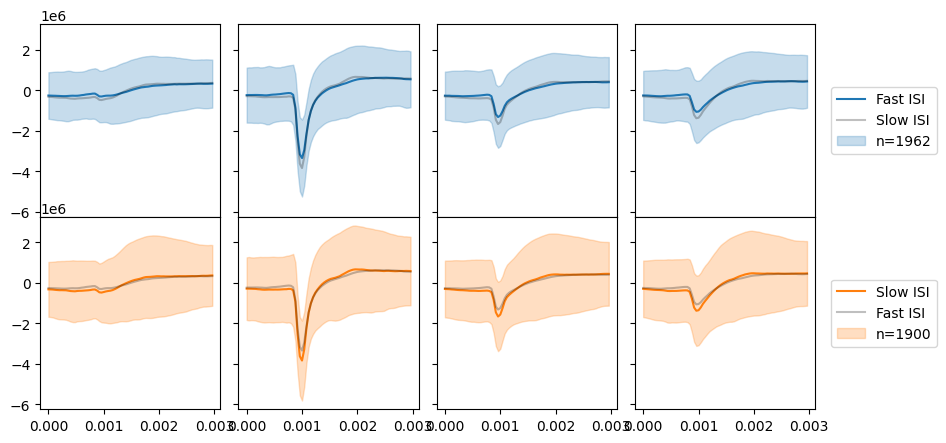

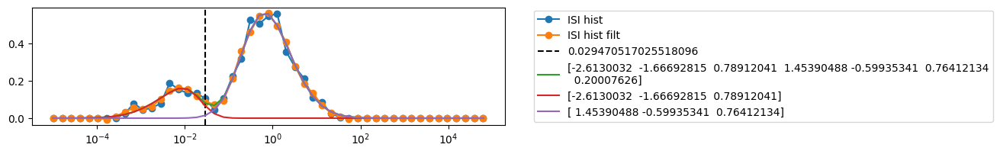

extract amplitudes: 100%|#########################| 1999/1999 [00:01<00:00, 1256.32it/s]


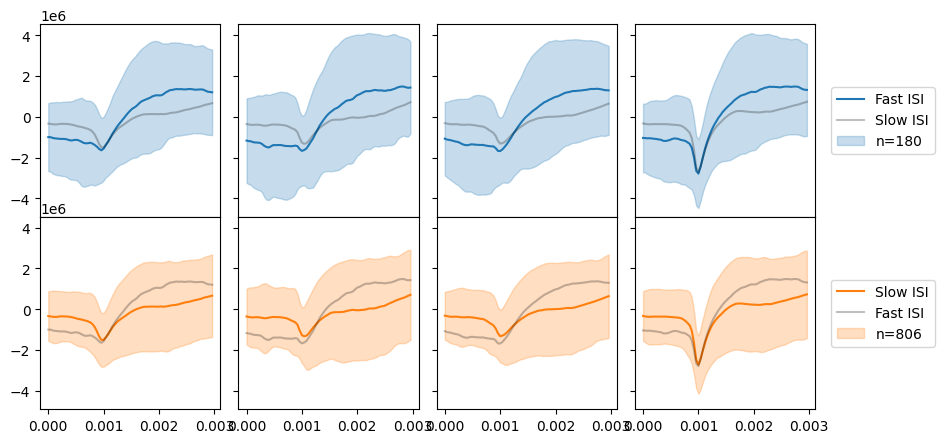

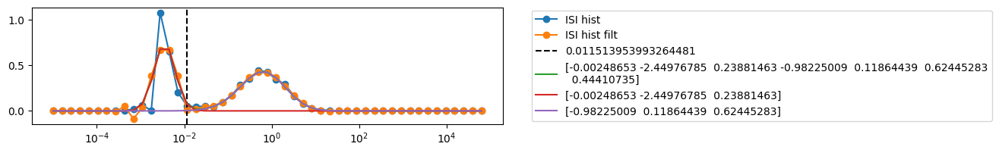

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 9718.30it/s]


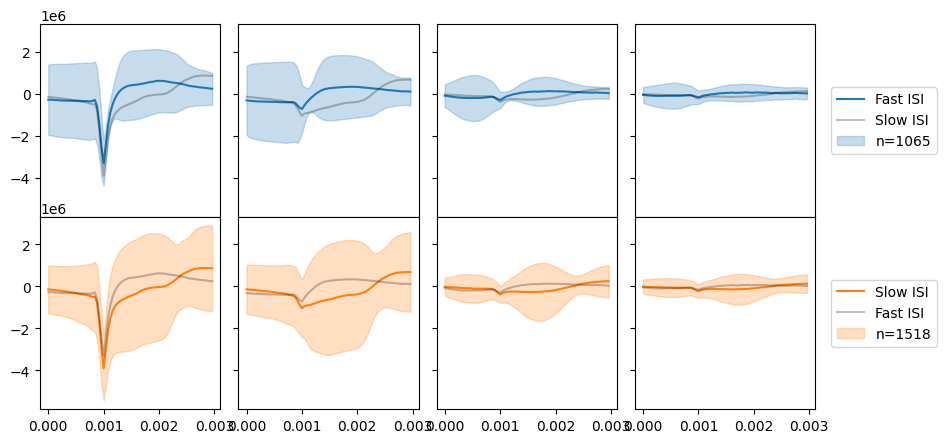

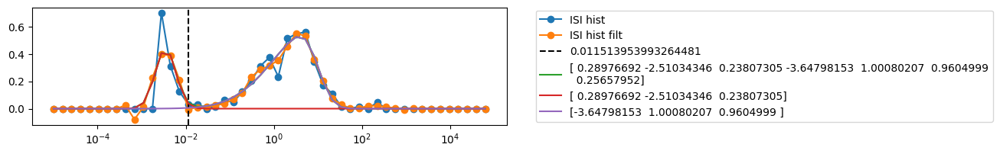

extract amplitudes: 100%|##########################| 1999/1999 [00:03<00:00, 659.96it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


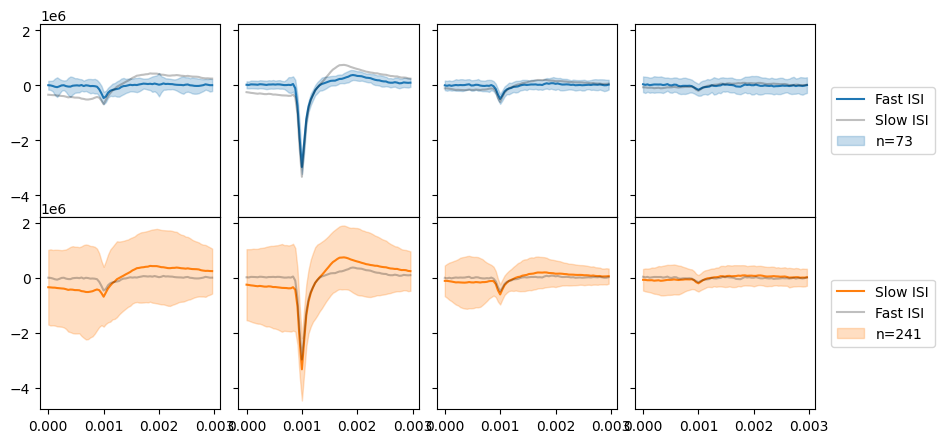

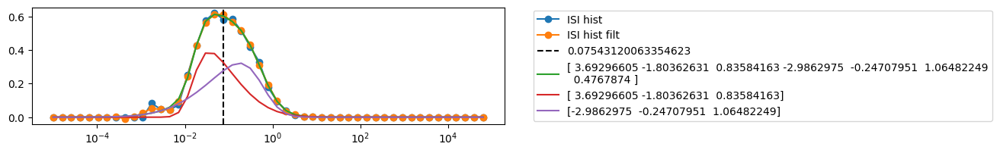

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 3050.63it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
/tmp/ipykernel_4191897/3514812414.py:99: RuntimeWarning: divide by zero encountered in scalar divide
  df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz


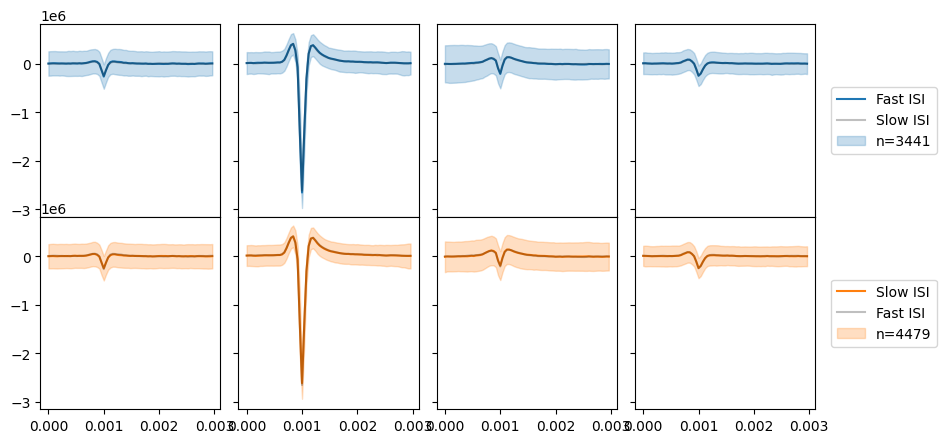

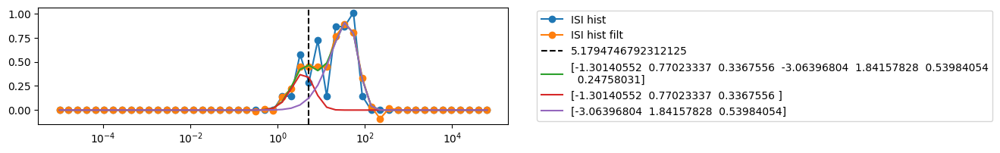

extract amplitudes: 100%|#########################| 1999/1999 [00:00<00:00, 4280.17it/s]
/tmp/ipykernel_4191897/3514812414.py:94: RuntimeWarning: invalid value encountered in divide
  isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))


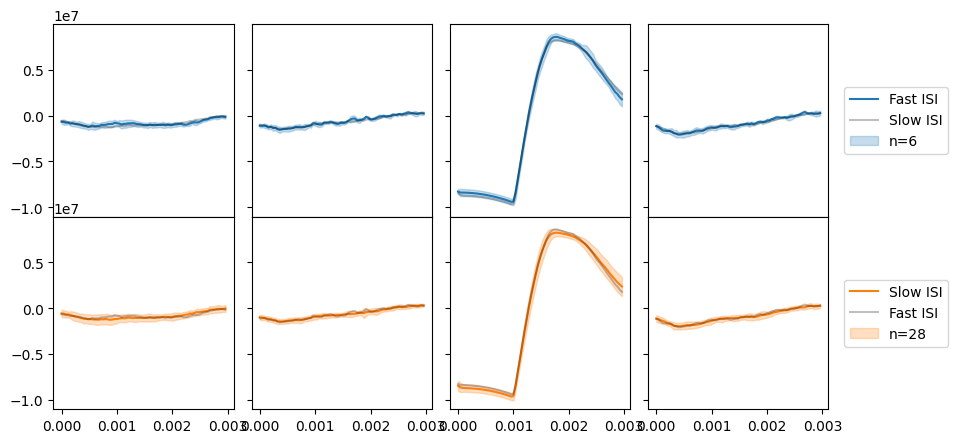

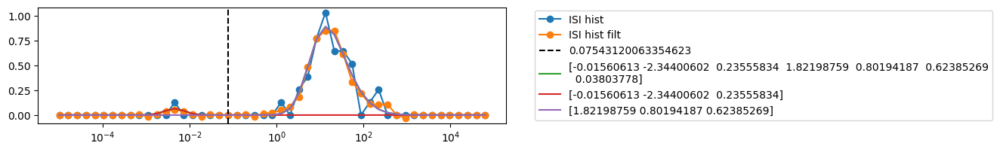

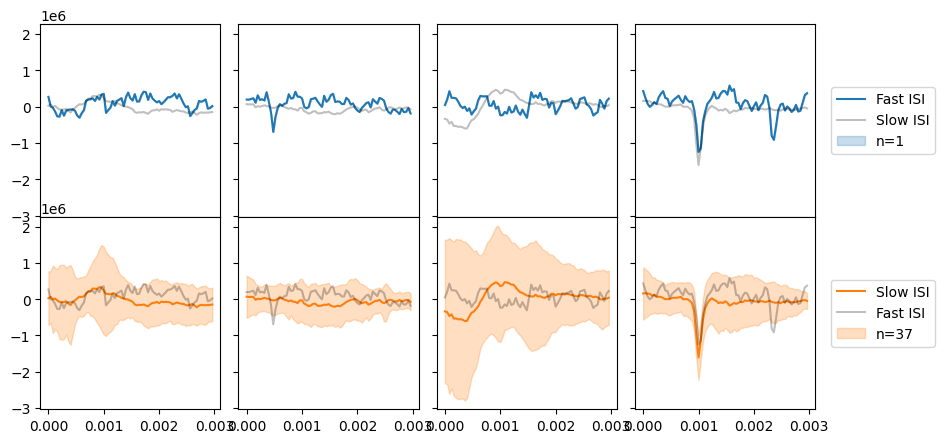

In [7]:
# # Calculate statistics for each unit in df_units
# # wet = df_units_qual.loc['1133-WT-ca1o-1', 'Waveforms'] # temp we for reference

# def skew_norm_pdf(x, shape, loc, scale):
#     return skewnorm.pdf(x, a=shape, loc=loc, scale=scale)

# def skew_norm_two_pdf(x, shape1, loc1, scale1, shape2, loc2, scale2, mix):
#     return skewnorm.pdf(x, a=shape1, loc=loc1, scale=scale1) * mix + skewnorm.pdf(x, a=shape2, loc=loc2, scale=scale2) * (1-mix)

# def norm_pdf(x, mean, std):
#     return norm.pdf(x, loc=mean, scale=std)

# def find_nearest_idx(array, value):
#     array = np.asarray(array)
#     idx = (np.abs(array - value)).argmin()
#     return idx

# def get_ISI_details(strain, unit_id, plotwaves=True):
#     isitrain = np.diff(strain)
#     bins_log = np.logspace(-5, 5, num=50)
#     bins_lin = np.linspace(-5, 5, num=50)
    
#     isiloghist, _ = np.histogram(isitrain, bins=bins_log)
#     isiloghist_filt = savgol_filter(isiloghist, 9, 5)
    
    
#     isiloghist = isiloghist / ( np.sum(isiloghist) * (bins_lin[1] - bins_lin[0]) )
#     isiloghist_filt = isiloghist_filt / ( np.sum(isiloghist_filt) * (bins_lin[1] - bins_lin[0]) )
#     fig, ax = plt.subplots(1, 1, figsize=(8, 2))
#     ax.semilogx(bins_log[:-1], isiloghist, 'o-', label='ISI hist')
#     ax.semilogx(bins_log[:-1], isiloghist_filt, 'o-', label='ISI hist filt')
#     isiloghist = isiloghist_filt
    
#     # popt, pcov = curve_fit(skew_norm_pdf, bins_lin[:-1], isiloghist, p0=[0, 0, 0.5], bounds=([-10, -5, 0.1], [10, 5, 5]))
#     # skewnormpdf = skew_norm_pdf(bins_lin[:-1], *popt)
#     # popt, _ = curve_fit(norm_pdf, bins_lin[:-1], isiloghist, p0=[0, 0.5])
#     # skewnormpdf = norm_pdf(bins_lin[:-1], *popt)

#     # Will need a try/catch in a good fit cannot be found
#     popt, pcov = curve_fit(skew_norm_two_pdf, bins_lin[:-1], isiloghist, p0=[0, -2, 0.5, 0, 1, 0.5, 0.5], bounds=([-10, -5, 0.1, -10, -5, 0.1, 0], [10, 5, 5, 10, 5, 5, 1]))
    
#     skewnormpdf = skew_norm_two_pdf(bins_lin[:-1], *popt)
#     skewnormpdf1 = skew_norm_pdf(bins_lin[:-1], *popt[0:3]) * popt[-1]
#     skewnormpdf2 = skew_norm_pdf(bins_lin[:-1], *popt[3:6]) * (1-popt[-1])
    
#     boundaries = (np.argmax(skewnormpdf1), np.argmax(skewnormpdf2))
#     boundary_idx = np.arange(min(boundaries), max(boundaries))
#     boundary_idx_change = np.diff(np.sign(skewnormpdf1[boundary_idx] - skewnormpdf2[boundary_idx])).nonzero()[0]
#     if boundary_idx_change.size != 0:
#         boundary = bins_log[boundary_idx[boundary_idx_change[0]]]
#         ax.axvline(boundary, color='black', ls='--', label=boundary)

#     # perr = np.sqrt(np.diag(pcov)) # Report goodness of fit
    
#     ax.plot(bins_log[:-1], skewnormpdf, label=popt)
#     ax.plot(bins_log[:-1], skewnormpdf1, label=popt[0:3])
#     ax.plot(bins_log[:-1], skewnormpdf2, label=popt[3:6])
#     ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5))
#     plt.show()

#     if boundary_idx_change.size != 0 and plotwaves:
#         waves_fast = we.get_waveforms(unit_id)[1:, :, :][isitrain < boundary, :, :]
#         waves_slow = we.get_waveforms(unit_id)[1:, :, :][isitrain >= boundary, :, :]
#         waves = [waves_fast, waves_slow]
        
#         fig, ax = plt.subplots(2, 4, figsize=(10, 5), sharex=True, sharey=True)
#         plt.subplots_adjust(wspace=0.1, hspace=0)
#         x = np.arange(waves_fast.shape[1]) / we.sampling_frequency
#         for i, wv in enumerate(waves):
#             for j in range(wv.shape[2]):
#                 wmean = wv[:, :, j].mean(axis=0)
#                 wmean_other = waves[i-1][:, :, j].mean(axis=0)
#                 wstd = wv[:, :, j].std(axis=0)
#                 ax[i, j].plot(x, wmean, c=f'C{i}', label=f'{["Fast", "Slow"][i]} ISI')
#                 ax[i, j].plot(x, wmean_other, c='black', alpha=0.25, label=f'{["Fast", "Slow"][i-1]} ISI')
#                 ax[i, j].fill_between(x, wmean - wstd, wmean + wstd, color=f'C{i}', alpha=0.25, label=f'n={wv.shape[0]}')
#                 if j == wv.shape[2]-1:
#                     ax[i, j].legend(loc='center left', bbox_to_anchor=(1.05, 0.5))

#     return popt

# for idx, row in df_units.iterrows():
#     we = row['Waveforms']
#     unit_id = int(idx.split('-')[-1])
    
#     df_units.loc[idx, 'Amplitude'] = spost.compute_spike_amplitudes(we, outputs='by_unit')[0][unit_id].mean() / 1e6 # uV to V
    
#     tmet = spost.compute_template_metrics(we)
#     df_units.loc[idx, 'P-T Ratio'] = tmet.loc[unit_id, 'peak_trough_ratio']
#     df_units.loc[idx, 'Recovery Slope'] = tmet.loc[unit_id, 'recovery_slope']
#     df_units.loc[idx, 'Repolarization Slope'] = tmet.loc[unit_id, 'repolarization_slope']
    
#     isihist, isix = spost.compute_isi_histograms_numpy(we.sorting, window_ms=10000.0, bin_ms=1)
#     isihist = isihist / np.sum(isihist, axis=1).reshape((-1, 1))
#     isihistcu = np.cumsum(isihist, axis=1)
#     medians = np.array([np.interp(0.5, isihistcu[i, :], isix[:-1]) for i in range(isihist.shape[0])])
    
#     df_units.loc[idx, 'Mode ISI'] = isix[np.argmax(isihist[unit_id-1, :])] / 1000 # seconds
#     df_units.loc[idx, 'Mode ISI Rate'] = 1 / df_units.loc[idx, 'Mode ISI'] # Hz
#     df_units.loc[idx, 'Median ISI'] = medians[unit_id-1] / 1000 # seconds
#     df_units.loc[idx, 'Median ISI Rate'] = 1 / df_units.loc[idx, 'Median ISI']  # ms to seconds

#     strain = we.sorting.get_unit_spike_train(unit_id) / we.sampling_frequency
#     popt = get_ISI_details(strain, unit_id, plotwaves=True)
#     df_units.loc[idx, 'Slow ISI Skew'] = popt[0]
#     df_units.loc[idx, 'Fast ISI Skew'] = popt[3]
    
#     df_units.loc[idx, 'Firing Rate'] = we.sorting.count_num_spikes_per_unit()[unit_id] / we.recording.get_total_duration()

#     df_units.loc[idx, 'Half Width'] = spost.template_metrics.get_half_width(we.get_template(unit_id)[:, si.get_template_extremum_channel(we, outputs='index')[unit_id]], we.sampling_frequency)
#     # print(df_units.loc[idx, 'Half Width'])




In [8]:
# exclude_cols = ['ID', 'Genotype', 'Region', 'Naive Optimal Depth', 'Filename', 'Waveforms', 'Units']
# include_cols = [x for x in df_units.columns if x not in exclude_cols]
# print(exclude_cols)
# print(include_cols)


['ID', 'Genotype', 'Region', 'Naive Optimal Depth', 'Filename', 'Waveforms', 'Units']
['Amplitude', 'P-T Ratio', 'Recovery Slope', 'Repolarization Slope', 'Mode ISI', 'Mode ISI Rate', 'Median ISI', 'Median ISI Rate', 'Slow ISI Skew', 'Fast ISI Skew', 'Firing Rate', 'Half Width']


## Calculate Unit Quality Metrics

In [9]:
# # Calculate quality metrics for each unit in df_units
# df_units_qual = df_units
# df_units_qual = df_units_qual.drop(columns=include_cols)

# # display(wet.recording.get_property_keys())
# # display(wet.recording.get_property('gain_to_uV'))

# for idx, row in df_units_qual.iterrows():
#     we = row['Waveforms']
#     unit_id = int(idx.split('-')[-1])
#     n_units = we.sorting.get_num_units()
    
#     # df_units_qual.loc[idx, 'Amplitude Cutoff'] = sqm.compute_amplitude_cutoffs(we, num_histogram_bins=100, amplitudes_bins_min_ratio=3)[unit_id]
    
#     # Calculate Principal Components
#     pc = spost.compute_principal_components(we, mode='concatenated')
#     pcs = pc.get_all_projections()[1]
#     pc_labels = pc.get_all_projections()[0]

#     # Calculate metrics
#     df_units_qual.loc[idx, 'Amplitude CV Median'] = sqm.compute_amplitude_cv_metrics(we, average_num_spikes_per_bin=25)[0][unit_id] # Smaller is better
#     df_units_qual.loc[idx, 'Amplitude CV Range'] = sqm.compute_amplitude_cv_metrics(we, average_num_spikes_per_bin=25)[1][unit_id] # Smaller is better
#     df_units_qual.loc[idx, 'Amplitude Median'] = sqm.compute_amplitude_medians(we)[unit_id] # Larger is better
    
#     if n_units == 1:
#         df_units_qual.loc[idx, 'D-Prime'] = np.nan
#     else:
#         df_units_qual.loc[idx, 'D-Prime'] = sqm.lda_metrics(pcs, pc_labels, unit_id) # Larger is better, uses Linear Discriminant Analysis

#     df_units_qual.loc[idx, 'Firing Rate'] = sqm.compute_firing_rates(we)[unit_id] # Smaller is better, but for bursting neurons can be large
#     df_units_qual.loc[idx, 'Firing Range'] = sqm.compute_firing_ranges(we)[unit_id] # Smaller is better, but for bursting neurons can be large

#     df_units_qual.loc[idx, 'ISI Violation Ratio'] = sqm.compute_isi_violations(we, isi_threshold_ms=1.0)[0][unit_id] # Smaller is better. May exceed 1 if correlated contamination
    
#     iso_dist, l_ratio = sqm.mahalanobis_metrics(pcs, pc_labels, unit_id)
#     df_units_qual.loc[idx, 'Isolation Distance'] = iso_dist # Larger is better, though tetrodes are only so big
#     df_units_qual.loc[idx, 'L-Ratio'] = l_ratio # Smaller is better, can quantify contamination based on location of spikes in PCA-space

#     if n_units == 1:
#         nn_hit = nn_miss = nn_iso = nn_unit_id = nn_noise_over = np.nan
#     else:
#         nn_hit, nn_miss = sqm.nearest_neighbors_metrics(pcs, pc_labels, unit_id, max_spikes=1000, n_neighbors=5)
#         nn_iso, nn_unit_id = sqm.nearest_neighbors_isolation(we, unit_id)
#         nn_noise_over = sqm.nearest_neighbors_noise_overlap(we, unit_id)
    
#     df_units_qual.loc[idx, 'NN Hits'] = nn_hit # Larger is better, indicates contamination from neighbors
#     df_units_qual.loc[idx, 'NN Misses'] = nn_miss # Smaller is better, indicates under-detection of spikes
#     df_units_qual.loc[idx, 'NN Isolation'] = nn_iso # Larger is better, indicates worst-case cluster separation
#     df_units_qual.loc[idx, 'NN Unit ID'] = nn_unit_id # The most similar unit ID according to nearest-neighbors clustering
#     df_units_qual.loc[idx, 'NN Noise Overlap'] = nn_noise_over # Smaller is better, indicates a unit is noisy
    
#     df_units_qual.loc[idx, 'Presence Ratio'] = sqm.compute_presence_ratios(we)[unit_id] # Larger is better, though behavioral changes can violate

#     df_units_qual.loc[idx, 'SD Ratio'] = sqm.compute_sd_ratio(we)[unit_id] # Smaller is better, expected to be 1. Large values can indicate contamination or polymorphic spikes

#     if n_units == 1:
#         df_units_qual.loc[idx, 'Simple Silhouette'] = np.nan
#     else:
#         df_units_qual.loc[idx, 'Simple Silhouette'] = sqm.simplified_silhouette_score(pcs, pc_labels, unit_id) # Larger is better. Negative (-1) means contamination/under-detection
#     # ss_full = sqm.silhouette_score(pcs, pc_labels, unit_id) # The code seems to be bugged
#     # df_units_qual.loc[idx, 'Silhouette'] = ss_full # Larger is better. Negative (-1) means contamination/under-detection

#     df_units_qual.loc[idx, 'Sliding RP Violations'] = sqm.compute_sliding_rp_violations(we)[unit_id] # Smaller is better, like ISI violations

#     df_units_qual.loc[idx, 'SNR'] = sqm.compute_snrs(we)[unit_id] # Larger is better, means less noise

#     # sqm.compute_synchrony_metrics(we) # Does not give a direct report per unit, and may not be applicable because of high spatial localization of tetrodes


# display(df_units_qual.head())


Projecting waveforms: 100%|██████████████████████████████| 2/2 [00:00<00:00, 169.36it/s]
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv/lib64/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/mnt/isilon/marsh_single_unit/MarshMountainSort/venv

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude CV Median,Amplitude CV Range,Amplitude Median,...,NN Hits,NN Misses,NN Isolation,NN Unit ID,NN Noise Overlap,Presence Ratio,SD Ratio,Simple Silhouette,Sliding RP Violations,SNR
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,NaN,NaN,1334258.25,...,0.131148,0.046060,0.961765,2.0,0.092647,0.8,1.919234,0.136820,NaN,8.416593
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.133033,0.106814,1972938.75,...,0.883489,0.103839,0.957384,3.0,0.013291,1.0,1.107618,0.276770,NaN,9.978686
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.211586,0.165604,1094443.00,...,0.897260,0.116053,0.957595,2.0,0.048592,1.0,0.979450,0.292130,NaN,5.634819
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.226987,0.109206,3413978.00,...,0.937243,0.011229,0.975875,2.0,0.010506,1.0,3.717195,0.398578,NaN,21.717373
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,0.211444,0.258239,2385662.50,...,0.807554,0.162521,0.917039,3.0,0.019545,1.0,2.913763,0.304229,NaN,15.419251


In [10]:
include_cols_qual = [x for x in df_units_qual.columns if x not in exclude_cols]
print(include_cols_qual)

qual_compare = {'Amplitude CV Median' : (np.less, 1.0),
                'Amplitude Median' : (np.less, 6e6), #  <8 mV
                'ISI Violation Ratio' : (np.less, 5.0), # Throws out well correlated noise spikes. Maybe not a bad thing considering we are testing correlations?
                'NN Noise Overlap' : (np.less, 0.3), # Signals would only be 75% isolated from the noise
                'SD Ratio' : (np.less, 5), # Large values indicate spike contamination
                'SNR' : (np.greater, 0.5)}


['Amplitude CV Median', 'Amplitude CV Range', 'Amplitude Median', 'D-Prime', 'Firing Rate', 'Firing Range', 'ISI Violation Ratio', 'Isolation Distance', 'L-Ratio', 'NN Hits', 'NN Misses', 'NN Isolation', 'NN Unit ID', 'NN Noise Overlap', 'Presence Ratio', 'SD Ratio', 'Simple Silhouette', 'Sliding RP Violations', 'SNR']


## Remove Low Quality Units

/tmp/ipykernel_4191897/3923531063.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45, horizontalalignment='right')


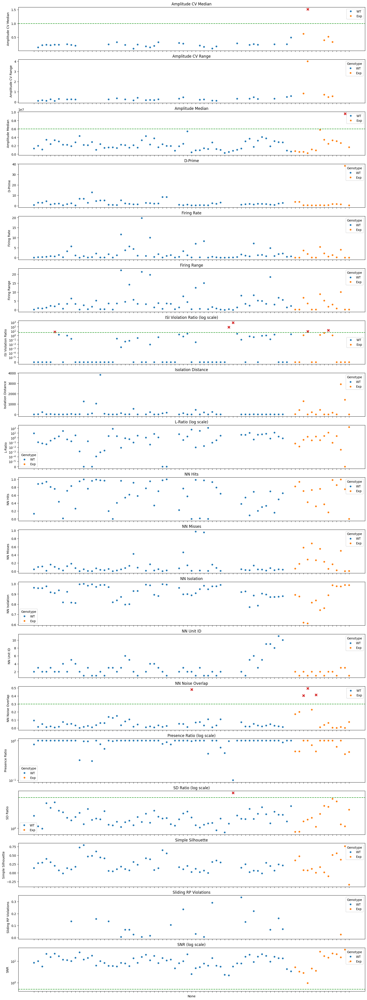

In [11]:
df_units_qual_allvalid = df_units_qual
fig, ax = plt.subplots(len(include_cols_qual), 1, figsize=(20, 3 * len(include_cols_qual)), sharex=True)
for i, qual in enumerate(include_cols_qual):
    if "Ratio" in qual or "SNR" in qual:
        # ax[0].set_yscale("log")
        ax[i].set_yscale("symlog", linthresh=1e-5)
        ax[i].set_title(f"{qual} (log scale)")
    else:
        ax[i].set_title(f"{qual}")
        
    plot = sns.scatterplot(data=df_units_qual, x=df_units_qual.index, y=qual, hue='Genotype', ax=ax[i])
    if i != len(include_cols_qual)-1:
        plot.set(xticklabels=[])

    if qual in qual_compare.keys():
            
        func, threshold = qual_compare[qual]
        df_units_qual_valid = df_units_qual[func(df_units_qual[qual], threshold)]
        df_units_qual_allvalid = df_units_qual_allvalid[func(df_units_qual_allvalid[qual], threshold) | np.invert(df_units_qual_allvalid[qual].notna())]
        df_units_qual_omit = df_units_qual[np.invert(func(df_units_qual[qual], threshold))]
        
        sns.scatterplot(data=df_units_qual_omit, x=df_units_qual_omit.index, y=qual, marker='X', c='C3', s=100, ax=ax[i])
        ax[i].axhline(threshold, c='C2', ls='--')


plot.set_xticklabels(plot.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In [12]:
allvalid_idx = list(df_units_qual_allvalid.index.values)

# Individual, large N data with labeled True/False validity
for idx, row in df_units.iterrows():
    if idx in allvalid_idx:
        df_units.loc[idx, 'Valid'] = True
    else:
        df_units.loc[idx, 'Valid'] = False
display(df_units.head())

# Aggregate, small N data
df_units_avgs = df_units[df_units['Valid']].groupby(['ID', 'Genotype', 'Region'])[include_cols].mean().reset_index()
display(df_units_avgs.head())

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1380303.750,-0.294900,-3.430370e+08,4.563134e+09,7.319,0.136631,8.41400,0.118850,4.514486,-0.006936,0.036957,0.00024,True
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1959315.750,-0.232559,-5.111473e+08,6.450244e+09,0.817,1.223990,4.26700,0.234357,1.432110,3.060253,0.257609,0.00020,True
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1106396.625,-0.193530,-1.900401e+08,3.150308e+09,0.947,1.055966,6.40100,0.156226,0.691192,-1.258620,0.308696,0.00020,True
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-3276414.250,-0.181414,-4.569853e+08,1.011188e+10,0.134,7.462687,0.18850,5.305040,0.598696,-3.256058,0.452465,0.00024,True
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2383452.500,-0.180912,-3.944930e+08,4.529559e+09,0.096,10.416667,0.12725,7.858546,0.001105,-4.408912,0.774648,0.00020,True


,ID,Genotype,Region,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width
0,1133,WT,ca1o,-1482005.375,-0.240330,-3.480748e+08,4.721229e+09,3.027667,0.805529,6.360667,0.169811,2.212596,0.598232,0.201087,0.000213
1,1133,WT,ca3,-2829933.500,-0.181163,-4.257391e+08,7.320720e+09,0.115000,8.939677,0.157875,6.581793,0.299900,-3.832485,0.613556,0.000220
2,1176,WT,ca1o,-2470665.000,-0.221170,-3.832663e+08,6.282725e+09,0.126600,11.152734,0.903400,1.335629,2.374313,-1.858842,2.307143,0.000216
3,1176,WT,ca3,-3392577.500,-0.147817,-3.439047e+08,2.155974e+10,0.170500,6.955209,0.201150,5.915272,0.005567,-2.091718,0.386980,0.000200
4,1178,WT,ca1s,-1960927.625,-0.237275,-4.245411e+08,7.155517e+09,0.807333,3.053150,3.539500,0.300906,0.644834,1.410713,0.816761,0.000267


## Visualize All High Quality Units

0 ['1133', 'WT', 'ca1o', '1']
1 ['1133', 'WT', 'ca1o', '2']
2 ['1133', 'WT', 'ca1o', '3']
3 ['1133', 'WT', 'ca3', '1']
4 ['1133', 'WT', 'ca3', '2']
5 ['1133', 'WT', 'ca3', '3']
6 ['1176', 'WT', 'ca1o', '1']
7 ['1176', 'WT', 'ca1o', '2']
8 ['1176', 'WT', 'ca1o', '3']
9 ['1176', 'WT', 'ca1o', '4']
10 ['1176', 'WT', 'ca1o', '5']
11 ['1176', 'WT', 'ca3', '1']
12 ['1176', 'WT', 'ca3', '2']
13 ['1178', 'WT', 'ca1s', '1']
14 ['1178', 'WT', 'ca1s', '2']
15 ['1178', 'WT', 'ca1s', '3']
16 ['1203', 'WT', 'ca1o', '1']
17 ['1203', 'WT', 'ca1o', '2']
18 ['1211', 'WT', 'ca1o', '1']
19 ['1211', 'WT', 'ca1o', '2']
20 ['1211', 'WT', 'ca1o', '3']
21 ['1211', 'WT', 'ca1o', '4']
22 ['1211', 'WT', 'ca1o', '5']
23 ['1211', 'WT', 'ca1o', '6']
24 ['1211', 'WT', 'ca1s', '1']
25 ['1211', 'WT', 'ca1s', '2']
26 ['1211', 'WT', 'ca3', '1']
27 ['1225', 'WT', 'ca1o', '1']
28 ['1225', 'WT', 'ca1o', '2']
29 ['1225', 'WT', 'ca1o', '3']
30 ['1225', 'WT', 'ca1o', '4']
31 ['1225', 'WT', 'ca1s', '1']
32 ['1225', 'WT', 'ca1s'

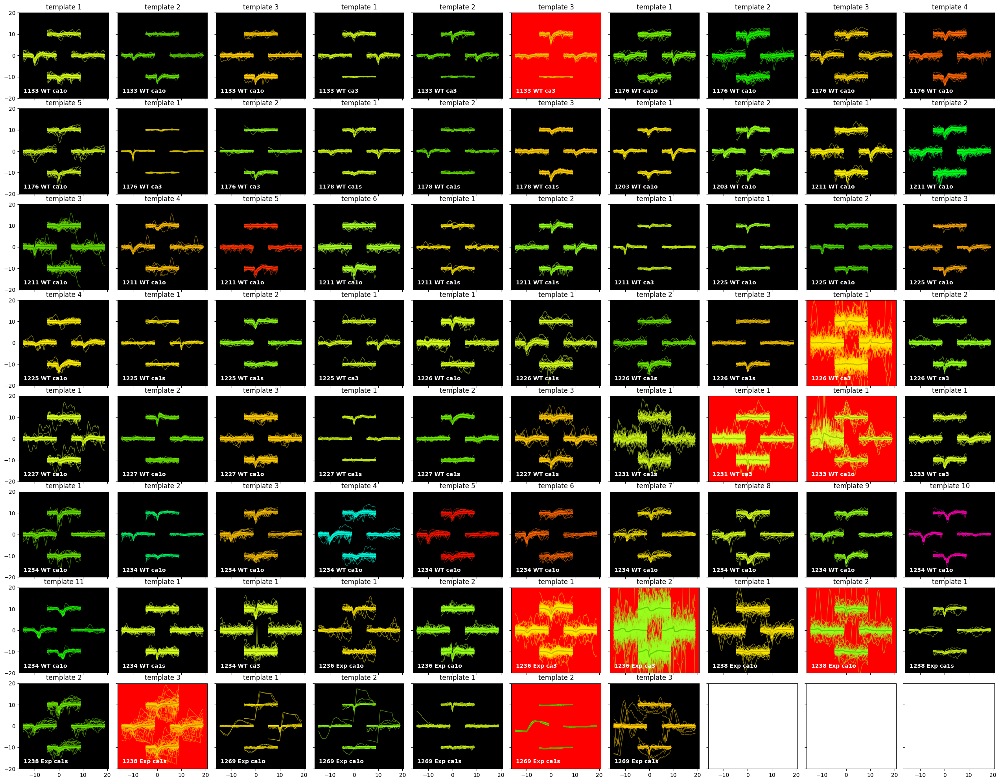

In [13]:
n_plot_cols = 10
n_plots = len(df_units)
n_plot_rows = int(np.ceil(n_plots / n_plot_cols))
x_subplot_size = 4

# display(df_units[df_units['Valid']])
# display(len(df_units[df_units['Valid']]))
# break

fig, ax = plt.subplots(n_plot_rows, n_plot_cols, sharex=True, sharey=True, figsize=(n_plot_rows * x_subplot_size, 25))
plt.subplots_adjust(wspace=0.1, hspace=0.12)
ax[0,0].set_ylim(-20, 20)

for i in range(n_plot_rows):
    for j in range(n_plot_cols):
        # ax[i, j].scatter(np.random.normal(size=10), np.random.normal(size=10))
        rowidx = i * n_plot_cols + j

        if rowidx >= n_plots:
            continue
        
        we = df_units.iloc[rowidx, :].loc['Waveforms']
        idxlist = df_units.index[rowidx].split('-')
        unitidx = int(idxlist[-1])
        
        # print(we)
        print(rowidx, idxlist)

        if df_units.iloc[rowidx, :].loc['Valid']:
            ax[i, j].set_facecolor('black')
        else:
            ax[i, j].set_facecolor('red')
            
        # sw.plot_unit_templates(we, unit_ids=[unitidx], plot_templates=True, ax=ax[i, j], scale=3e15, same_axis=True)
        sw.plot_unit_waveforms(we, unit_ids=[unitidx], plot_templates=True, ax=ax[i, j], scale=3e15, same_axis=True, plot_legend=False)
        # sw.plot_unit_waveforms(we, ax=ax[i, j], same_axis=True, scale=3e15)
        # sw.plot_unit_waveforms_density_map(we, use_max_channel=True, unit_ids=[unitidx], ax=ax[i, j])

        ax[i, j].text(0.05, 0.05, f"{idxlist[0]} {idxlist[1]} {idxlist[2]}", 
                      transform=ax[i, j].transAxes, 
                      ha='left', va='bottom', c='white', fontsize='medium', fontweight='bold')

plt.show()

## Plot Spike Statistics

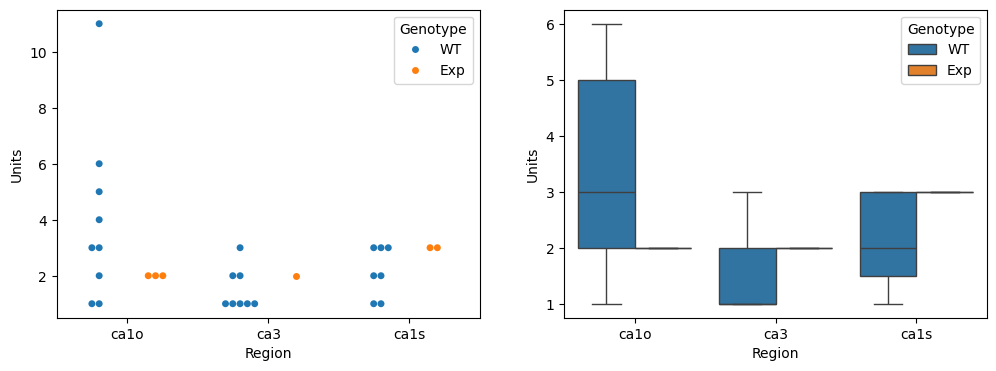

In [40]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
plt.subplots_adjust(wspace=0.2)
sns.swarmplot(data=df_opts_valid, x='Region', y='Units', hue='Genotype', dodge=True, ax=ax[0])
sns.boxplot(data=df_opts_valid, x='Region', y='Units', hue='Genotype', dodge=True, ax=ax[1], showfliers=False)
plt.savefig(base_folder_path / output_folder / "Unit Count")
plt.show()

In [57]:
# Add an extra row for the missing ca3 Exp genotype, to avoid StatAnnotations from crashing
# REMOVE IN THE FINAL RUNTHROUGH OF DATA
df_units.loc['9999-Exp-ca3-1'] = pd.Series({'ID':9999,
                                            'Genotype':'Exp',
                                            'Region':'ca3',
                                            'Filename':'name',
                                            'Waveforms':'waves',
                                            'Valid':True})
tempdf = df_units[(df_units['Region'] == 'ca3') & (df_units['Genotype'] == 'WT') & (df_units['Valid'])]
tempavg = tempdf.drop(columns=['ID', 'Genotype', 'Region', 'Filename', 'Waveforms', 'Valid']).mean()
df_units.loc['9999-Exp-ca3-1', tempavg.index] = tempavg
# df_units.loc['9999-Exp-ca3-1'] = df_units.loc['9999-Exp-ca3-1'].fillna(1)

display(df_units.tail())

,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1269-Exp-ca1o-2,1269,Exp,ca1o,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 2 units - 1 se...,2.0,-3.241955e+06,-0.195365,-4.596698e+08,9.398889e+09,0.093000,10.752688,0.114250,8.752735,0.289767,-3.647982,0.157579,0.000160,True
1269-Exp-ca1s-1,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2.629005e+06,-0.144125,-4.104038e+08,2.928580e+10,0.055000,18.181818,1.747000,0.572410,3.692966,-2.986297,3.962481,0.000160,True
1269-Exp-ca1s-2,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-9.600930e+06,-0.859224,-3.469843e+09,3.483516e+10,0.000000,inf,NaN,NaN,-1.301406,-3.063968,0.017509,0.001200,False
1269-Exp-ca1s-3,1269,Exp,ca1s,6.5,1269_EXP_Final Protocol 6th half + 1_4th quart...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1.610217e+06,-0.025180,-2.696869e+07,8.321838e+09,0.137000,7.299270,0.136500,7.326007,-0.015606,1.821988,0.019510,0.000160,True
9999-Exp-ca3-1,9999,Exp,ca3,5.888889,name,waves,1.777778,-2.240749e+06,-0.214749,-4.453480e+08,1.134802e+10,0.692889,6.801070,1.151299,3.231806,1.263031,-1.539764,3.442456,0.000204,True


,ID,Genotype,Region,Naive Optimal Depth,Filename,Waveforms,Units,Amplitude,P-T Ratio,Recovery Slope,Repolarization Slope,Mode ISI,Mode ISI Rate,Median ISI,Median ISI Rate,Slow ISI Skew,Fast ISI Skew,Firing Rate,Half Width,Valid
1133-WT-ca1o-1,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1380303.750,-0.294900,-3.430370e+08,4.563134e+09,7.319,0.136631,8.41400,0.118850,4.514486,-0.006936,0.036957,0.00024,True
1133-WT-ca1o-2,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1959315.750,-0.232559,-5.111473e+08,6.450244e+09,0.817,1.223990,4.26700,0.234357,1.432110,3.060253,0.257609,0.00020,True
1133-WT-ca1o-3,1133,WT,ca1o,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-1106396.625,-0.193530,-1.900401e+08,3.150308e+09,0.947,1.055966,6.40100,0.156226,0.691192,-1.258620,0.308696,0.00020,True
1133-WT-ca3-1,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-3276414.250,-0.181414,-4.569853e+08,1.011188e+10,0.134,7.462687,0.18850,5.305040,0.598696,-3.256058,0.452465,0.00024,True
1133-WT-ca3-2,1133,WT,ca3,5.5,1133_WT_5 half turns + 1-4th of full turn_righ...,WaveformExtractor: 4 channels - 3 units - 1 se...,3.0,-2383452.500,-0.180912,-3.944930e+08,4.529559e+09,0.096,10.416667,0.12725,7.858546,0.001105,-4.408912,0.774648,0.00020,True


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



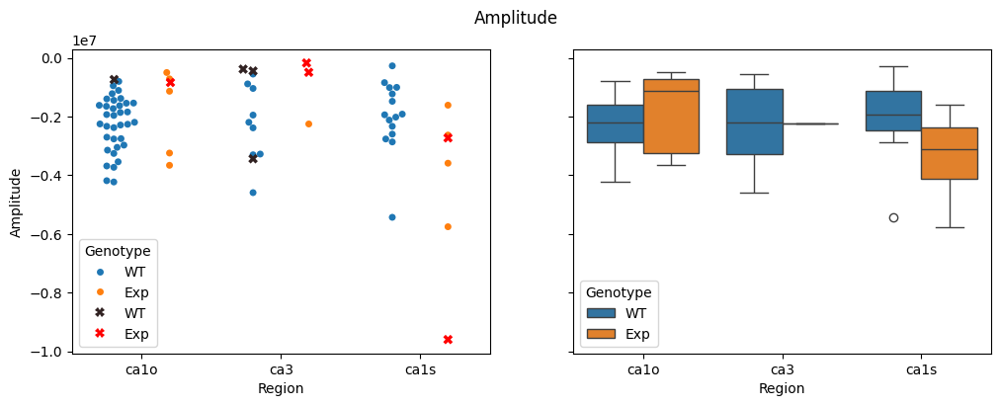

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.850e-02 U_stat=1.000e+01


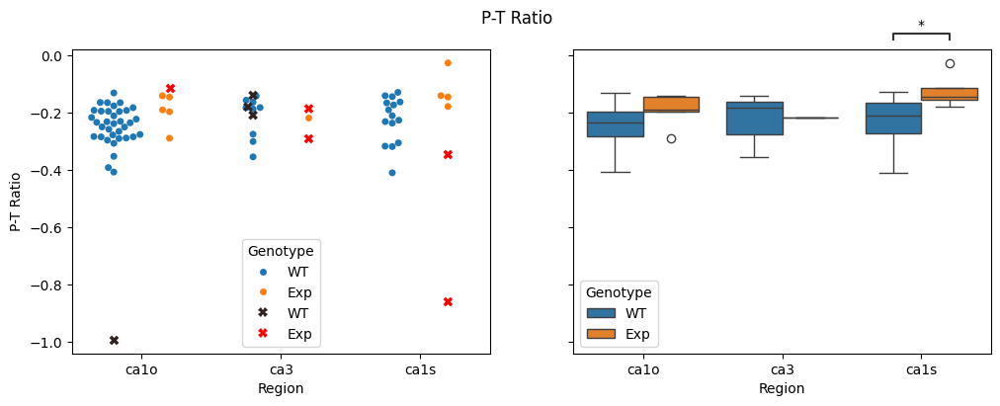

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



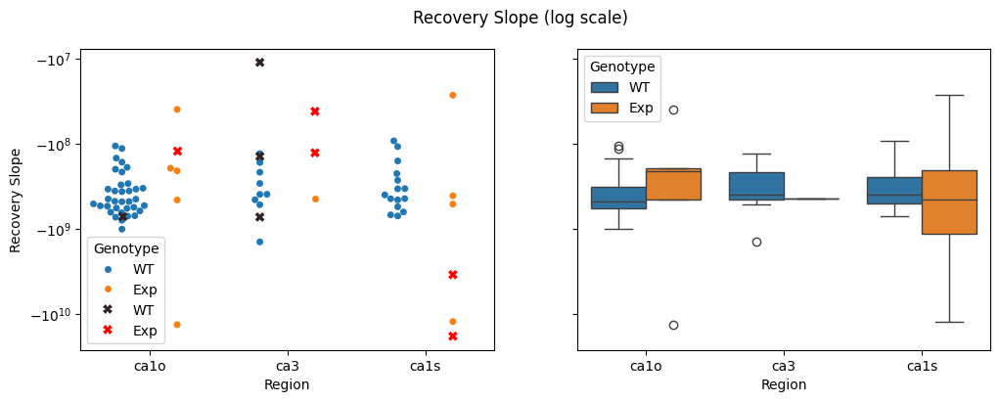

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.250e-02 U_stat=1.370e+02
ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:2.735e-02 U_stat=8.000e+00


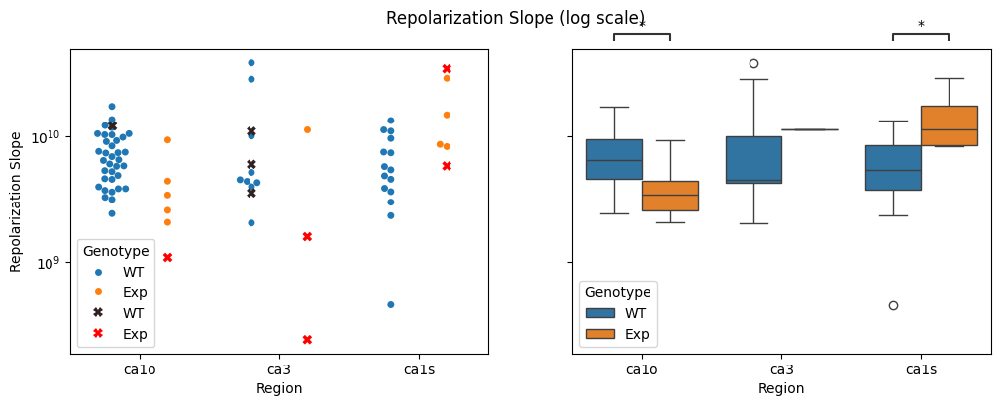

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



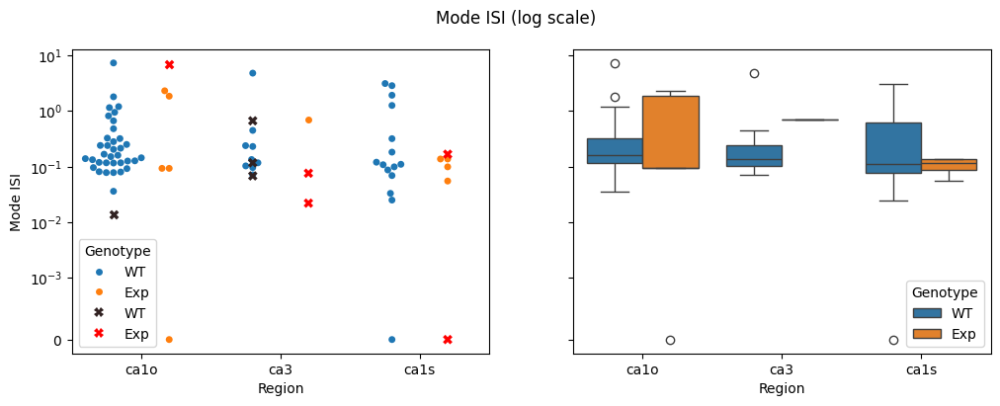

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



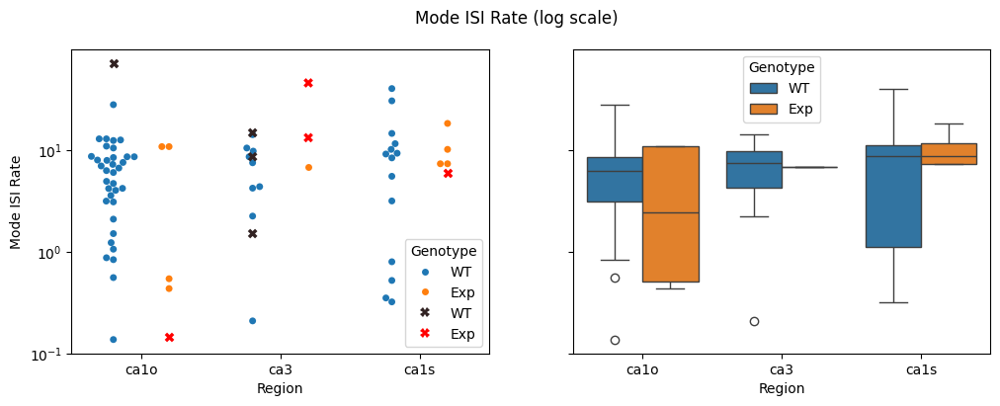

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.765e-02 U_stat=5.000e+01
ca3_WT vs. ca1s_WT: Mann-Whitney-Wilcoxon test two-sided, P_val:2.976e-02 U_stat=2.800e+01


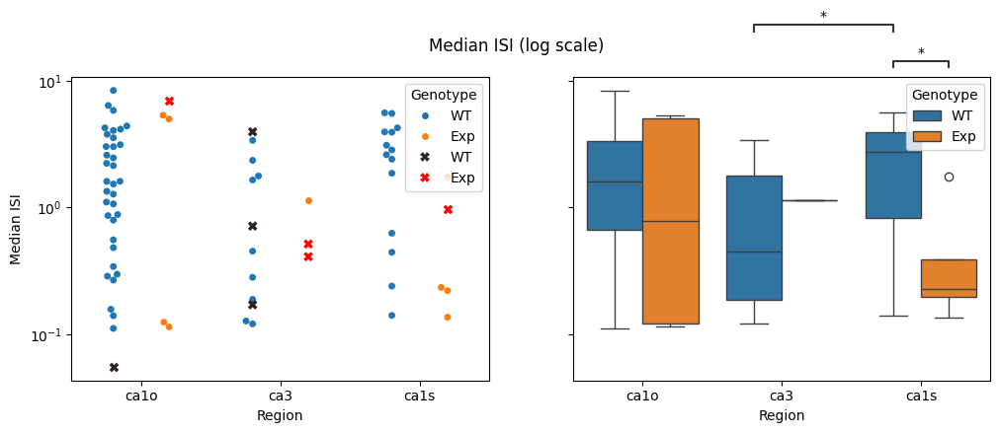

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1s_WT vs. ca1s_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.765e-02 U_stat=6.000e+00
ca3_WT vs. ca1s_WT: Mann-Whitney-Wilcoxon test two-sided, P_val:2.976e-02 U_stat=9.800e+01


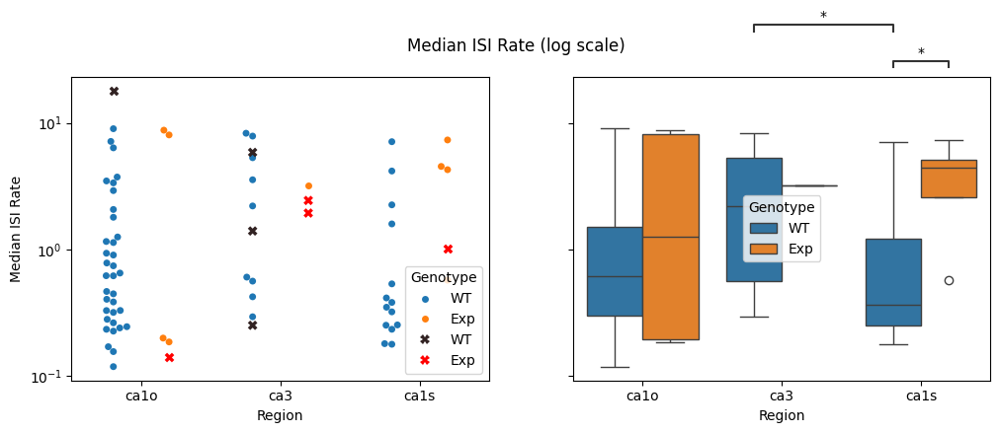

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



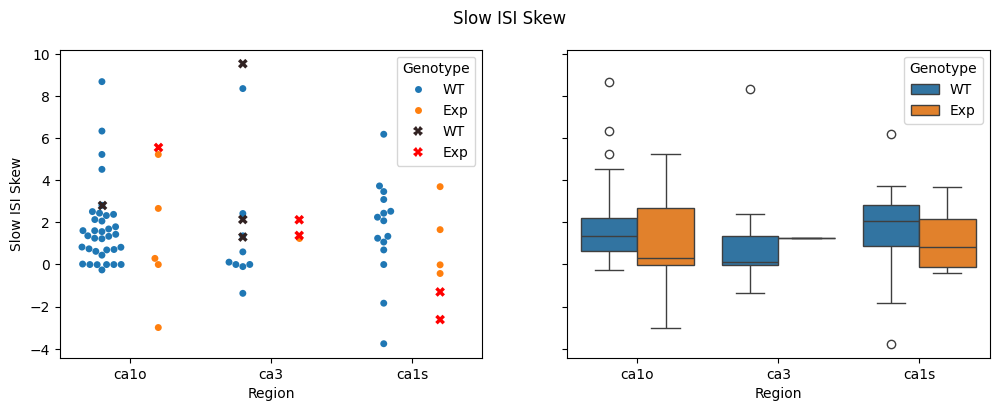

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04



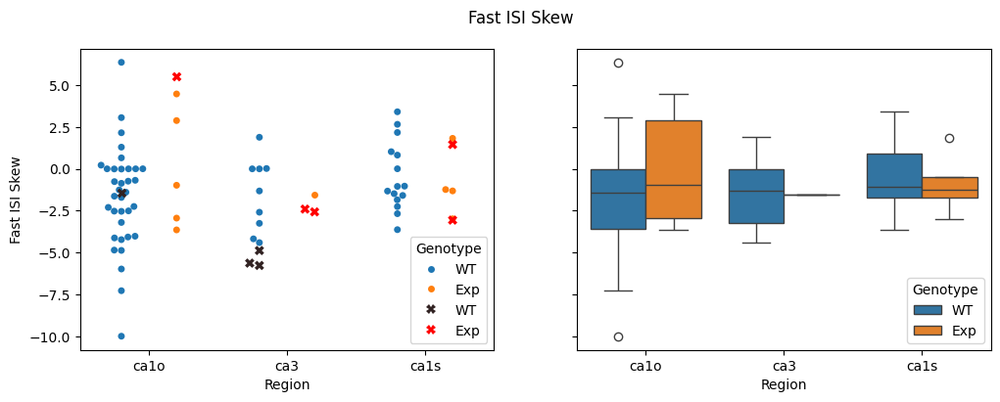

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:1.231e-02 U_stat=1.470e+02


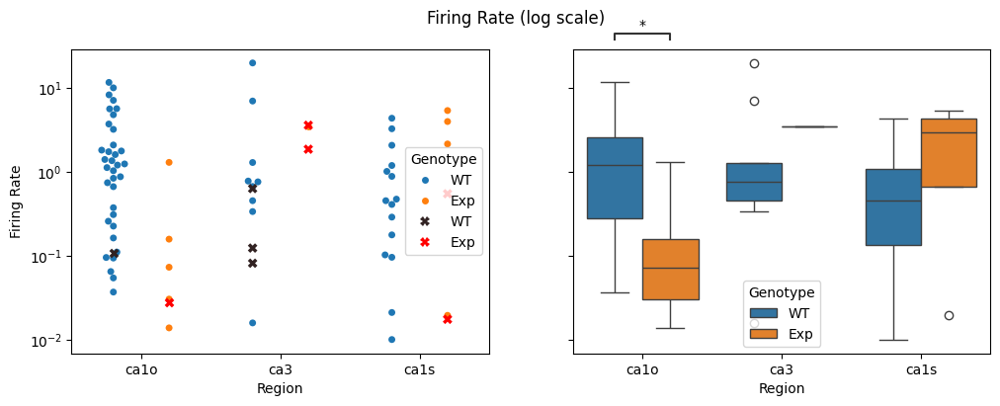

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

ca1o_WT vs. ca1o_Exp: Mann-Whitney-Wilcoxon test two-sided, P_val:4.345e-02 U_stat=1.355e+02


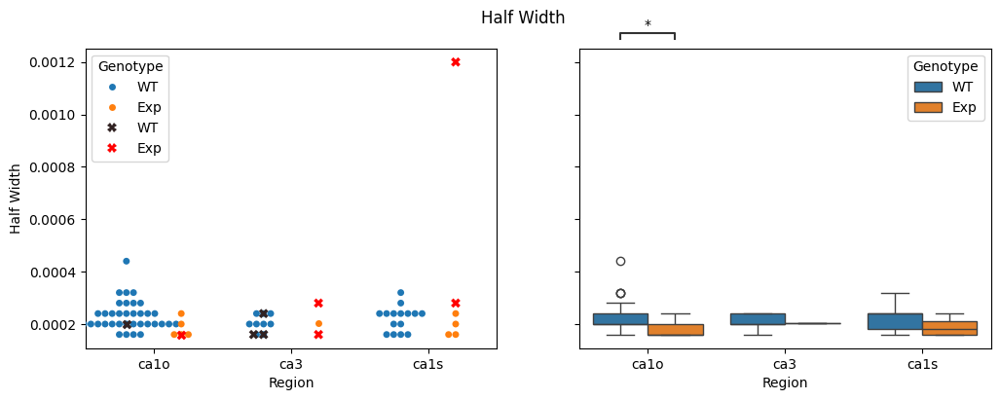

In [56]:
display(df_units.head())
metrics = include_cols
for met in metrics:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    plt.subplots_adjust(wspace=0.2)
    
    if ("Slope" in met or "ISI" in met or "Rate" in met) and "Skew" not in met:
        # ax[0].set_yscale("log")
        ax[0].set_yscale("symlog", linthresh=1e-3)
        fig.suptitle(f"{met} (log scale)")
    else:
        fig.suptitle(f"{met}")
    
    sns.swarmplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    # sns.stripplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    sns.swarmplot(data=df_units[df_units['Valid'] == False], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0], marker='X', size=7, palette='dark:red', alpha=1)
    sns.boxplot(data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype', dodge=True, ax=ax[1], showfliers=True)

    pairs=[
        (("ca1o", "WT"), ("ca1o", "Exp")), # WT vs Experimental
        (("ca3", "WT"), ("ca3", "Exp")),
        (("ca1s", "WT"), ("ca1s", "Exp")),
        (("ca1o", "WT"), ("ca1s", "WT")), # WT Regions vs.
        (("ca1s", "WT"), ("ca3", "WT")),
        (("ca3", "WT"), ("ca1o", "WT")),
        (("ca1o", "Exp"), ("ca1s", "Exp")), # Exp Regions vs.
        (("ca1s", "Exp"), ("ca3", "Exp")),
        (("ca3", "Exp"), ("ca1o", "Exp")),
    ]
    annotator = Annotator(ax[1], pairs, data=df_units[df_units['Valid']], x='Region', y=met, hue='Genotype')
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside', hide_non_significant=True)
    annotator.apply_and_annotate()
    # starbars.draw_annotation(pairs, ax=ax[1])
    
    plt.savefig(base_folder_path / output_folder / f"{met}")
    plt.show()

In [ ]:
display(df_units_avgs.head())
metrics = include_cols
for met in metrics:
    fig, ax = plt.subplots(1, 2, figsize=(12, 4))
    plt.subplots_adjust(wspace=0.2)
    sns.swarmplot(data=df_units_avgs, x='Region', y=met, hue='Genotype', dodge=True, ax=ax[0])
    sns.boxplot(data=df_units_avgs, x='Region', y=met, hue='Genotype', dodge=True, ax=ax[1], showfliers=True)
    fig.suptitle(f"{met} (Aggregated)")
    plt.savefig(base_folder_path / output_folder / f"{met} (Aggregated)")
    plt.plot()
    